## Import & Misc.

In [151]:
#!pip install torch==1.8.1+cpu torchvision==0.9.1+cpu torchaudio==0.8.1 -f https://download.pytorch.org/whl/torch_stable.html
import torch
import math
import torch.nn.functional as F
#from icecream import ic

In [22]:
#model = torch.load('/home/olab/itayitzhak/bpeplus/fairseq/checkpoints/transformer_tokens2char_he_opt0/checkpoint_best.pt')
#model = torch.load('/home/olab/itayitzhak/bpeplus/fairseq/checkpoints/transformer_tokens2char_rerun_opt0/checkpoint_best.pt')
model = torch.load('/home/olab/itayitzhak/bpeplus/fairseq/checkpoints/transformer_tokens2char_en-he_opt2_medium_reversed/checkpoint_best.pt')
pre_trained_emb = model['model']['decoder.embed_tokens.weight']

### Find k-nearest words for each word

In [65]:
pre_trained_emb

tensor([[ 0.0241, -0.0207, -0.0268,  ..., -0.0408,  0.0224, -0.0162],
        [ 0.0268,  0.0486, -0.0051,  ..., -0.0576,  0.0213, -0.0562],
        [-0.0074,  0.0190, -0.0569,  ...,  0.1310, -0.0430, -0.0299],
        ...,
        [ 0.0527,  0.0206, -0.0615,  ..., -0.0958, -0.0414, -0.0269],
        [ 0.1315, -0.0169,  0.0013,  ..., -0.1142, -0.0228, -0.1505],
        [-0.0148,  0.0068,  0.0446,  ..., -0.0516,  0.0817, -0.1035]])

In [2]:
def get_cosine_sim(emb_for_cosine):
    emb_nor = torch.linalg.norm(emb_for_cosine, ord=2, dim=-1)
    emb_nor = emb_nor.unsqueeze(1).expand(emb_for_cosine.size())
    sims = emb_for_cosine/emb_nor
    sims = sims @ sims.T
    return sims

#get_cosine_sim(pre_trained_emb)

In [3]:
def print_top_k_similar(emb, dic, begin_index=0,k = 10):
    #cos_sim = torch.nn.CosineSimilarity(dim=-1)
    sims = get_cosine_sim(emb)
    top_k = torch.topk(sims, k=k, dim=-1)[1]#[begin_index:begin_index+amount, :]
    amount = emb.shape[0]

    for i in range(amount):
        print("")
        print('\033[1m' + dic[i+begin_index], end = " - ")
        for j in range(k):
            print('\033[0m ('+dic[top_k[i][j]], end = ",")
            #print('i:%d, j:%d'%(begin_index+i,top_k[i][j]) , end = ",")
            #print("%.2f" % cos_sim(emb[begin_index+i],emb[top_k[i][j]]).item(), end =") ")
            print("%.2f" % sims[i,top_k[i][j]].item(), end =") ")
        #print("="*180)
        print("")

#print_top_k_similar(emb, dic)

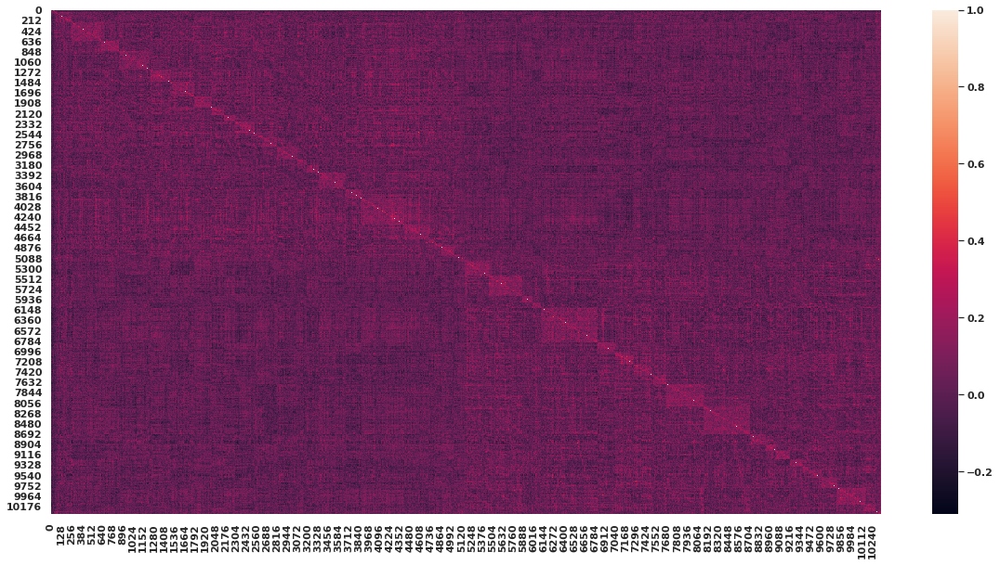

In [652]:
ax = sns.heatmap(get_cosine_sim(pre_trained_emb).numpy())

In [66]:
print_top_k_similar(pre_trained_emb, dic, k=5)


<S> -  (<S>,1.00)  (<pad>,0.80)  (<unk>,0.66)  (madeupword0004,0.64)  (madeupword0003,0.64) 

<pad> -  (<pad>,1.00)  (madeupword0003,0.80)  (madeupword0004,0.80)  (<unk>,0.80)  (<S>,0.80) 

</S> -  (</S>,1.00)  (הנתונים,0.23)  (חזקים,0.23)  (marketing,0.22)  (מחקרים,0.21) 

<unk> -  (<unk>,1.00)  (<pad>,0.80)  (<S>,0.66)  (madeupword0002,0.63)  (madeupword0003,0.62) 

!!@@ -  (!!@@,1.00)  (ם!!@@,0.23)  (r!!@@,0.23)  (ן!!@@,0.22)  (ו!!@@,0.22) 

e!!@@ -  (e!!@@,1.00)  (o!!@@,0.37)  (a!!@@,0.36)  (i!!@@,0.35)  (y!!@@,0.31) 

י!!@@ -  (י!!@@,1.00)  (ו!!@@,0.36)  (ר!!@@,0.27)  (ב!!@@,0.26)  (ה!!@@,0.26) 

ו!!@@ -  (ו!!@@,1.00)  (י!!@@,0.36)  (-!!@@,0.28)  (.!!@@,0.26)  (ט!!@@,0.26) 

i!!@@ -  (i!!@@,1.00)  (o!!@@,0.36)  (e!!@@,0.35)  (u!!@@,0.35)  (a!!@@,0.34) 

s!!@@ -  (s!!@@,1.00)  (t!!@@,0.31)  (3!!@@,0.29)  (n!!@@,0.27)  (g!!@@,0.25) 

a!!@@ -  (a!!@@,1.00)  (o!!@@,0.36)  (e!!@@,0.36)  (i!!@@,0.34)  (u!!@@,0.33) 

t!!@@ -  (t!!@@,1.00)  (s!!@@,0.31)  (k!!@@,0.26)  (p!!@@,0.24)  (d!!@

26 -  (26,1.00)  (16,0.38)  (24,0.38)  (6,0.36)  (2006,0.35) 

27 -  (27,1.00)  (28,0.38)  (22,0.37)  (2007,0.37)  (7,0.37) 

28 -  (28,1.00)  (22,0.41)  (2008,0.40)  (27,0.38)  (8,0.37) 

29 -  (29,1.00)  (9,0.36)  (99,0.36)  (26,0.32)  (27,0.31) 

2@@ -  (2@@,1.00)  (2.@@,0.34)  (2,@@,0.33)  (21@@,0.33)  (22,0.32) 

3 -  (3,1.00)  (3d,0.38)  (23,0.37)  (3@@,0.36)  (35,0.36) 

3,000 -  (3,000,1.00)  (30,000,0.47)  (5,000,0.42)  (,000,0.40)  (4,000,0.39) 

3.@@ -  (3.@@,1.00)  (3@@,0.39)  (2.@@,0.29)  (0.@@,0.27)  (35,0.27) 

30 -  (30,1.00)  (3d,0.36)  (300,0.36)  (35,0.35)  (3,0.34) 

30,000 -  (30,000,1.00)  (3,000,0.47)  (00,000,0.44)  (50,000,0.41)  (2003,0.41) 

300 -  (300,1.00)  (30,0.36)  (30,000,0.35)  (000,0.33)  (2003,0.33) 

32 -  (32,1.00)  (23,0.46)  (24,0.38)  (3d,0.36)  (22,0.35) 

35 -  (35,1.00)  (45,0.38)  (3,0.36)  (25,0.35)  (30,0.35) 

3@@ -  (3@@,1.00)  (3.@@,0.39)  (3,0.36)  (3d,0.31)  (00@@,0.30) 

3d -  (3d,1.00)  (3,0.38)  (23,0.37)  (32,0.36)  (30,0.36) 

4

allow -  (allow,1.00)  (allows,0.41)  (allowed,0.36)  (follow,0.35)  (walls,0.34) 

allowed -  (allowed,1.00)  (followed,0.44)  (allows,0.42)  (allow,0.36)  (developed,0.35) 

allows -  (allows,1.00)  (allowed,0.42)  (allow,0.41)  (allo@@,0.36)  (following,0.36) 

alls -  (alls,1.00)  (ells,0.41)  (all,0.40)  (ills,0.39)  (als,0.39) 

ally -  (ally,1.00)  (apply,0.34)  (alls,0.34)  (all,0.33)  (ably,0.32) 

almost -  (almost,1.00)  (lost,0.33)  (atmosphere,0.32)  (artist,0.31)  (astronom@@,0.31) 

alo@@ -  (alo@@,1.00)  (aly@@,0.30)  (alone,0.29)  (analy@@,0.29)  (are@@,0.29) 

alone -  (alone,1.00)  (along,0.41)  (anyone,0.36)  (done,0.30)  (none,0.30) 

along -  (along,1.00)  (alone,0.41)  (among,0.40)  (aling,0.34)  (long,0.32) 

already -  (already,1.00)  (areas,0.34)  (area,0.32)  (yesterday,0.32)  (-year-old,0.30) 

als -  (als,1.00)  (alls,0.39)  (ads,0.34)  (asks,0.30)  (sha,0.30) 

also -  (also,1.00)  (ano,0.32)  (ally,0.31)  (alls,0.30)  (ously,0.29) 

alter@@ -  (alter@@,1.

avail@@ -  (avail@@,1.00)  (available,0.38)  (vail@@,0.30)  (advan@@,0.30)  (achieve,0.29) 

available -  (available,1.00)  (valuable,0.47)  (capable,0.39)  (sustainable,0.38)  (avail@@,0.38) 

average -  (average,1.00)  (verage,0.39)  (engage,0.36)  (awareness,0.36)  (available,0.35) 

avo@@ -  (avo@@,1.00)  (a-@@,0.31)  (goo@@,0.31)  (above,0.29)  (af@@,0.29) 

avoid -  (avoid,1.00)  (david,0.36)  (aid,0.34)  (obvious,0.33)  (ood,0.32) 

aw@@ -  (aw@@,1.00)  (af@@,0.30)  (app@@,0.29)  (awar@@,0.29)  (anyway,0.27) 

awar@@ -  (awar@@,1.00)  (aware,0.33)  (away,0.32)  (aw@@,0.29)  (avail@@,0.28) 

aware -  (aware,1.00)  (awareness,0.39)  (away,0.36)  (ahead,0.34)  (awar@@,0.33) 

awareness -  (awareness,1.00)  (generally,0.40)  (aware,0.39)  (afghanistan,0.38)  (eness,0.37) 

away -  (away,1.00)  (anyway,0.43)  (ay,0.38)  (way,0.37)  (ya,0.36) 

awful -  (awful,1.00)  (powerful,0.36)  (afford,0.35)  (useful,0.34)  (adults,0.33) 

ax@@ -  (ax@@,1.00)  (ama@@,0.28)  (ara@@,0.27)  (galaxy

building -  (building,1.00)  (buildings,0.58)  (bringing,0.39)  (individuals,0.39)  (build,0.37) 

buildings -  (buildings,1.00)  (building,0.58)  (individuals,0.43)  (bringing,0.40)  (brings,0.39) 

built -  (built,1.00)  (build,0.41)  (but,0.36)  (building,0.36)  (buildings,0.35) 

bul@@ -  (bul@@,1.00)  (buil@@,0.33)  (bl@@,0.30)  (bubble,0.29)  (bly,0.28) 

bun@@ -  (bun@@,1.00)  (sun,0.30)  (bu@@,0.29)  (bb@@,0.29)  (ban@@,0.28) 

bunch -  (bunch,1.00)  (lunch,0.44)  (function,0.36)  (french,0.35)  (bush,0.35) 

bur@@ -  (bur@@,1.00)  (bru@@,0.30)  (fur@@,0.28)  (bun@@,0.26)  (b@@,0.26) 

bus -  (bus,1.00)  (bs,0.35)  (sus,0.33)  (bubble,0.30)  (guys,0.30) 

bush -  (bush,1.00)  (british,0.35)  (bunch,0.35)  (husband,0.33)  (push,0.33) 

business -  (business,1.00)  (businesses,0.50)  (business@@,0.47)  (happiness,0.37)  (scientists,0.36) 

business@@ -  (business@@,1.00)  (businesses,0.51)  (business,0.47)  (success@@,0.37)  (benef@@,0.35) 

businesses -  (businesses,1.00)  (busi

clearly -  (clearly,1.00)  (nearly,0.36)  (larly,0.36)  (charles,0.36)  (early,0.35) 

cles -  (cles,1.00)  (charles,0.38)  (tles,0.37)  (class,0.34)  (sell,0.34) 

cli@@ -  (cli@@,1.00)  (clin@@,0.28)  (cl@@,0.28)  (cla@@,0.27)  (clo@@,0.25) 

click -  (click,1.00)  (clock,0.45)  (clinical,0.36)  (quick,0.34)  (conflict,0.34) 

climate -  (climate,1.00)  (timate,0.30)  (complete,0.29)  (ultimately,0.28)  (chemicals,0.27) 

clin@@ -  (clin@@,1.00)  (clinical,0.32)  (conflic@@,0.30)  (cli@@,0.28)  (clo@@,0.27) 

clinical -  (clinical,1.00)  (click,0.36)  (illing,0.32)  (technical,0.32)  (link,0.32) 

clo@@ -  (clo@@,1.00)  (cle@@,0.31)  (cro@@,0.30)  (clou@@,0.29)  (class@@,0.29) 

clock -  (clock,1.00)  (click,0.45)  (block,0.42)  (blocks,0.36)  (check,0.34) 

close -  (close,1.00)  (choose,0.41)  (closed,0.37)  (closer,0.36)  (case,0.31) 

closed -  (closed,1.00)  (closer,0.38)  (close,0.37)  (cloud,0.30)  (looked,0.28) 

closer -  (closer,1.00)  (closed,0.38)  (close,0.36)  (classroo

cy@@ -  (cy@@,1.00)  (by@@,0.26)  (ey@@,0.26)  (che@@,0.26)  (ancy,0.25) 

cycle -  (cycle,1.00)  (circle,0.39)  (ency,0.34)  (cy,0.32)  (muscle,0.32) 

d -  (d,1.00)  (id,0.36)  (dad,0.33)  (ed,0.33)  (did,0.32) 

d-@@ -  (d-@@,1.00)  (g-@@,0.32)  (de-@@,0.30)  (david,0.29)  (ve-@@,0.29) 

d@@ -  (d@@,1.00)  (dd@@,0.31)  (dro@@,0.30)  (d,0.30)  (del@@,0.29) 

da -  (da,1.00)  (ad,0.36)  (aid,0.35)  (add,0.34)  (data,0.33) 

da@@ -  (da@@,1.00)  (dad,0.37)  (dan@@,0.34)  (dea@@,0.33)  (dead,0.32) 

dad -  (dad,1.00)  (did,0.40)  (dead,0.39)  (da@@,0.37)  (ded,0.37) 

daily -  (daily,1.00)  (day,0.35)  (dly,0.32)  (failed,0.31)  (details,0.30) 

dam@@ -  (dam@@,1.00)  (dar@@,0.31)  (dama@@,0.30)  (dat@@,0.27)  (dist@@,0.27) 

dama@@ -  (dama@@,1.00)  (damage,0.37)  (mathema@@,0.32)  (adap@@,0.31)  (diag@@,0.30) 

damage -  (damage,1.00)  (engage,0.38)  (dama@@,0.37)  (manage,0.36)  (advantage,0.32) 

dan -  (dan,1.00)  (dad,0.34)  (data,0.34)  (don,0.33)  (dn,0.32) 

dan@@ -  (dan@@,1.0

domin@@ -  (domin@@,1.00)  (demon@@,0.29)  (dom@@,0.28)  (dom,0.26)  (don@@,0.25) 

don -  (don,1.00)  (den,0.33)  (dan,0.33)  (nor,0.33)  (done,0.33) 

don@@ -  (don@@,1.00)  (done,0.33)  (don,0.30)  (does@@,0.29)  (dan@@,0.29) 

done -  (done,1.00)  (none,0.34)  (don@@,0.33)  (one,0.33)  (don,0.33) 

door -  (door,1.00)  (room,0.38)  (hood,0.37)  (ood,0.36)  (roots,0.36) 

dots -  (dots,1.00)  (stood,0.44)  (bots,0.37)  (states,0.35)  (ots,0.35) 

dou@@ -  (dou@@,1.00)  (door,0.32)  (daugh@@,0.30)  (stood,0.30)  (hood,0.29) 

doub@@ -  (doub@@,1.00)  (double,0.34)  (neighborhood,0.33)  (daugh@@,0.33)  (deb@@,0.30) 

double -  (double,1.00)  (trouble,0.41)  (youtube,0.37)  (blood,0.36)  (bubble,0.35) 

down -  (down,1.00)  (town,0.43)  (own,0.40)  (known,0.36)  (shown,0.36) 

down@@ -  (down@@,1.00)  (down,0.33)  (window,0.30)  (known,0.28)  (wood,0.27) 

dp -  (dp,1.00)  (gdp,0.42)  (dd@@,0.35)  (mp,0.34)  (pped,0.32) 

dr. -  (dr.,1.00)  (mr.,0.40)  (drink,0.35)  (k.,0.35)  (..,0.33

entrepr@@ -  (entrepr@@,1.00)  (entreprene@@,0.46)  (pregn@@,0.33)  (interest@@,0.32)  (interpre@@,0.32) 

entreprene@@ -  (entreprene@@,1.00)  (entrepr@@,0.46)  (entre@@,0.40)  (interpre@@,0.36)  (represen@@,0.36) 

ents -  (ents,1.00)  (ests,0.39)  (events,0.38)  (ste,0.38)  (ens,0.36) 

envi@@ -  (envi@@,1.00)  (environ@@,0.30)  (eff@@,0.29)  (evidence,0.28)  (inven@@,0.28) 

environ@@ -  (environ@@,1.00)  (environment,0.43)  (environmental,0.42)  (engineering,0.33)  (encoun@@,0.31) 

environment -  (environment,1.00)  (environmental,0.57)  (environ@@,0.43)  (engineering,0.37)  (invent,0.36) 

environmental -  (environmental,1.00)  (environment,0.57)  (fundamental,0.46)  (environ@@,0.42)  (international,0.41) 

ep -  (ep,1.00)  (pe,0.41)  (up,0.33)  (pe@@,0.33)  (ple,0.32) 

ep@@ -  (ep@@,1.00)  (epide@@,0.34)  (ev@@,0.32)  (e@@,0.32)  (es@@,0.30) 

epide@@ -  (epide@@,1.00)  (epidemic,0.43)  (ide@@,0.37)  (ep@@,0.34)  (ei@@,0.33) 

epidemic -  (epidemic,1.00)  (epide@@,0.43)  (life

feelings -  (feelings,1.00)  (feeling,0.48)  (feels,0.46)  (fields,0.35)  (engineering,0.35) 

feels -  (feels,1.00)  (feelings,0.46)  (sleep,0.45)  (feeling,0.39)  (feel@@,0.39) 

feet -  (feet,1.00)  (feel,0.40)  (feel@@,0.39)  (meet,0.37)  (ft,0.37) 

fel@@ -  (fel@@,1.00)  (fell,0.32)  (feels,0.31)  (feel@@,0.31)  (feel,0.30) 

fell -  (fell,1.00)  (feel,0.40)  (full,0.40)  (cell,0.38)  (well,0.37) 

fellow -  (fellow,1.00)  (follow,0.41)  (followed,0.39)  (yellow,0.37)  (fell,0.37) 

felt -  (felt,1.00)  (left,0.38)  (fellow,0.35)  (tle,0.34)  (text,0.34) 

fem@@ -  (fem@@,1.00)  (feed@@,0.30)  (fer@@,0.30)  (fam@@,0.29)  (fran@@,0.27) 

female -  (female,1.00)  (elements,0.30)  (failed,0.28)  (temperature,0.28)  (lease,0.28) 

fer -  (fer,1.00)  (fewer,0.38)  (ber,0.34)  (fear,0.34)  (fair,0.34) 

fer@@ -  (fer@@,1.00)  (forests,0.30)  (feed,0.30)  (fem@@,0.30)  (fre@@,0.28) 

ference -  (ference,1.00)  (conference,0.43)  (difference,0.38)  (differences,0.36)  (experience,0.36) 


geogra@@ -  (geogra@@,1.00)  (george,0.40)  (google,0.38)  (geor@@,0.38)  (gene@@,0.35) 

geor@@ -  (geor@@,1.00)  (geogra@@,0.38)  (george,0.35)  (green@@,0.33)  (goes,0.32) 

george -  (george,1.00)  (geogra@@,0.40)  (google,0.38)  (genome,0.35)  (geor@@,0.35) 

ger -  (ger,1.00)  (gar,0.34)  (get,0.33)  (ree,0.31)  (green,0.31) 

ger@@ -  (ger@@,1.00)  (gener@@,0.30)  (ge@@,0.29)  (goo@@,0.29)  (gene@@,0.28) 

gers -  (gers,1.00)  (wers,0.34)  (thers,0.33)  (girls,0.32)  (gress,0.31) 

ges -  (ges,1.00)  (genes,0.37)  (gets,0.36)  (goes,0.35)  (ged,0.34) 

gest -  (gest,1.00)  (greatest,0.38)  (gement,0.36)  (west,0.36)  (get,0.36) 

get -  (get,1.00)  (gets,0.39)  (yet,0.38)  (got,0.37)  (ght,0.37) 

gets -  (gets,1.00)  (getting,0.39)  (get,0.39)  (steps,0.39)  (states,0.37) 

getting -  (getting,1.00)  (setting,0.46)  (putting,0.45)  (cutting,0.42)  (gotten,0.42) 

gg@@ -  (gg@@,1.00)  (eggs,0.41)  (g@@,0.41)  (gt,0.37)  (ge@@,0.35) 

ggle -  (ggle,1.00)  (gle,0.39)  (eggs,0.38) 

hood -  (hood,1.00)  (ood,0.42)  (door,0.37)  (wood,0.34)  (looked,0.34) 

hope -  (hope,1.00)  (hole,0.34)  (home,0.33)  (europe,0.33)  (ech,0.30) 

hope@@ -  (hope@@,1.00)  (howe@@,0.35)  (home@@,0.31)  (hou@@,0.29)  (hospit@@,0.27) 

hopefully -  (hopefully,1.00)  (powerful,0.38)  (especially,0.36)  (eventually,0.34)  (useful,0.33) 

hor@@ -  (hor@@,1.00)  (horri@@,0.37)  (hon@@,0.32)  (shor@@,0.29)  (hot@@,0.29) 

horri@@ -  (horri@@,1.00)  (hor@@,0.37)  (history,0.31)  (terri@@,0.30)  (hearing,0.29) 

hosp@@ -  (hosp@@,1.00)  (hospit@@,0.31)  (hot@@,0.29)  (happ@@,0.28)  (has@@,0.27) 

hospit@@ -  (hospit@@,1.00)  (hospital,0.36)  (habit@@,0.33)  (hosp@@,0.31)  (oppos@@,0.29) 

hospital -  (hospital,1.00)  (hospit@@,0.36)  (lations,0.33)  (capital,0.32)  (lish,0.31) 

hot -  (hot,1.00)  (heat,0.39)  (how,0.35)  (foot,0.33)  (too,0.33) 

hot@@ -  (hot@@,1.00)  (oth,0.32)  (howe@@,0.31)  (hous@@,0.30)  (hon@@,0.30) 

hou@@ -  (hou@@,1.00)  (shou@@,0.30)  (hi@@,0.30)  (hu@@,0.30)  (h

integr@@ -  (integr@@,1.00)  (interest@@,0.35)  (interested,0.34)  (invest@@,0.32)  (intelligent,0.32) 

intel@@ -  (intel@@,1.00)  (intellig@@,0.30)  (inten@@,0.30)  (invol@@,0.30)  (intellec@@,0.29) 

intellec@@ -  (intellec@@,1.00)  (intelligence,0.41)  (intellig@@,0.41)  (intellectual,0.41)  (intelligent,0.39) 

intellectual -  (intellectual,1.00)  (intelligent,0.46)  (intelligence,0.45)  (electrical,0.43)  (intellec@@,0.41) 

intellig@@ -  (intellig@@,1.00)  (intelligent,0.43)  (intellec@@,0.41)  (intelligence,0.41)  (interest@@,0.34) 

intelligence -  (intelligence,1.00)  (intelligent,0.61)  (intellectual,0.45)  (intellec@@,0.41)  (intellig@@,0.41) 

intelligent -  (intelligent,1.00)  (intelligence,0.61)  (intellectual,0.46)  (intellig@@,0.43)  (intellec@@,0.39) 

inten@@ -  (inten@@,1.00)  (invented,0.37)  (internet,0.35)  (infin@@,0.34)  (inte@@,0.33) 

inter@@ -  (inter@@,1.00)  (interest@@,0.31)  (integr@@,0.28)  (internet,0.28)  (incredi@@,0.27) 

interact -  (interact,1.00)

lations -  (lations,1.00)  (location,0.33)  (hospital,0.33)  (solutions,0.33)  (lation,0.33) 

lau@@ -  (lau@@,1.00)  (laun@@,0.33)  (laugh@@,0.31)  (la@@,0.31)  (lou@@,0.31) 

laugh@@ -  (laugh@@,1.00)  (lau@@,0.31)  (ligh@@,0.31)  (unusual,0.30)  (langu@@,0.30) 

laun@@ -  (laun@@,1.00)  (lau@@,0.33)  (unusual,0.32)  (land@@,0.28)  (launched,0.28) 

launched -  (launched,1.00)  (hundred,0.35)  (intellectual,0.32)  (wonderful,0.31)  (lunch,0.31) 

law -  (law,1.00)  (wall,0.37)  (low,0.34)  (lay,0.33)  (laws,0.32) 

law@@ -  (law@@,1.00)  (lap@@,0.32)  (lab@@,0.31)  (low-@@,0.29)  (lead@@,0.29) 

laws -  (laws,1.00)  (news,0.33)  (law,0.32)  (slowly,0.32)  (allows,0.32) 

lay -  (lay,1.00)  (law,0.33)  (lady,0.32)  (ya,0.31)  (day,0.30) 

layer -  (layer,1.00)  (player,0.38)  (players,0.32)  (later,0.30)  (ray,0.29) 

ld -  (ld,1.00)  (dn,0.34)  (lt,0.33)  (land,0.32)  (dly,0.31) 

le -  (le,1.00)  (el,0.34)  (ell,0.34)  (lose,0.32)  (il,0.32) 

le-@@ -  (le-@@,1.00)  (l-@@,0.30)  (le

mary -  (mary,1.00)  (many,0.34)  (may,0.32)  (trum,0.28)  (my,0.27) 

mas -  (mas,1.00)  (mass,0.37)  (sm,0.33)  (gas,0.33)  (say,0.33) 

mas@@ -  (mas@@,1.00)  (may@@,0.28)  (mars,0.28)  (mass,0.28)  (magaz@@,0.27) 

mass -  (mass,1.00)  (pass,0.38)  (mas,0.37)  (ss,0.34)  (maps,0.34) 

massive -  (massive,1.00)  (message,0.42)  (missing,0.39)  (mission,0.33)  (emissions,0.33) 

master -  (master,1.00)  (faster,0.36)  (disaster,0.29)  (must,0.29)  (matter,0.28) 

mat@@ -  (mat@@,1.00)  (meat,0.30)  (mot@@,0.28)  (meta@@,0.27)  (mas@@,0.27) 

match -  (match,1.00)  (catch,0.40)  (watch,0.39)  (math,0.36)  (watching,0.36) 

mate -  (mate,1.00)  (make,0.34)  (state,0.31)  (timate,0.29)  (male,0.29) 

materi@@ -  (materi@@,1.00)  (material,0.31)  (mathe@@,0.30)  (mathema@@,0.29)  (strate@@,0.28) 

material -  (material,1.00)  (materials,0.43)  (mathematical,0.36)  (malaria,0.34)  (materi@@,0.31) 

materials -  (materials,1.00)  (material,0.43)  (details,0.32)  (malaria,0.32)  (makers,0.3

music -  (music,1.00)  (musical,0.38)  (musici@@,0.32)  (matic,0.32)  (magic,0.31) 

musical -  (musical,1.00)  (music,0.38)  (usual,0.30)  (medical,0.29)  (logical,0.28) 

musici@@ -  (musici@@,1.00)  (music,0.32)  (physici@@,0.32)  (musc@@,0.29)  (musli@@,0.29) 

musli@@ -  (musli@@,1.00)  (musici@@,0.29)  (mul@@,0.27)  (musc@@,0.26)  (milli@@,0.25) 

must -  (must,1.00)  (trust,0.36)  (trum,0.34)  (just,0.33)  (most,0.31) 

my -  (my,1.00)  (may,0.34)  (vy,0.32)  (zy,0.30)  (gy,0.29) 

my@@ -  (my@@,1.00)  (mb@@,0.32)  (mag@@,0.31)  (mi@@,0.31)  (maj@@,0.29) 

myself -  (myself,1.00)  (systems,0.36)  (himself,0.35)  (flying,0.34)  (yourself,0.34) 

n -  (n,1.00)  (l,0.35)  (on,0.34)  (fun,0.34)  (ns,0.34) 

n@@ -  (n@@,1.00)  (na@@,0.32)  (nu@@,0.30)  (r@@,0.29)  (non@@,0.28) 

na -  (na,1.00)  (an,0.39)  (ant,0.36)  (ans,0.36)  (man,0.36) 

na@@ -  (na@@,1.00)  (nas@@,0.32)  (n@@,0.32)  (natu@@,0.32)  (nan@@,0.31) 

nal -  (nal,1.00)  (ran,0.35)  (lin,0.34)  (land,0.32)  (learn,0.3

ordin@@ -  (ordin@@,1.00)  (ordinary,0.33)  (origin@@,0.32)  (oran@@,0.31)  (organ@@,0.31) 

ordinary -  (ordinary,1.00)  (extraordinary,0.44)  (olutionary,0.36)  (original,0.36)  (organization,0.35) 

ore -  (ore,1.00)  (ore@@,0.35)  (one,0.34)  (are,0.33)  (eria,0.32) 

ore@@ -  (ore@@,1.00)  (ore,0.35)  (over@@,0.34)  (o@@,0.29)  (ori@@,0.29) 

org@@ -  (org@@,1.00)  (ogra@@,0.31)  (orig@@,0.30)  (ors,0.29)  (ong,0.28) 

organ@@ -  (organ@@,1.00)  (organiz@@,0.36)  (oran@@,0.36)  (organs,0.34)  (organized,0.31) 

organic -  (organic,1.00)  (organization,0.36)  (organisms,0.35)  (organiz@@,0.34)  (organized,0.34) 

organisms -  (organisms,1.00)  (organizations,0.40)  (organs,0.40)  (organic,0.35)  (isms,0.35) 

organiz@@ -  (organiz@@,1.00)  (organized,0.44)  (organization,0.43)  (organizations,0.41)  (organ@@,0.36) 

organization -  (organization,1.00)  (organizations,0.59)  (organized,0.48)  (organiz@@,0.43)  (imagination,0.43) 

organizations -  (organizations,1.00)  (organization

platform -  (platform,1.00)  (patterns,0.35)  (transform,0.35)  (comfortable,0.34)  (multiple,0.34) 

play -  (play,1.00)  (player,0.34)  (playing,0.34)  (pay,0.33)  (plane,0.32) 

play@@ -  (play@@,1.00)  (player,0.33)  (players,0.33)  (playing,0.32)  (plan@@,0.29) 

played -  (played,1.00)  (players,0.42)  (player,0.37)  (playing,0.36)  (peace,0.31) 

player -  (player,1.00)  (players,0.41)  (layer,0.38)  (played,0.37)  (play,0.34) 

players -  (players,1.00)  (played,0.42)  (player,0.41)  (playing,0.35)  (makers,0.34) 

playing -  (playing,1.00)  (paying,0.43)  (played,0.36)  (speaking,0.35)  (players,0.35) 

ple -  (ple,1.00)  (plus,0.33)  (help,0.32)  (ep,0.32)  (plane,0.32) 

ple@@ -  (ple@@,1.00)  (pal@@,0.32)  (ple,0.30)  (pe@@,0.30)  (pl@@,0.29) 

plea@@ -  (plea@@,1.00)  (please,0.37)  (plan@@,0.30)  (pal@@,0.28)  (pla@@,0.28) 

please -  (please,1.00)  (release,0.42)  (peace,0.40)  (lease,0.40)  (pleasure,0.39) 

pleasure -  (pleasure,1.00)  (pressure,0.44)  (measure,0.43)  

radio -  (radio,1.00)  (radiation,0.42)  (raid,0.32)  (video,0.32)  (radi@@,0.31) 

raid -  (raid,1.00)  (rain,0.34)  (raised,0.32)  (paid,0.32)  (radio,0.32) 

rain -  (rain,1.00)  (train,0.41)  (near,0.37)  (raid,0.34)  (run,0.32) 

rain@@ -  (rain@@,1.00)  (rais@@,0.31)  (ran@@,0.30)  (brain,0.29)  (raid,0.28) 

rais@@ -  (rais@@,1.00)  (rain@@,0.31)  (raise,0.31)  (raised,0.29)  (raid,0.28) 

raise -  (raise,1.00)  (raised,0.39)  (asia,0.35)  (sian,0.33)  (isra@@,0.32) 

raised -  (raised,1.00)  (raise,0.39)  (designer,0.33)  (raid,0.32)  (trained,0.32) 

ral -  (ral,1.00)  (rural,0.37)  (ler,0.33)  (ror,0.32)  (l,0.30) 

ran -  (ran,1.00)  (ner,0.38)  (nor,0.36)  (nal,0.35)  (run,0.33) 

ran@@ -  (ran@@,1.00)  (r@@,0.32)  (rain@@,0.30)  (rant,0.30)  (ren@@,0.30) 

random -  (random,1.00)  (grandmother,0.34)  (london,0.30)  (lands,0.30)  (transform,0.28) 

range -  (range,1.00)  (strange,0.36)  (manage,0.34)  (large,0.31)  (change,0.31) 

rant -  (rant,1.00)  (partner,0.34)  (want,

sal -  (sal,1.00)  (tal,0.33)  (lars,0.32)  (last,0.32)  (san,0.32) 

sal@@ -  (sal@@,1.00)  (sar@@,0.36)  (sav@@,0.36)  (sla@@,0.30)  (sa@@,0.29) 

sam@@ -  (sam@@,1.00)  (sac@@,0.30)  (sym@@,0.29)  (same,0.28)  (says,0.28) 

same -  (same,1.00)  (safe,0.41)  (some,0.34)  (save,0.34)  (shape,0.32) 

san -  (san,1.00)  (van,0.36)  (nasa,0.36)  (ns,0.34)  (sian,0.33) 

san@@ -  (san@@,1.00)  (sna@@,0.35)  (sand@@,0.35)  (san,0.33)  (sav@@,0.31) 

sand -  (sand,1.00)  (hand,0.37)  (land,0.34)  (sad,0.33)  (said,0.33) 

sand@@ -  (sand@@,1.00)  (san@@,0.35)  (ans@@,0.33)  (sac@@,0.32)  (hands,0.32) 

sar@@ -  (sar@@,1.00)  (sal@@,0.36)  (sac@@,0.31)  (says,0.31)  (stances,0.30) 

sat -  (sat,1.00)  (ts,0.37)  (sa,0.37)  (at,0.35)  (states,0.35) 

sat@@ -  (sat@@,1.00)  (satis@@,0.36)  (sau@@,0.36)  (susta@@,0.34)  (sett@@,0.34) 

satellit@@ -  (satellit@@,1.00)  (intellectual,0.38)  (satis@@,0.37)  (satur@@,0.35)  (alter@@,0.34) 

satis@@ -  (satis@@,1.00)  (statistics,0.38)  (satellit@@,


sitting -  (sitting,1.00)  (setting,0.43)  (fighting,0.41)  (tting,0.41)  (institute,0.41) 

situ@@ -  (situ@@,1.00)  (stitu@@,0.33)  (situation,0.33)  (initi@@,0.31)  (studi@@,0.30) 

situation -  (situation,1.00)  (institutions,0.41)  (station,0.40)  (radiation,0.39)  (itation,0.39) 

sity -  (sity,1.00)  (sit,0.32)  (osity,0.32)  (site,0.31)  (sibility,0.31) 

sive -  (sive,1.00)  (save,0.36)  (side,0.33)  (site,0.33)  (size,0.32) 

sively -  (sively,1.00)  (simply,0.32)  (vely,0.31)  (analysis,0.31)  (lives,0.29) 

six -  (six,1.00)  (fix,0.39)  (sex,0.38)  (sis,0.35)  (xes,0.34) 

size -  (size,1.00)  (ize,0.36)  (sive,0.32)  (site,0.31)  (side,0.30) 

sk@@ -  (sk@@,1.00)  (ske@@,0.36)  (asks,0.35)  (sky,0.32)  (st@@,0.32) 

ske@@ -  (ske@@,1.00)  (sk@@,0.36)  (swe@@,0.34)  (she@@,0.34)  (eds,0.32) 

skele@@ -  (skele@@,1.00)  (ele@@,0.33)  (ske@@,0.32)  (stea@@,0.31)  (kel@@,0.31) 

skills -  (skills,1.00)  (still,0.44)  (ills,0.40)  (fields,0.39)  (ells,0.38) 

skin -  (skin,1.

stories -  (stories,1.00)  (ories,0.45)  (series,0.40)  (roots,0.37)  (story,0.37) 

stors -  (stors,1.00)  (stars,0.42)  (tors,0.41)  (roots,0.38)  (sters,0.38) 

story -  (story,1.00)  (stery,0.42)  (stories,0.37)  (story@@,0.35)  (stry,0.31) 

story@@ -  (story@@,1.00)  (story,0.35)  (stor@@,0.32)  (stories,0.31)  (prototy@@,0.30) 

str@@ -  (str@@,1.00)  (sw@@,0.32)  (s@@,0.32)  (sts,0.32)  (starts,0.31) 

stra@@ -  (stra@@,1.00)  (starts,0.34)  (stre@@,0.33)  (stro@@,0.31)  (stri@@,0.31) 

straight -  (straight,1.00)  (thoughts,0.35)  (rights,0.35)  (taught,0.34)  (lights,0.34) 

stran@@ -  (stran@@,1.00)  (stron@@,0.37)  (starts,0.35)  (stru@@,0.33)  (strange,0.33) 

strange -  (strange,1.00)  (stance,0.41)  (strong,0.37)  (starting,0.37)  (range,0.36) 

strate@@ -  (strate@@,1.00)  (streets,0.40)  (strategy,0.39)  (stat@@,0.35)  (stration,0.34) 

strategy -  (strategy,1.00)  (states,0.41)  (strate@@,0.39)  (suggests,0.37)  (totally,0.35) 

stration -  (stration,1.00)  (station,0

tex -  (tex,1.00)  (text,0.37)  (ket,0.31)  (ten,0.30)  (set,0.30) 

tex@@ -  (tex@@,1.00)  (tea@@,0.31)  (text,0.29)  (test,0.29)  (tox@@,0.28) 

text -  (text,1.00)  (context,0.38)  (tex,0.37)  (treat,0.34)  (felt,0.34) 

th -  (th,1.00)  (ths,0.34)  (thy,0.33)  (that,0.32)  (ght,0.31) 

th-@@ -  (th-@@,1.00)  (thu@@,0.32)  (the-@@,0.31)  (thinks,0.31)  (ght,0.29) 

th@@ -  (th@@,1.00)  (thre@@,0.33)  (ths,0.33)  (tt@@,0.32)  (thro@@,0.32) 

than -  (than,1.00)  (then,0.39)  (thanks,0.38)  (thank,0.36)  (ton,0.35) 

than@@ -  (than@@,1.00)  (thanks,0.38)  (thank,0.34)  (that,0.34)  (tan@@,0.32) 

thank -  (thank,1.00)  (thanks,0.51)  (think,0.47)  (thinking,0.39)  (thinks,0.38) 

thanks -  (thanks,1.00)  (thank,0.51)  (thinks,0.50)  (thinking,0.45)  (talks,0.42) 

that -  (that,1.00)  (what,0.40)  (thank,0.36)  (taught,0.36)  (thanks,0.36) 

the -  (the,1.00)  (three,0.39)  (these,0.38)  (there,0.38)  (she,0.36) 

the-@@ -  (the-@@,1.00)  (they,0.32)  (th-@@,0.31)  (there@@,0.31)  (t

trust -  (trust,1.00)  (artist,0.40)  (short,0.37)  (tract,0.37)  (truth,0.37) 

truth -  (truth,1.00)  (fourth,0.37)  (trust,0.37)  (birth,0.35)  (heart,0.34) 

try -  (try,1.00)  (tly,0.35)  (dry,0.32)  (thy,0.32)  (gry,0.32) 

trying -  (trying,1.00)  (rying,0.40)  (lying,0.39)  (training,0.37)  (studying,0.35) 

ts -  (ts,1.00)  (st,0.44)  (sat,0.37)  (tics,0.36)  (t,0.33) 

tt@@ -  (tt@@,1.00)  (att@@,0.40)  (tot@@,0.40)  (tv,0.37)  (t@@,0.36) 

tter -  (tter,1.00)  (letter,0.42)  (twitter,0.40)  (better,0.39)  (ter,0.38) 

tting -  (tting,1.00)  (cutting,0.43)  (putting,0.42)  (setting,0.42)  (sitting,0.41) 

tu@@ -  (tu@@,1.00)  (ut@@,0.36)  (tt@@,0.31)  (titu@@,0.30)  (tru@@,0.29) 

tual -  (tual,1.00)  (tural,0.41)  (tually,0.39)  (ual,0.38)  (tal,0.35) 

tually -  (tually,1.00)  (totally,0.41)  (usually,0.40)  (sually,0.40)  (tual,0.39) 

tube -  (tube,1.00)  (youtube,0.36)  (titude,0.36)  (about,0.35)  (but,0.34) 

tum -  (tum,1.00)  (put,0.35)  (cut,0.33)  (um,0.32)  (turn,

wal@@ -  (wal@@,1.00)  (wat@@,0.31)  (walked,0.29)  (law,0.29)  (wash@@,0.28) 

walk -  (walk,1.00)  (walked,0.41)  (walking,0.40)  (talk,0.37)  (know,0.35) 

walked -  (walked,1.00)  (talked,0.45)  (walk,0.41)  (walking,0.41)  (talks,0.38) 

walking -  (walking,1.00)  (talking,0.42)  (walked,0.41)  (walk,0.40)  (working,0.39) 

wall -  (wall,1.00)  (will,0.39)  (walls,0.37)  (well,0.37)  (ball,0.37) 

walls -  (walls,1.00)  (skills,0.38)  (calls,0.37)  (wall,0.37)  (tells,0.35) 

wan@@ -  (wan@@,1.00)  (was@@,0.32)  (war@@,0.31)  (wn@@,0.29)  (wn,0.28) 

want -  (want,1.00)  (wants,0.36)  (went,0.33)  (rant,0.32)  (wanted,0.32) 

wanted -  (wanted,1.00)  (mented,0.36)  (knew,0.36)  (walked,0.33)  (wants,0.33) 

wants -  (wants,1.00)  (stant,0.36)  (stan@@,0.36)  (want,0.36)  (walls,0.35) 

war -  (war,1.00)  (wear,0.38)  (water,0.29)  (wer,0.28)  (ry,0.28) 

war@@ -  (war@@,1.00)  (wan@@,0.31)  (wa@@,0.28)  (ward,0.27)  (wat@@,0.25) 

ward -  (ward,1.00)  (draw,0.41)  (drew,0.41)  (wa

z -  (z,1.00)  (z@@,0.37)  (zy,0.34)  (zes,0.34)  (v,0.34) 

z@@ -  (z@@,1.00)  (z,0.37)  (zz@@,0.35)  (zo@@,0.32)  (gaz@@,0.30) 

za -  (za,1.00)  (z,0.33)  (zing,0.32)  (anz@@,0.31)  (a,0.31) 

ze -  (ze,1.00)  (zes,0.35)  (zed,0.33)  (zy,0.33)  (ee,0.33) 

ze@@ -  (ze@@,1.00)  (zo@@,0.29)  (z,0.29)  (zes,0.27)  (zer@@,0.27) 

zed -  (zed,1.00)  (ze,0.33)  (ded,0.32)  (zes,0.32)  (needed,0.31) 

zen -  (zen,1.00)  (gen,0.36)  (ten,0.33)  (an,0.33)  (zing,0.32) 

zer@@ -  (zer@@,1.00)  (zz@@,0.29)  (ze@@,0.27)  (cer@@,0.24)  (z@@,0.24) 

zero -  (zero,1.00)  (zone,0.28)  (ore,0.27)  (ories,0.27)  (zes,0.26) 

zes -  (zes,1.00)  (ze,0.35)  (z,0.34)  (zed,0.32)  (zen,0.29) 

zing -  (zing,1.00)  (izing,0.38)  (wing,0.34)  (ving,0.33)  (zz@@,0.33) 

zo@@ -  (zo@@,1.00)  (z@@,0.32)  (ze@@,0.29)  (vo@@,0.29)  (goo@@,0.28) 

zone -  (zone,1.00)  (none,0.35)  (gone,0.35)  (zen,0.31)  (zing,0.30) 

zy -  (zy,1.00)  (vy,0.37)  (z,0.34)  (ze,0.33)  (crazy,0.33) 

zz@@ -  (zz@@,1.00)  (z@@,0.35)

איידס -  (איידס,1.00)  (טיימס,0.38)  (סייה,0.33)  (דיי,0.32)  (גייס,0.32) 

איים -  (איים,1.00)  (איי@@,0.38)  (אליים,0.36)  (טיים,0.34)  (יים,0.34) 

איך -  (איך,1.00)  (אך,0.44)  (ואיך,0.37)  (אינך,0.35)  (ריך,0.33) 

איכות -  (איכות,1.00)  (תוכנית,0.33)  (אכפת,0.32)  (ציאות,0.31)  (הבריאות,0.30) 

איכשהו -  (איכשהו,1.00)  (כשהיא,0.43)  (ועכשיו,0.38)  (כשהייתי,0.37)  (והיא,0.36) 

אילו -  (אילו,1.00)  (והיא,0.33)  (חילו,0.33)  (ולית,0.31)  (ולא,0.31) 

אים -  (אים,1.00)  (אם,0.31)  (אבים,0.30)  (אתם,0.29)  (נאים,0.28) 

אימה -  (אימה,1.00)  (אישה,0.38)  (אמיתי,0.33)  (אמה,0.33)  (המילה,0.33) 

אין -  (אין,1.00)  (טין,0.36)  (נין,0.30)  (אית,0.29)  (אכן,0.28) 

אינ@@ -  (אינ@@,1.00)  (איני,0.27)  (אינטואי@@,0.27)  (אינט@@,0.26)  (אינטליגנ@@,0.26) 

אינה -  (אינה,1.00)  (איננה,0.36)  (אה,0.31)  (הנשיא,0.30)  (אלה,0.29) 

אינו -  (אינו,1.00)  (איננו,0.34)  (איתנו,0.33)  (אינני,0.30)  (אילו,0.30) 

אינט@@ -  (אינט@@,1.00)  (אינטרא@@,0.35)  (אנטי@@,0.33)  (אינטר@@,0.33)  (באינטרנט,0.33) 


באמת -  (באמת,1.00)  (שבאמת,0.40)  (באמ@@,0.35)  (אמת,0.35)  (האמת,0.34) 

באנשים -  (באנשים,1.00)  (לאנשים,0.39)  (מאנשים,0.39)  (שאנשים,0.37)  (האנשים,0.36) 

באפריקה -  (באפריקה,1.00)  (באמריקה,0.49)  (אפריקה,0.43)  (האמריקאי,0.42)  (באירופה,0.42) 

באר@@ -  (באר@@,1.00)  (בארץ,0.39)  (בערך,0.34)  (בארה,0.34)  (באמצ@@,0.30) 

בארה -  (בארה,1.00)  (באר@@,0.34)  (ברה,0.33)  (הראשו@@,0.33)  (בחברה,0.32) 

בארץ -  (בארץ,1.00)  (הארץ,0.40)  (באר@@,0.39)  (ארץ,0.38)  (בערך,0.35) 

בארצות -  (בארצות,1.00)  (באמצעות,0.40)  (ארצות,0.37)  (האפשרות,0.35)  (בעזרת,0.35) 

באתר -  (באתר,1.00)  (לאתר,0.42)  (אתר,0.40)  (בתא,0.38)  (ראתי,0.37) 

בב -  (בב,1.00)  (ביב,0.40)  (בוב,0.37)  (לב,0.35)  (בב@@,0.34) 

בב@@ -  (בב@@,1.00)  (בב,0.34)  (בבק@@,0.34)  (בבו@@,0.34)  (לב@@,0.33) 

בבו@@ -  (בבו@@,1.00)  (בבי@@,0.37)  (בב@@,0.34)  (בב,0.31)  (בבית,0.30) 

בבוקר -  (בבוקר,1.00)  (בבירור,0.45)  (הבוקר,0.41)  (בוקר,0.41)  (במחקר,0.35) 

בבי@@ -  (בבי@@,1.00)  (בבים,0.38)  (בבו@@,0.37)  (בבית,0.36)  (

במח@@ -  (במח@@,1.00)  (במחקר,0.33)  (למח@@,0.31)  (במי@@,0.31)  (במע@@,0.30) 

במחקר -  (במחקר,1.00)  (המחקר,0.46)  (מחקר,0.44)  (במקרה,0.41)  (במרחק,0.40) 

במי@@ -  (במי@@,1.00)  (במש@@,0.31)  (במ@@,0.31)  (במח@@,0.31)  (במצ@@,0.30) 

במידה -  (במידה,1.00)  (למידה,0.40)  (במדינה,0.37)  (מימדי,0.34)  (במעבדה,0.31) 

במיוחד -  (במיוחד,1.00)  (מיוחד,0.48)  (ביחד,0.38)  (יוחד,0.38)  (במונחים,0.33) 

במילים -  (במילים,1.00)  (המילים,0.45)  (בשבילי,0.42)  (בילים,0.41)  (בימים,0.38) 

במים -  (במים,1.00)  (בימים,0.38)  (במילים,0.36)  (ימים,0.33)  (למים,0.33) 

במס@@ -  (במס@@,1.00)  (במש@@,0.31)  (במצ@@,0.30)  (מע@@,0.30)  (במע@@,0.28) 

במע@@ -  (במע@@,1.00)  (במש@@,0.33)  (במצ@@,0.33)  (המערב,0.32)  (ברע@@,0.30) 

במעבדה -  (במעבדה,1.00)  (בעבודה,0.43)  (במערכת,0.39)  (העובדה,0.39)  (בדברים,0.37) 

במערכת -  (במערכת,1.00)  (למערכת,0.59)  (מערכת,0.53)  (המערכת,0.50)  (המערכות,0.46) 

במצ@@ -  (במצ@@,1.00)  (במצב,0.35)  (במ@@,0.33)  (במע@@,0.33)  (במש@@,0.32) 

במצב -  (במצב,1.00)  (בקצב,0

גבי@@ -  (גבי@@,1.00)  (גב@@,0.34)  (גבוהים,0.30)  (גמי@@,0.29)  (בבי@@,0.29) 

גבר -  (גבר,1.00)  (גבי,0.34)  (גברים,0.32)  (דבר,0.32)  (בעבר,0.30) 

גברים -  (גברים,1.00)  (הגברים,0.39)  (חברים,0.34)  (מהדברים,0.34)  (הדברים,0.34) 

גד -  (גד,1.00)  (דג,0.42)  (גיד,0.35)  (ג,0.30)  (גוד,0.29) 

גד@@ -  (גד@@,1.00)  (גז@@,0.27)  (גדלים,0.27)  (געים,0.25)  (ד-@@,0.25) 

גדול -  (גדול,1.00)  (לגדול,0.38)  (הגדול,0.34)  (גדולים,0.33)  (גדל,0.33) 

גדול@@ -  (גדול@@,1.00)  (גדולה,0.33)  (גדולות,0.33)  (הגדול@@,0.32)  (לגדול,0.30) 

גדולה -  (גדולה,1.00)  (הגדולה,0.43)  (גדולות,0.41)  (גדלה,0.38)  (הגדול,0.34) 

גדולות -  (גדולות,1.00)  (הגדולות,0.51)  (גדולים,0.41)  (גדולה,0.41)  (גלובלית,0.40) 

גדולים -  (גדולים,1.00)  (גדלים,0.43)  (הגדולים,0.42)  (גדולות,0.41)  (הגדולות,0.38) 

גדל -  (גדל,1.00)  (גדול,0.33)  (לגדל,0.30)  (גדלה,0.30)  (לדעת,0.29) 

גדלה -  (גדלה,1.00)  (גדולה,0.38)  (הגדולה,0.34)  (גדלים,0.33)  (עלה,0.31) 

גדלים -  (גדלים,1.00)  (גדולים,0.43)  (גדולות,0.34)  (גדלתי,0

דקים -  (דקים,1.00)  (מחקרים,0.28)  (חיידקים,0.27)  (דם,0.27)  (קד,0.27) 

דר -  (דר,1.00)  (רד,0.36)  (דבר,0.31)  (דיר,0.31)  (רך,0.30) 

דר@@ -  (דר@@,1.00)  (דרי@@,0.29)  (דרו@@,0.28)  (דרך,0.25)  (דא@@,0.24) 

דרה -  (דרה,1.00)  (דרך,0.33)  (דרת,0.32)  (דה,0.31)  (ארד,0.30) 

דרו -  (דרו,1.00)  (דרות,0.34)  (יורד,0.32)  (דרום,0.30)  (לשרוד,0.30) 

דרו@@ -  (דרו@@,1.00)  (דר@@,0.28)  (דרות,0.28)  (דרך,0.28)  (דרי@@,0.27) 

דרום -  (דרום,1.00)  (לגרום,0.36)  (בדרום,0.35)  (דרים,0.31)  (דולרים,0.30) 

דרות -  (דרות,1.00)  (דרת,0.38)  (דרו,0.34)  (צרות,0.31)  (דמות,0.31) 

דרי@@ -  (דרי@@,1.00)  (אדרי@@,0.31)  (דינ@@,0.30)  (דיברתי,0.30)  (דמיי@@,0.30) 

דרים -  (דרים,1.00)  (דרך,0.36)  (דרכים,0.34)  (דברים,0.32)  (להרים,0.32) 

דרך -  (דרך,1.00)  (הדרך,0.38)  (דרת,0.37)  (ודרך,0.36)  (דרים,0.36) 

דרכים -  (דרכים,1.00)  (הדרכים,0.43)  (בדרכים,0.43)  (צריכים,0.40)  (דרים,0.34) 

דרש -  (דרש,1.00)  (דורש,0.34)  (לשרוד,0.33)  (שרת,0.31)  (שרה,0.31) 

דרת -  (דרת,1.00)  (דרות,0.38)  (דרך,

הזה -  (הזה,1.00)  (שזה,0.40)  (הזאת,0.37)  (הפה,0.36)  (בזה,0.36) 

הזו -  (הזו,1.00)  (וזה,0.39)  (הזה,0.35)  (וזהו,0.34)  (זוז,0.33) 

הזו@@ -  (הזו@@,1.00)  (התחו@@,0.29)  (הזה,0.28)  (התשו@@,0.28)  (וזה,0.26) 

הזמן -  (הזמן,1.00)  (בזמן,0.42)  (זמן,0.36)  (הקטן,0.34)  (זמה,0.33) 

הח@@ -  (הח@@,1.00)  (האהו@@,0.30)  (q@@,0.30)  (הסט@@,0.30)  (המ@@,0.30) 

החבר -  (החבר,1.00)  (החברה,0.36)  (בעבר,0.35)  (להתחבר,0.34)  (החבר@@,0.34) 

החבר@@ -  (החבר@@,1.00)  (הבחי@@,0.38)  (החברתית,0.38)  (החברה,0.35)  (החבר,0.34) 

החברה -  (החברה,1.00)  (בחברה,0.40)  (בחזרה,0.40)  (שעברה,0.38)  (חברה,0.38) 

החברות -  (החברות,1.00)  (החברתית,0.39)  (האפשרות,0.37)  (החברים,0.36)  (חברתיות,0.35) 

החברים -  (החברים,1.00)  (הגברים,0.44)  (החברתית,0.39)  (החברות,0.36)  (הדברים,0.36) 

החברתית -  (החברתית,1.00)  (חברתית,0.55)  (האמיתית,0.47)  (חברתיות,0.44)  (החברים,0.39) 

החד@@ -  (החד@@,1.00)  (החדשים,0.32)  (החלי@@,0.31)  (חד@@,0.31)  (ההתחלה,0.29) 

החדש -  (החדש,1.00)  (החדשה,0.41)  (שדה,0.38) 

המכונה -  (המכונה,1.00)  (הנכונה,0.43)  (המכוניות,0.39)  (נכונה,0.37)  (מכונה,0.36) 

המכוניות -  (המכוניות,1.00)  (המכונית,0.49)  (מכוניות,0.44)  (הזדמנויות,0.40)  (הטכנולוגיות,0.39) 

המכונית -  (המכונית,1.00)  (המכוניות,0.49)  (מכונית,0.39)  (התמונות,0.36)  (המכונה,0.35) 

המכשיר -  (המכשיר,1.00)  (מכשיר,0.47)  (כשיר,0.36)  (המרכזי,0.35)  (המוזיקה,0.34) 

המלחמה -  (המלחמה,1.00)  (מלחמה,0.43)  (מלחמת,0.42)  (המחלה,0.41)  (הממשלה,0.40) 

הממ@@ -  (הממ@@,1.00)  (ממו@@,0.35)  (ממש@@,0.35)  (מהמ@@,0.35)  (המז@@,0.34) 

הממוצע -  (הממוצע,1.00)  (עצומה,0.45)  (מוצע,0.39)  (עצמו,0.37)  (עצמה,0.35) 

הממשל -  (הממשל,1.00)  (הממשלה,0.58)  (למשל,0.40)  (לשמש,0.38)  (משמאל,0.37) 

הממשלה -  (הממשלה,1.00)  (הממשל,0.58)  (המשימה,0.42)  (המלחמה,0.40)  (המחשבה,0.38) 

המנ@@ -  (המנ@@,1.00)  (המס@@,0.31)  (המ@@,0.29)  (המנהי@@,0.27)  (המשו@@,0.27) 

המנהי@@ -  (המנהי@@,1.00)  (המדהים,0.40)  (מדהימה,0.34)  (מנהי@@,0.34)  (הקהילה,0.32) 

המס@@ -  (המס@@,1.00)  (המסך,0.34)  (הס@@,0.33)  (המסו@@,0.32) 

הרגע -  (הרגע,1.00)  (ברגע,0.35)  (לרגע,0.35)  (ערה,0.34)  (כרגע,0.34) 

הרגשה -  (הרגשה,1.00)  (הרגשתי,0.42)  (שקרה,0.34)  (הרגע,0.33)  (הממשלה,0.32) 

הרגשתי -  (הרגשתי,1.00)  (הרגשה,0.42)  (פגשתי,0.40)  (השתמשו,0.37)  (שעשיתי,0.35) 

הרה -  (הרה,1.00)  (הפה,0.39)  (הרבה,0.36)  (הלה,0.36)  (טרה,0.36) 

הרו@@ -  (הרו@@,1.00)  (הרי@@,0.27)  (התר@@,0.26)  (הרוו@@,0.26)  (הב@@,0.25) 

הרובוט -  (הרובוט,1.00)  (רובוט,0.43)  (טובה,0.42)  (רובוטים,0.40)  (טובות,0.40) 

הרוו@@ -  (הרוו@@,1.00)  (השוו@@,0.33)  (הרפו@@,0.28)  (הקרו@@,0.28)  (רוו@@,0.28) 

הרוח -  (הרוח,1.00)  (אחורה,0.31)  (החוויה,0.28)  (חולה,0.27)  (חזרה,0.27) 

הרחוב -  (הרחוב,1.00)  (בוחרים,0.41)  (רחוב,0.37)  (החשוב,0.33)  (בוגרים,0.33) 

הרי -  (הרי,1.00)  (ירה,0.43)  (בירה,0.35)  (הי,0.32)  (הרה,0.32) 

הרי@@ -  (הרי@@,1.00)  (ירה,0.33)  (הקרי@@,0.29)  (הרה,0.28)  (הרכ@@,0.28) 

הריים -  (הריים,1.00)  (ריירה,0.41)  (החיים,0.37)  (הערים,0.36)  (הייתם,0.34) 

הרים -  (הרים,1.00)  (הערים,0.33)  (הריים,0.33)  (להרים,0.32)  

וז@@ -  (וז@@,1.00)  (וזהו,0.37)  (וצ@@,0.32)  (וזו,0.30)  (שזו,0.29) 

וזאת -  (וזאת,1.00)  (כזאת,0.46)  (הזאת,0.44)  (זאת,0.37)  (ואת,0.35) 

וזה -  (וזה,1.00)  (הזו,0.39)  (הזה,0.34)  (וזהו,0.32)  (הקו,0.32) 

וזהו -  (וזהו,1.00)  (שזהו,0.47)  (וזו,0.41)  (זהו,0.38)  (וז@@,0.37) 

וזו -  (וזו,1.00)  (וזהו,0.41)  (שזו,0.39)  (זו,0.39)  (וכו,0.38) 

וח -  (וח,1.00)  (חיו,0.34)  (חו,0.32)  (חוב,0.31)  (מוח,0.29) 

וח@@ -  (וח@@,1.00)  (וו@@,0.29)  (וחי@@,0.29)  (וקו@@,0.28)  (והח@@,0.27) 

וחו@@ -  (וחו@@,1.00)  (וואו,0.32)  (וקו@@,0.30)  (וחי@@,0.29)  (ויזו@@,0.28) 

וחי@@ -  (וחי@@,1.00)  (חייו,0.32)  (ועי@@,0.31)  (והח@@,0.30)  (ואי@@,0.29) 

וחצי -  (וחצי,1.00)  (וחשבתי,0.41)  (חצי,0.40)  (יצרו,0.38)  (ואחרי,0.35) 

וחשבתי -  (וחשבתי,1.00)  (חשבתי,0.49)  (והתחלתי,0.42)  (וחצי,0.41)  (אהבתי,0.41) 

וט@@ -  (וט@@,1.00)  (והת@@,0.31)  (טו,0.30)  (והע@@,0.29)  (ואי@@,0.28) 

וי -  (וי,1.00)  (יהיו,0.37)  (י,0.35)  (ליו,0.35)  (ו,0.34) 

וי@@ -  (וי@@,1.00)  (יהיו,0.36)  (והיו,0.32)  (ו

זרח -  (זרח,1.00)  (מזרח,0.41)  (זרחים,0.38)  (קרח,0.38)  (הקרח,0.33) 

זרחים -  (זרחים,1.00)  (זוכרים,0.39)  (צמחים,0.38)  (זרח,0.38)  (זיכרון,0.38) 

זרי@@ -  (זרי@@,1.00)  (זירים,0.32)  (זיר,0.29)  (newsp@@,0.28)  (צרי@@,0.28) 

זרים -  (זרים,1.00)  (זרם,0.36)  (זוכרים,0.36)  (זורים,0.36)  (זרחים,0.35) 

זרם -  (זרם,1.00)  (זם,0.45)  (זרת,0.36)  (זרים,0.36)  (גרם,0.36) 

זרת -  (זרת,1.00)  (זרות,0.37)  (זרם,0.36)  (זאת,0.35)  (זהות,0.35) 

זת -  (זת,1.00)  (זאת,0.41)  (צת,0.36)  (תף,0.36)  (תחת,0.36) 

ח -  (ח,1.00)  (כח,0.35)  (,,0.33)  (חד,0.33)  (מח,0.32) 

ח@@ -  (ח@@,1.00)  (חתי@@,0.30)  (חק,0.27)  (k@@,0.27)  (ע@@,0.27) 

חב -  (חב,1.00)  (בח,0.35)  (חבי,0.34)  (חוב,0.32)  (חיב,0.31) 

חבי -  (חבי,1.00)  (אבי,0.41)  (חברי,0.39)  (גבי,0.36)  (חברתי,0.35) 

חבר -  (חבר,1.00)  (חברה,0.34)  (חזר,0.34)  (חברי,0.34)  (חברות,0.34) 

חבר@@ -  (חבר@@,1.00)  (חברי@@,0.31)  (חברתית,0.30)  (חברה,0.30)  (חברתי,0.29) 

חברה -  (חברה,1.00)  (החברה,0.38)  (בחברה,0.36)  (חברת,0.35)  (חבר,0.34)

טיות -  (טיות,1.00)  (טיבית,0.43)  (טית,0.42)  (ציות,0.35)  (טיס,0.34) 

טיי@@ -  (טיי@@,1.00)  (טיים,0.38)  (טיבית,0.33)  (טיין,0.33)  (טיימס,0.33) 

טיים -  (טיים,1.00)  (טיי@@,0.38)  (טיין,0.38)  (תיים,0.38)  (טים,0.37) 

טיימס -  (טיימס,1.00)  (יימס,0.47)  (סיימתי,0.41)  (מסויימת,0.40)  (קיימא,0.39) 

טיין -  (טיין,1.00)  (טין,0.41)  (יין,0.41)  (טיים,0.38)  (מיין,0.35) 

טיל -  (טיל,1.00)  (טל,0.37)  (לוט,0.35)  (ליל,0.35)  (לט,0.35) 

טים -  (טים,1.00)  (טיים,0.37)  (טום,0.34)  (טרים,0.33)  (טיות,0.33) 

טין -  (טין,1.00)  (טיין,0.41)  (טן,0.39)  (טון,0.36)  (אין,0.36) 

טיס -  (טיס,1.00)  (סט,0.37)  (טיבית,0.37)  (טית,0.36)  (סיק,0.36) 

טיפ@@ -  (טיפ@@,1.00)  (טיפה,0.36)  (טיפו@@,0.32)  (טיי@@,0.32)  (טיה,0.32) 

טיפה -  (טיפה,1.00)  (טיקה,0.36)  (טיפ@@,0.36)  (איפה,0.36)  (יפה,0.35) 

טיפו@@ -  (טיפו@@,1.00)  (טיפוס,0.36)  (טיפול,0.35)  (טיו@@,0.32)  (טיפ@@,0.32) 

טיפול -  (טיפול,1.00)  (לטיפול,0.49)  (הטיפול,0.48)  (טיפוס,0.44)  (פוליטית,0.38) 

טיפוס -  (טיפוס,1.00)  (טיפול

כאב -  (כאב,1.00)  (אבא,0.35)  (כתב,0.35)  (כאן,0.33)  (כזאת,0.32) 

כאון -  (כאון,1.00)  (כאן,0.43)  (כגון,0.38)  (כנון,0.34)  (זיאון,0.33) 

כאילו -  (כאילו,1.00)  (כאלו,0.39)  (שאפילו,0.39)  (ואפילו,0.35)  (כיל,0.33) 

כאל -  (כאל,1.00)  (לאט,0.36)  (כאלה,0.36)  (כאשר,0.34)  (לאחר,0.33) 

כאלה -  (כאלה,1.00)  (כאלו,0.36)  (השאלה,0.36)  (כאל,0.36)  (האלה,0.34) 

כאלו -  (כאלו,1.00)  (כאילו,0.39)  (כאלה,0.36)  (ולאחר,0.34)  (וכאשר,0.34) 

כאן -  (כאן,1.00)  (כאון,0.43)  (וכאן,0.37)  (לכאן,0.37)  (כן,0.34) 

כאשר -  (כאשר,1.00)  (שכאשר,0.45)  (וכאשר,0.40)  (כשיר,0.36)  (כשאני,0.35) 

כב -  (כב,1.00)  (כוכב,0.32)  (כאב,0.31)  (כ,0.31)  (כתב,0.29) 

כבד -  (כבד,1.00)  (כבוד,0.36)  (כיצד,0.32)  (עבד,0.30)  (כדי,0.29) 

כבוד -  (כבוד,1.00)  (כבד,0.36)  (עבוד,0.33)  (כדור,0.32)  (כיצד,0.31) 

כבי@@ -  (כבי@@,1.00)  (חייבים,0.30)  (רכיבים,0.29)  (כבר,0.29)  (כרי@@,0.28) 

כביש -  (כביש,1.00)  (שיש,0.35)  (כשיר,0.34)  (שיבות,0.33)  (שבכל,0.33) 

כבר -  (כבר,1.00)  (רכבת,0.34)  (מבר,0.34)  (רב

לבו@@ -  (לבו@@,1.00)  (לבי@@,0.30)  (לקבל,0.29)  (בל,0.28)  (לבסוף,0.28) 

לבוא -  (לבוא,1.00)  (אבל,0.38)  (אול,0.37)  (להביא,0.35)  (למצוא,0.34) 

לבחון -  (לבחון,1.00)  (לבחור,0.39)  (לבסוף,0.37)  (בחשבון,0.35)  (לבן,0.34) 

לבחור -  (לבחור,1.00)  (הבחור,0.44)  (לאחור,0.40)  (לבחון,0.39)  (לבסוף,0.39) 

לבי@@ -  (לבי@@,1.00)  (להבי@@,0.33)  (לב@@,0.32)  (לפי@@,0.32)  (לבית,0.31) 

לבין -  (לבין,1.00)  (להבין,0.42)  (מבין,0.41)  (לין,0.39)  (לבן,0.38) 

לבית -  (לבית,1.00)  (רבית,0.37)  (תית,0.37)  (בבית,0.36)  (בלית,0.35) 

לבן -  (לבן,1.00)  (לקבל,0.38)  (לבין,0.38)  (להבין,0.37)  (אבן,0.36) 

לבנות -  (לבנות,1.00)  (לבני,0.38)  (לבנים,0.35)  (להשתנות,0.34)  (למרות,0.34) 

לבני -  (לבני,1.00)  (לבנים,0.42)  (לפני,0.40)  (לבנות,0.38)  (לשני,0.36) 

לבנים -  (לבנים,1.00)  (לבני,0.42)  (לדברים,0.37)  (מבנים,0.35)  (בנים,0.35) 

לבסוף -  (לבסוף,1.00)  (ולבסוף,0.45)  (בסוף,0.43)  (לבחור,0.39)  (לבחון,0.37) 

לבצע -  (לבצע,1.00)  (מבצע,0.39)  (עצב,0.37)  (לעצב,0.37)  (אבל,0.35) 

לבקש -

ליל -  (ליל,1.00)  (לול,0.41)  (לכל,0.39)  (דל,0.38)  (לי@@,0.36) 

לילדים -  (לילדים,1.00)  (הילדים,0.42)  (ילדים,0.40)  (למידים,0.39)  (לומדים,0.36) 

לילה -  (לילה,1.00)  (הלילה,0.45)  (בלילה,0.40)  (הכלל,0.34)  (ליה,0.34) 

לים -  (לים,1.00)  (הלים,0.32)  (ליל,0.31)  (לום,0.29)  (לם,0.29) 

לימוד -  (לימוד,1.00)  (ללמוד,0.40)  (דומים,0.36)  (למדוד,0.34)  (למוד,0.33) 

לימות -  (לימות,1.00)  (לומים,0.36)  (למות,0.34)  (ליות,0.34)  (הוביל,0.33) 

לין -  (לין,1.00)  (לבין,0.39)  (ליון,0.36)  (לבן,0.35)  (רין,0.33) 

ליצור -  (ליצור,1.00)  (לייצר,0.39)  (ייצור,0.35)  (יצור,0.35)  (בבירור,0.33) 

ליצירת -  (ליצירת,1.00)  (יצירת,0.43)  (צירת,0.43)  (יצירתיות,0.41)  (שלישית,0.41) 

לית -  (לית,1.00)  (לכת,0.34)  (לבית,0.34)  (לת,0.32)  (ליתי,0.32) 

ליתי -  (ליתי,1.00)  (ניתי,0.41)  (יתי,0.39)  (יעיל,0.39)  (לתי,0.38) 

לך -  (לך,1.00)  (לכך,0.33)  (לתת,0.32)  (לן,0.31)  (הלך,0.31) 

לכ@@ -  (לכ@@,1.00)  (לכל,0.27)  (לכן,0.27)  (להס@@,0.26)  (הכל,0.25) 

לכאן -  (לכאן,1.00)  (מכאן,0.41)  

לת-@@ -  (לת-@@,1.00)  (לתת,0.33)  (למדתי,0.28)  (לת@@,0.28)  (להסת@@,0.28) 

לת@@ -  (לת@@,1.00)  (לתה,0.32)  (לתי,0.32)  (לתי@@,0.31)  (לפת@@,0.31) 

לתאר -  (לתאר,1.00)  (לתקשר,0.40)  (ראתה,0.38)  (ראיתם,0.38)  (ראתי,0.38) 

לתה -  (לתה,1.00)  (לתת,0.40)  (נתה,0.35)  (התחלתי,0.34)  (לת,0.34) 

לתו@@ -  (לתו@@,1.00)  (לתוך,0.30)  (לתמוך,0.30)  (לוסו@@,0.29)  (לסו@@,0.29) 

לתוך -  (לתוך,1.00)  (לתמוך,0.44)  (בתוך,0.44)  (מתוך,0.42)  (להפוך,0.35) 

לתי -  (לתי,1.00)  (למתי,0.42)  (ליתי,0.38)  (יתי,0.36)  (שתי,0.35) 

לתי@@ -  (לתי@@,1.00)  (לת@@,0.31)  (להתי@@,0.31)  (לתו@@,0.28)  (לבית,0.28) 

לתכנן -  (לתכנן,1.00)  (לתקן,0.42)  (יתכן,0.37)  (לנגן,0.37)  (להסתכל,0.37) 

לתמוך -  (לתמוך,1.00)  (לתוך,0.44)  (להפוך,0.40)  (למשוך,0.35)  (מתוך,0.34) 

לתפוס -  (לתפוס,1.00)  (לספק,0.34)  (להתמודד,0.33)  (לתמוך,0.32)  (לצפות,0.31) 

לתקן -  (לתקן,1.00)  (לתכנן,0.42)  (לתקשר,0.40)  (להתק@@,0.37)  (קן,0.37) 

לתקשר -  (לתקשר,1.00)  (לתקן,0.40)  (בקשר,0.40)  (לתאר,0.40)  (רשתות,0.39) 

לתת -  

מוצר -  (מוצר,1.00)  (מוזר,0.37)  (המוצר,0.35)  (מייצר,0.34)  (מוכר,0.32) 

מוצרים -  (מוצרים,1.00)  (מוכרים,0.39)  (יוצרים,0.35)  (מוצאים,0.33)  (מורכבים,0.33) 

מוק@@ -  (מוק@@,1.00)  (ממוק@@,0.31)  (מו@@,0.29)  (מוס@@,0.26)  (מוע@@,0.26) 

מוקדם -  (מוקדם,1.00)  (קודם,0.37)  (מודדים,0.34)  (מנקודת,0.33)  (מוסדות,0.32) 

מור -  (מור,1.00)  (מורות,0.33)  (רוך,0.33)  (מוכר,0.31)  (רוק,0.31) 

מורה -  (מורה,1.00)  (מפרטורה,0.33)  (בורה,0.33)  (מורות,0.32)  (מורים,0.32) 

מורות -  (מורות,1.00)  (מקורות,0.44)  (מרות,0.37)  (שורות,0.37)  (קורות,0.36) 

מורים -  (מורים,1.00)  (מורכבים,0.38)  (מורות,0.34)  (בורים,0.33)  (מוכרים,0.33) 

מורכ@@ -  (מורכ@@,1.00)  (מורכב,0.36)  (מורכבים,0.34)  (מוכרים,0.32)  (מורכבות,0.31) 

מורכב -  (מורכב,1.00)  (מורכבים,0.42)  (מורכבות,0.42)  (מורכבת,0.41)  (בחרו,0.38) 

מורכבות -  (מורכבות,1.00)  (מורכבת,0.50)  (מורכבים,0.47)  (מורכב,0.42)  (קרובות,0.40) 

מורכבים -  (מורכבים,1.00)  (מורכבת,0.48)  (מורכבות,0.47)  (מעורבים,0.47)  (מוכרים,0.43) 

מורכבת -  (מו

מסויימים -  (מסויימים,1.00)  (מסוימים,0.54)  (מסויימת,0.50)  (מסוימת,0.44)  (מדהימים,0.43) 

מסויימת -  (מסויימת,1.00)  (מסוימת,0.51)  (מסויימים,0.50)  (מסוימים,0.44)  (מסויים,0.41) 

מסוים -  (מסוים,1.00)  (מסויים,0.39)  (מקווים,0.35)  (מסויימים,0.33)  (מסוימים,0.31) 

מסוימים -  (מסוימים,1.00)  (מסויימים,0.54)  (מסויימת,0.44)  (מדהימים,0.42)  (מסוימת,0.40) 

מסוימת -  (מסוימת,1.00)  (מסויימת,0.51)  (מסויימים,0.44)  (מסוימים,0.40)  (למוות,0.35) 

מסוכן -  (מסוכן,1.00)  (מתכוון,0.42)  (מוכן,0.34)  (הסיכון,0.33)  (מתכוונת,0.33) 

מסי@@ -  (מסי@@,1.00)  (מסכי@@,0.30)  (מתי@@,0.28)  (מהי@@,0.27)  (מפי@@,0.25) 

מסך -  (מסך,1.00)  (המסך,0.39)  (כסף,0.33)  (מכך,0.33)  (מסר,0.32) 

מסכי@@ -  (מסכי@@,1.00)  (מסתכ@@,0.31)  (מתכו@@,0.31)  (מסי@@,0.30)  (מכירים,0.30) 

מסע -  (מסע,1.00)  (המסע,0.39)  (מסר,0.33)  (מגע,0.32)  (מסך,0.32) 

מספ@@ -  (מספ@@,1.00)  (מספר,0.33)  (מתפת@@,0.31)  (משפט,0.30)  (מסת@@,0.29) 

מספיק -  (מספיק,1.00)  (להפסיק,0.37)  (פלסטיק,0.36)  (לספק,0.35)  (מצחיק,0.35) 

מ

נג@@ -  (נג@@,1.00)  (נע@@,0.29)  (נז@@,0.29)  (נפג@@,0.28)  (נגי@@,0.27) 

נגד -  (נגד,1.00)  (כנגד,0.40)  (נחמד,0.31)  (דג,0.31)  (נגו,0.29) 

נגו -  (נגו,1.00)  (ננו,0.34)  (נו,0.32)  (נסו,0.32)  (נגו@@,0.31) 

נגו@@ -  (נגו@@,1.00)  (נגווי@@,0.38)  (נגו,0.31)  (נחו@@,0.24)  (נגר@@,0.24) 

נגווי@@ -  (נגווי@@,1.00)  (נגו@@,0.38)  (נגטון,0.32)  (נגי@@,0.30)  (מתכוו@@,0.29) 

נגטון -  (נגטון,1.00)  (נכון,0.35)  (נגווי@@,0.32)  (כאון,0.32)  (נדון,0.31) 

נגי@@ -  (נגי@@,1.00)  (נגווי@@,0.30)  (נג@@,0.27)  (נפג@@,0.25)  (נאי,0.24) 

נגר@@ -  (נגר@@,1.00)  (נדר@@,0.29)  (נפג@@,0.28)  (נגווי@@,0.28)  (נפר@@,0.26) 

נד -  (נד,1.00)  (דנט,0.33)  (לנד,0.33)  (דנו,0.32)  (דד,0.31) 

נד@@ -  (נד@@,1.00)  (נדר@@,0.35)  (נשל@@,0.29)  (נש@@,0.28)  (נהדר,0.28) 

נדה -  (נדה,1.00)  (נקודה,0.35)  (שדה,0.33)  (נהדר,0.30)  (הנדסה,0.30) 

נדון -  (נדון,1.00)  (אנדרסון,0.38)  (נכון,0.34)  (נקודות,0.34)  (נגטון,0.31) 

נדי@@ -  (נדי@@,1.00)  (נדר@@,0.33)  (ניידים,0.30)  (נדון,0.30)  (נסי@@,0.29) 

נדר@@ 

סבוק -  (סבוק,1.00)  (סביבה,0.35)  (סבור,0.34)  (סביב,0.34)  (בסביבה,0.33) 

סבור -  (סבור,1.00)  (סביר,0.37)  (סור,0.34)  (סבוק,0.34)  (עבור,0.32) 

סבי@@ -  (סבי@@,1.00)  (סביבה,0.33)  (סביב@@,0.31)  (סטטי@@,0.30)  (ספצי@@,0.29) 

סביב -  (סביב,1.00)  (סביבה,0.46)  (בסביבה,0.41)  (מסביב,0.40)  (סיבי,0.39) 

סביב@@ -  (סביב@@,1.00)  (סביבה,0.42)  (בסביבה,0.41)  (הסביבה,0.37)  (סביב,0.37) 

סביבה -  (סביבה,1.00)  (הסביבה,0.51)  (בסביבה,0.50)  (סביב,0.46)  (סביב@@,0.42) 

סביר -  (סביר,1.00)  (מסביר,0.39)  (סבור,0.37)  (סיבי,0.35)  (סביבה,0.34) 

סד -  (סד,1.00)  (דס,0.41)  (ס,0.34)  (סוד,0.33)  (סדר,0.32) 

סדר -  (סדר,1.00)  (בסדר,0.39)  (הנדסה,0.36)  (סדרה,0.36)  (ידס,0.35) 

סדרה -  (סדרה,1.00)  (הנדסה,0.40)  (סטרליה,0.40)  (סדר,0.36)  (סרט,0.34) 

סה -  (סה,1.00)  (ס,0.36)  (טס,0.33)  (סיה,0.30)  (סס,0.30) 

סו -  (סו,1.00)  (ס,0.34)  (רוס,0.33)  (טו,0.32)  (פוס,0.30) 

סו@@ -  (סו@@,1.00)  (סול@@,0.28)  (סר@@,0.28)  (סוק,0.27)  (סל@@,0.26) 

סובלים -  (סובלים,1.00)  (גלובלית,0.37)

עיר -  (עיר,1.00)  (כיר,0.34)  (ריי,0.33)  (רוע,0.30)  (ריט,0.30) 

עירו@@ -  (עירו@@,1.00)  (עור@@,0.29)  (ערי@@,0.29)  (ער@@,0.28)  (עיוו@@,0.28) 

עירים -  (עירים,1.00)  (עיניים,0.37)  (זירים,0.34)  (עילים,0.34)  (צעירים,0.33) 

עית -  (עית,1.00)  (תית,0.38)  (סית,0.37)  (רית,0.31)  (בעית,0.31) 

עיתו@@ -  (עיתו@@,1.00)  (עיוו@@,0.32)  (לעיתים,0.30)  (עשיתי,0.29)  (להגיע,0.28) 

עכשיו -  (עכשיו,1.00)  (ועכשיו,0.54)  (יחדיו,0.37)  (איכשהו,0.35)  (כשיו,0.35) 

על -  (על,1.00)  (עלול,0.32)  (עול,0.32)  (עיל,0.31)  (נע,0.30) 

על-@@ -  (על-@@,1.00)  (על-ידי,0.28)  (ער@@,0.27)  (עלולים,0.27)  (עולמית,0.26) 

על-ידי -  (על-ידי,1.00)  (עלולים,0.33)  (מיליארדי,0.32)  (יחדיו,0.30)  (ידי,0.30) 

על@@ -  (על@@,1.00)  (ע@@,0.28)  (על,0.27)  (עלת,0.24)  (לע@@,0.24) 

עלה -  (עלה,1.00)  (ערה,0.33)  (עולה,0.31)  (גדלה,0.31)  (עליה,0.31) 

עלול -  (עלול,1.00)  (עלולים,0.38)  (לול,0.35)  (לול@@,0.35)  (לוב,0.34) 

עלולים -  (עלולים,1.00)  (עלול,0.38)  (לולים,0.38)  (גלובלית,0.37)  (דולרים,0.36) 

על

פעילות -  (פעילות,1.00)  (פוליטית,0.36)  (פסולת,0.34)  (עילות,0.32)  (פעיל,0.31) 

פעל -  (פעל,1.00)  (פועל,0.38)  (מעל,0.33)  (פל,0.33)  (פעיל,0.31) 

פעם -  (פעם,1.00)  (בפעם,0.44)  (הפעם,0.41)  (ועם,0.33)  (פעמים,0.32) 

פעמיים -  (פעמיים,1.00)  (פעמים,0.49)  (לפעמים,0.39)  (אמיתיים,0.38)  (ולפעמים,0.38) 

פעמים -  (פעמים,1.00)  (פעמיים,0.49)  (לפעמים,0.41)  (פיעים,0.38)  (ולפעמים,0.36) 

פף -  (פף,1.00)  (ף-@@,0.32)  (רף,0.32)  (פץ,0.31)  (ף,0.31) 

פץ -  (פץ,1.00)  (פוץ,0.43)  (פרץ,0.41)  (ץ,0.32)  (אמץ,0.32) 

פצ@@ -  (פצ@@,1.00)  (פג@@,0.30)  (פתי@@,0.25)  (פע@@,0.25)  (קצת,0.24) 

פצים -  (פצים,1.00)  (פשים,0.30)  (מצפים,0.28)  (פיעים,0.26)  (מצאים,0.25) 

פק@@ -  (פק@@,1.00)  (פ@@,0.33)  (פא@@,0.31)  (קפ@@,0.31)  (פג@@,0.31) 

פקד -  (פקד,1.00)  (פחד,0.40)  (מקד,0.38)  (דקות,0.36)  (דקה,0.35) 

פקי@@ -  (פקי@@,1.00)  (פק@@,0.30)  (תפקי@@,0.28)  (פח@@,0.28)  (פתי@@,0.26) 

פר -  (פר,1.00)  (פור,0.33)  (רר,0.31)  (פשר,0.31)  (פרט,0.30) 

פר@@ -  (פר@@,1.00)  (פל@@,0.31)  (פרס@@,

קיה -  (קיה,1.00)  (קדימה,0.30)  (מיה,0.28)  (חיק,0.28)  (קפה,0.28) 

קיו@@ -  (קיו@@,1.00)  (קיצו@@,0.29)  (קוי,0.27)  (קיי,0.26)  (יו-@@,0.25) 

קיות -  (קיות,1.00)  (טיות,0.33)  (דיות,0.31)  (קורות,0.31)  (קיימות,0.30) 

קיי -  (קיי,1.00)  (יי,0.37)  (קוי,0.37)  (ייקט,0.36)  (קיימים,0.36) 

קיי@@ -  (קיי@@,1.00)  (קיי,0.34)  (טיי@@,0.31)  (קיימא,0.31)  (קטיבי,0.29) 

קיים -  (קיים,1.00)  (טיים,0.34)  (קיימות,0.33)  (גיים,0.32)  (קים,0.32) 

קיימא -  (קיימא,1.00)  (קיימות,0.44)  (קיימת,0.41)  (קיימים,0.39)  (טיימס,0.39) 

קיימות -  (קיימות,1.00)  (קיימת,0.48)  (קיימים,0.46)  (קיימא,0.44)  (לאומיים,0.38) 

קיימים -  (קיימים,1.00)  (קיימות,0.46)  (קיימת,0.43)  (סיימתי,0.40)  (קיימא,0.39) 

קיימת -  (קיימת,1.00)  (קיימות,0.48)  (קיימים,0.43)  (קיימא,0.41)  (מסויימת,0.40) 

קיינוס -  (קיינוס,1.00)  (קינוס,0.42)  (קיינוסים,0.40)  (האוקיינוס,0.39)  (חיינו,0.32) 

קיינוסים -  (קיינוסים,1.00)  (האוקיינוס,0.43)  (קיינוס,0.40)  (ניסויים,0.39)  (מסויימים,0.38) 

קילו@@ -  (קילו@@,1.00)  (קילומט

רים -  (רים,1.00)  (ריהם,0.36)  (הריים,0.31)  (רם,0.31)  (רן,0.30) 

רין -  (רין,1.00)  (רון,0.41)  (רן,0.38)  (סין,0.35)  (יין,0.34) 

ריס -  (ריס,1.00)  (רס,0.35)  (רית,0.34)  (רוס,0.34)  (סביר,0.33) 

ריץ -  (ריץ,1.00)  (רוץ,0.36)  (ריי,0.36)  (יר,0.35)  (ריד,0.33) 

ריצ -  (ריצ,1.00)  (ציר,0.36)  (ציב,0.35)  (דיר,0.34)  (צעיר,0.33) 

ריק -  (ריק,1.00)  (קיר,0.36)  (רק,0.32)  (ציר,0.31)  (מכיר,0.29) 

ריק@@ -  (ריק@@,1.00)  (קיר,0.28)  (ריקטו@@,0.27)  (רכיט@@,0.27)  (להחזיר,0.26) 

ריקה -  (ריקה,1.00)  (ריאה,0.32)  (האוויר,0.31)  (קיר,0.29)  (ריירה,0.28) 

ריקטו@@ -  (ריקטו@@,1.00)  (רכיטקטו@@,0.38)  (רכיטקטורה,0.33)  (מיקרו@@,0.31)  (להחזיר,0.29) 

רית -  (רית,1.00)  (ריית,0.41)  (רתית,0.40)  (רבית,0.37)  (תית,0.36) 

רך -  (רך,1.00)  (רוך,0.39)  (רם,0.37)  (מך,0.35)  (ערך,0.34) 

רכ@@ -  (רכ@@,1.00)  (רח@@,0.26)  (שאר,0.26)  (רע@@,0.26)  (רכי@@,0.25) 

רכב -  (רכב,1.00)  (רכבת,0.33)  (רכיב,0.32)  (זכר,0.31)  (הרכב,0.30) 

רכבות -  (רכבות,1.00)  (רכבת,0.44)  (מורכבות,0.38)  (בעקבות

שורים -  (שורים,1.00)  (שורה,0.34)  (שובים,0.33)  (שרואים,0.33)  (שחורים,0.32) 

שורת -  (שורת,1.00)  (צורת,0.41)  (שורות,0.38)  (שלושת,0.38)  (צורות,0.34) 

שות -  (שות,1.00)  (שויות,0.37)  (שתות,0.35)  (שעות,0.35)  (שבות,0.34) 

שות@@ -  (שות@@,1.00)  (שותפים,0.31)  (shif@@,0.31)  (שתו@@,0.31)  (שותף,0.30) 

שותף -  (שותף,1.00)  (משותף,0.47)  (לשתף,0.40)  (שיתוף,0.40)  (שוף,0.36) 

שותפים -  (שותפים,1.00)  (להשתמש,0.37)  (נוספים,0.37)  (שווקים,0.34)  (צופים,0.34) 

שזה -  (שזה,1.00)  (שזהו,0.44)  (הזה,0.40)  (שעה,0.34)  (לזה,0.34) 

שזהו -  (שזהו,1.00)  (וזהו,0.47)  (שזה,0.44)  (שזו,0.42)  (שהו,0.39) 

שזו -  (שזו,1.00)  (שזהו,0.42)  (וזו,0.39)  (שו,0.36)  (שזה,0.33) 

שח@@ -  (שח@@,1.00)  (שחו@@,0.31)  (השח@@,0.30)  (שע@@,0.29)  (שי@@,0.28) 

שחו@@ -  (שחו@@,1.00)  (שח@@,0.31)  (שחור,0.29)  (שג@@,0.27)  (חודש,0.27) 

שחור -  (שחור,1.00)  (שחורים,0.40)  (רחש,0.40)  (שור,0.32)  (לחקור,0.31) 

שחורים -  (שחורים,1.00)  (שחור,0.40)  (שירותים,0.37)  (שחיים,0.33)  (שעושים,0.32) 

שחי@@ -  

שת@@ -  (שת@@,1.00)  (שתי@@,0.32)  (שתו@@,0.31)  (שהר@@,0.31)  (שתמש,0.30) 

שתהיה -  (שתהיה,1.00)  (שהייתה,0.43)  (שהיה,0.43)  (שהיתה,0.41)  (הייתם,0.41) 

שתו -  (שתו,1.00)  (שתות,0.37)  (שתי,0.34)  (באותו,0.32)  (שזו,0.31) 

שתו@@ -  (שתו@@,1.00)  (שתי@@,0.34)  (רשתות,0.33)  (שתות,0.33)  (שות@@,0.31) 

שתוכלו -  (שתוכלו,1.00)  (שכולנו,0.41)  (שנוכל,0.38)  (יוכלו,0.36)  (וכו,0.35) 

שתות -  (שתות,1.00)  (שתמש,0.41)  (רשתות,0.41)  (אותות,0.38)  (חיתות,0.38) 

שתי -  (שתי,1.00)  (שמתי,0.38)  (שבתי,0.36)  (כתי,0.36)  (לתי,0.35) 

שתי@@ -  (שתי@@,1.00)  (שתו@@,0.34)  (שת@@,0.32)  (שתי,0.31)  (שיתוף,0.30) 

שתיים -  (שתיים,1.00)  (רתיים,0.41)  (שנתיים,0.40)  (שהייתי,0.40)  (שהייתה,0.39) 

שתמש -  (שתמש,1.00)  (משתמש,0.46)  (שתות,0.41)  (להשתמש,0.37)  (שאמרתי,0.36) 

ת -  (ת,1.00)  (א,0.36)  (תא,0.34)  (תת,0.33)  (תי,0.32) 

ת-@@ -  (ת-@@,1.00)  (תת-@@,0.35)  (תח@@,0.29)  (תחת,0.28)  (תפס,0.27) 

ת@@ -  (ת@@,1.00)  (תת@@,0.37)  (תך,0.34)  (תש@@,0.34)  (תם,0.33) 

תא -  (תא,1.00)  (את,0.41)

## Print valid info

In [39]:
def get_belu_and_loss(output_file):
    import re
    with open(output_file, 'r') as f:
        bleu_scores = []
        losses = []
        for line in f.readlines():
            if 'valid on' in line:
                bleu_idx = re.search('bleu', line).span()[1]+1
                try:
                    bleu_scores.append(float((line[bleu_idx:bleu_idx+5])))
                except:
                    bleu_scores.append(float((line[bleu_idx:bleu_idx+3])))
                loss_idx = re.search(' loss', line).span()[1]+1
                losses.append(float((line[loss_idx:loss_idx+5])))
    return bleu_scores, losses

In [201]:
sin_add_belu, sin_add_loss = get_belu_and_loss('/home/olab/itayitzhak/bpeplus/fairseq/checkpoints/de-en_baseline_char_emb_sin_addition/output2.txt')
pre_trained_add_belu, pre_trained_add_loss = get_belu_and_loss('/home/olab/itayitzhak/bpeplus/fairseq/checkpoints/de-en_baseline_char_emb_pre_trained_addition/output.txt')
unicode_belu, unicode_loss = get_belu_and_loss('/home/olab/itayitzhak/bpeplus/fairseq/checkpoints/de-en_baseline_char_emb_unicode/output.txt')
pre_trained_init_belu, pre_trained_init_loss = get_belu_and_loss('/home/olab/itayitzhak/bpeplus/fairseq/checkpoints/de-en_opt2_medium_model_rerun_DO_0_3_with_output/output.txt')
fixed_unicode_belu, fixed_unicode_loss = get_belu_and_loss('/home/olab/itayitzhak/bpeplus/fairseq/checkpoints/de-en_baseline_char_emb_unicode_fixed/output.txt')
vocab_belu, vocab_loss = get_belu_and_loss('/home/olab/itayitzhak/bpeplus/fairseq/checkpoints/de-en_baseline_char_emb_vocab/output.txt')
vocab_pad_belu, vocab_pad_loss = get_belu_and_loss('/home/olab/itayitzhak/bpeplus/fairseq/checkpoints/de-en_baseline_char_emb_vocab_with_pad/output.txt')

In [202]:
print("pre_trained_init_belu final belu:\n", pre_trained_init_belu[-1])
print("sin_add final belu:\n", sin_add_belu[-1])
print("pre_trained_add final belu:\n", pre_trained_add_belu[-1])
print("unicode final belu:\n", unicode_belu[-1])
print("fixed_unicode_belu final belu:\n", fixed_unicode_belu[-1])
print("vocab_belu final belu:\n", vocab_belu[-1])
print("vocab_pad_belu final belu:\n", vocab_pad_belu[-1])



pre_trained_init_belu final belu:
 35.3
sin_add final belu:
 35.13
pre_trained_add final belu:
 35.23
unicode final belu:
 35.12
fixed_unicode_belu final belu:
 35.02
vocab_belu final belu:
 35.01
vocab_pad_belu final belu:
 35.15


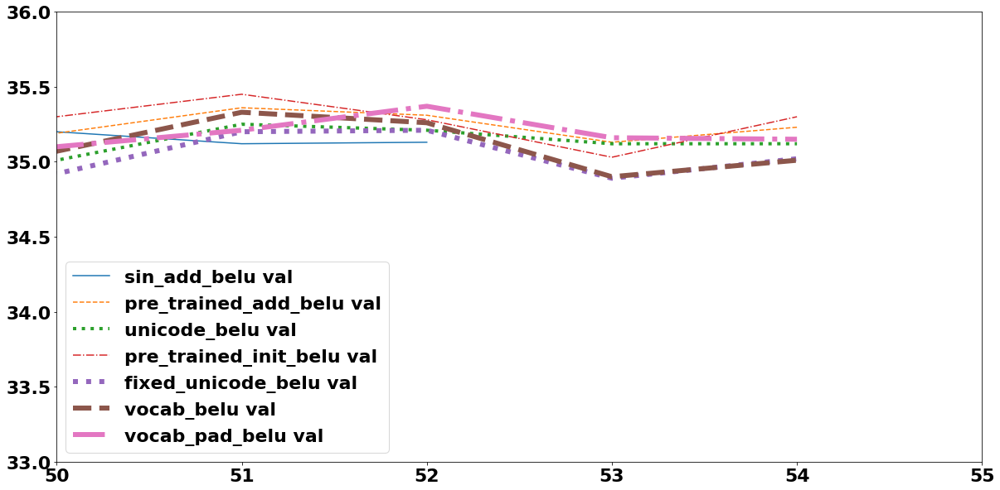

In [204]:
import matplotlib.pyplot as plt
font = {'family' : 'DejaVu Sans',
        'weight' : 'bold',
        'size'   : 22}

plt.rc('font', **font)
plt.rcParams["figure.figsize"] = (20,10)
  
# plot lines
plt.plot(sin_add_belu, label = "sin_add_belu val", linestyle="-")
plt.plot(pre_trained_add_belu, label = "pre_trained_add_belu val", linestyle="--")
plt.plot(unicode_belu, label = "unicode_belu val", linewidth=4, linestyle=":")
plt.plot(pre_trained_init_belu, label = "pre_trained_init_belu val", linestyle="-.")
plt.plot(fixed_unicode_belu, label = "fixed_unicode_belu val", linewidth=6, linestyle=":")
plt.plot(vocab_belu, label = "vocab_belu val", linewidth=6, linestyle="dashed")
plt.plot(vocab_pad_belu, label = "vocab_pad_belu val", linewidth=6, linestyle="dashdot")

plt.xlim(50,55)
plt.ylim(33,36)

plt.legend()
plt.show()

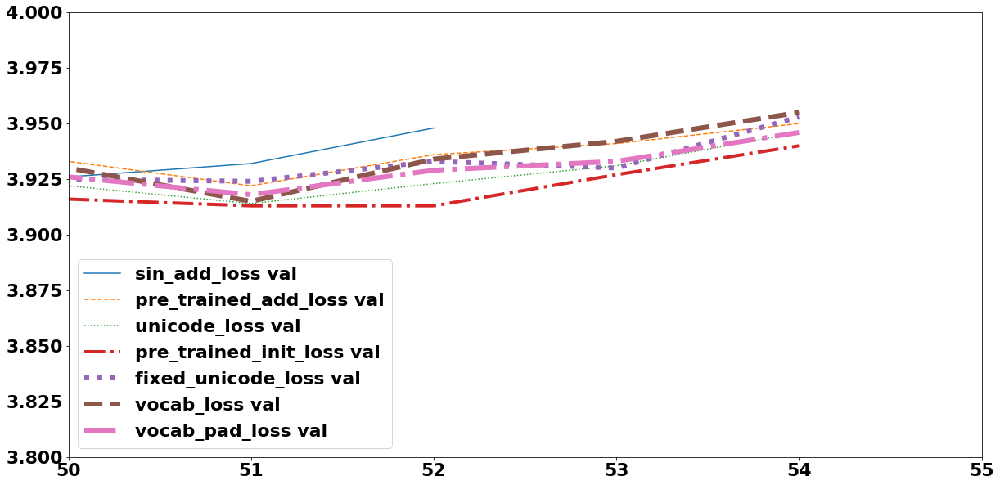

In [205]:
  # plot lines
plt.plot(sin_add_loss, label = "sin_add_loss val", linestyle="-")
plt.plot(pre_trained_add_loss, label = "pre_trained_add_loss val", linestyle="--")
plt.plot(unicode_loss, label = "unicode_loss val", linestyle=":")
plt.plot(pre_trained_init_loss, label = "pre_trained_init_loss val", linewidth=4, linestyle="-.")
plt.plot(fixed_unicode_loss, label = "fixed_unicode_loss val", linewidth=6, linestyle=":")
plt.plot(vocab_loss, label = "vocab_loss val", linewidth=6, linestyle="dashed")
plt.plot(vocab_pad_loss, label = "vocab_pad_loss val", linewidth=6, linestyle="dashdot")

plt.xlim(50,55)
plt.ylim(3.8,4)

plt.rcParams["figure.figsize"] = (20,10)
plt.legend()
plt.show()

### Create Unicode embeddings

In [4]:
hebrew_dic = open('/home/olab/itayitzhak/bpeplus/fairseq/data-bin/iwslt14.tokenized.en-he/dict.he.txt').readlines()
baseline_dic = open('/home/olab/itayitzhak/bpeplus/fairseq/data-bin/iwslt14.tokenized.de-en_baseline/dict.en.txt').readlines()
de_en_bpe30k_dic = open('/home/olab/itayitzhak/bpeplus/fairseq/data-bin/iwslt14.tokenized.en-de.bpe30k/dict.en.txt').readlines()
he_en_bpe30k_dic = open('/home/olab/itayitzhak/bpeplus/fairseq/data-bin/iwslt14.tokenized.he-en.bpe30k/dict.en.txt').readlines()

def preprocess_dic(input_dic):
    input_dic = [x.split(' ')[0] for x in input_dic]
    input_dic.insert(0,'<S>')
    input_dic.insert(1,'<pad>')
    input_dic.insert(2,'</S>')
    input_dic.insert(3,'<unk>')
    return input_dic

baseline_dic = preprocess_dic(baseline_dic)
hebrew_dic = preprocess_dic(hebrew_dic)
de_en_bpe30k_dic = preprocess_dic(de_en_bpe30k_dic)
he_en_bpe30k_dic = preprocess_dic(he_en_bpe30k_dic)

In [462]:
def avg_length(cur_dic):
    sum_length = 0
    num_token_short = 0
    sub_words = 0
    num_token_long = 0
    
    for token in cur_dic[4:]:
        sum_length += len(token)
        if len(token) < 5:
            num_token_short += 1
        if len(token) > 10:
            num_token_long += 1
        if '@' in token:
            sub_words += 1
    print("Token AVG length: %.2f" % (sum_length/len(cur_dic)), end=' |')
    print("Percent of tokens shorter than 5 chars (counting @): %.2f" % (num_token_short/len(cur_dic)), end=' |')
    print("Percent of tokens longer than 10 chars (counting @): %.2f" % (num_token_long/len(cur_dic)), end=' |')
    print("Percent of sub-words (with @): %.2f" % (sub_words/len(cur_dic)))
    
print("10k tokens Hebrew-English")
avg_length(hebrew_dic)
print("30k tokens Hebrew-English")
avg_length(he_en_bpe30k_dic)

print("="*20)
print("10k tokens German-English")
avg_length(baseline_dic)
print("30k tokens German-English")
avg_length(de_en_bpe30k_dic)


10k tokens Hebrew-English
Token AVG length: 4.97 |Percent of tokens shorter than 5 chars (counting @): 0.42 |Percent of tokens longer than 10 chars (counting @): 0.01 |Percent of sub-words (with @): 0.32
30k tokens Hebrew-English
Token AVG length: 5.54 |Percent of tokens shorter than 5 chars (counting @): 0.30 |Percent of tokens longer than 10 chars (counting @): 0.02 |Percent of sub-words (with @): 0.22
10k tokens German-English
Token AVG length: 6.02 |Percent of tokens shorter than 5 chars (counting @): 0.24 |Percent of tokens longer than 10 chars (counting @): 0.04 |Percent of sub-words (with @): 0.37
30k tokens German-English
Token AVG length: 6.99 |Percent of tokens shorter than 5 chars (counting @): 0.15 |Percent of tokens longer than 10 chars (counting @): 0.10 |Percent of sub-words (with @): 0.29


In [444]:
he_en_bpe30k_dic

['<S>',
 '<pad>',
 '</S>',
 '<unk>',
 ',',
 '.',
 'the',
 'and',
 'to',
 'of',
 'a',
 '&quot;',
 'that',
 'את',
 'i',
 'it',
 'in',
 'you',
 'we',
 'is',
 'של',
 '&apos;s',
 'זה',
 'this',
 '?',
 '--',
 'לא',
 'על',
 'so',
 'they',
 ':',
 'for',
 'was',
 'but',
 'הוא',
 'אני',
 'are',
 'have',
 'what',
 'on',
 'can',
 'with',
 'מה',
 '&apos;t',
 'about',
 'אבל',
 'הם',
 'אז',
 'there',
 'כל',
 'as',
 'all',
 'be',
 'do',
 'not',
 'at',
 'עם',
 'יותר',
 'one',
 '&apos;',
 'ו@@',
 'people',
 'my',
 'if',
 '&apos;re',
 'היא',
 'יש',
 'like',
 'או',
 'he',
 'אם',
 'from',
 'or',
 'an',
 'היה',
 'these',
 'now',
 'our',
 'just',
 'אנחנו',
 'because',
 'very',
 'by',
 'when',
 'how',
 'הזה',
 'me',
 'אתם',
 'know',
 'ש@@',
 'כך',
 'them',
 'more',
 'out',
 'לי',
 'think',
 'which',
 'אחד',
 'לנו',
 'up',
 'see',
 'כמו',
 'your',
 'had',
 'here',
 'רק',
 'their',
 'יכולים',
 'really',
 'כדי',
 'שלי',
 'שלנו',
 'who',
 'us',
 'then',
 'get',
 'would',
 'going',
 'were',
 'אנשים',
 'להיות',
 'w

### Playground

In [152]:
for i,token in enumerate(['a','b']):
    char_bits_ints = [0] * (32 * len(token)) # place holder for 4 bytes
    for j, c in enumerate(token):
        char_enc = repr(c).encode('utf-8') # get the bytes data, '\xd7\x90' for exmaple
        char_bits = bin(int.from_bytes(char_enc, byteorder='big'))#[2:] # string of bits        
        
        print("c:",c ,"int:", int.from_bytes(c.encode('utf-8'), byteorder='big'))
        print("c:",c ,"bits:", bin(int.from_bytes(c.encode('utf-8'), byteorder='big')))
        print("repr(c):",repr(c) ,"int:", int.from_bytes(char_enc, byteorder='big'))
        print("repr(c):",repr(c) ,"bits:", char_bits)
        print(len(char_bits))
        for k,x in enumerate(char_bits):
            index = -(k + 32 * j) - 1
            if x == '1':
                char_bits_ints[index] = 1
            else:
                char_bits_ints[index] = -1
        print(len(char_bits_ints))
        print(char_bits_ints)

c: a int: 97
c: a bits: 0b1100001
repr(c): 'a' int: 2580775
repr(c): 'a' bits: 0b1001110110000100100111
24
32
[0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, -1, -1, 1, -1, -1, 1, -1, -1, -1, -1, 1, 1, -1, 1, 1, 1, -1, -1, 1, -1, -1]
c: b int: 98
c: b bits: 0b1100010
repr(c): 'b' int: 2581031
repr(c): 'b' bits: 0b1001110110001000100111
24
32
[0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, -1, -1, 1, -1, -1, -1, 1, -1, -1, -1, 1, 1, -1, 1, 1, 1, -1, -1, 1, -1, -1]


In [160]:
for i,token in enumerate(['a','b', ' ']):
    char_bits_ints = [0] * (32 * len(token)) # place holder for 4 bytes
    for j, c in enumerate(token):
        char_enc = repr(c).encode('utf-8') # get the bytes data, '\xd7\x90' for exmaple
        char_bits = bin(int.from_bytes(char_enc, byteorder='big'))[2:] # string of bits        
        
        print("c:",c ,"bytes:", list(c.encode('utf-8')))
        print("c:",c ,"int:", int.from_bytes(c.encode('utf-8'), byteorder='big'))
        print("c:",c ,"bits:", bin(int.from_bytes(c.encode('utf-8'), byteorder='big')))
        
        print("repr(c):",repr(c) ,"bytes:", list(char_enc))
        print("repr(c):",repr(c) ,"int:", int.from_bytes(char_enc, byteorder='big'))
        print("repr(c):",repr(c) ,"bits:", char_bits)
        print(len(char_bits))
        for k,x in enumerate(char_bits):
            index = -(k + 32 * j) - 1
            if x == '1':
                char_bits_ints[index] = 1
            else:
                char_bits_ints[index] = -1
        print(len(char_bits_ints))
        print(char_bits_ints)

c: a bytes: [97]
c: a int: 97
c: a bits: 0b1100001
repr(c): 'a' bytes: [39, 97, 39]
repr(c): 'a' int: 2580775
repr(c): 'a' bits: 1001110110000100100111
22
32
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, -1, -1, 1, -1, -1, 1, -1, -1, -1, -1, 1, 1, -1, 1, 1, 1, -1, -1, 1]
c: b bytes: [98]
c: b int: 98
c: b bits: 0b1100010
repr(c): 'b' bytes: [39, 98, 39]
repr(c): 'b' int: 2581031
repr(c): 'b' bits: 1001110110001000100111
22
32
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, -1, -1, 1, -1, -1, -1, 1, -1, -1, -1, 1, 1, -1, 1, 1, 1, -1, -1, 1]
c:   bytes: [32]
c:   int: 32
c:   bits: 0b100000
repr(c): ' ' bytes: [39, 32, 39]
repr(c): ' ' int: 2564135
repr(c): ' ' bits: 1001110010000000100111
22
32
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, -1, -1, 1, -1, -1, -1, -1, -1, -1, -1, 1, -1, -1, 1, 1, 1, -1, -1, 1]


#### Unicde code

In [134]:
def get_unicode_embeddings(dic):
    emb_matrix = torch.zeros(len(dic),512)
    for i,token in enumerate(dic):
        if i < 4:
            emb_matrix[i,:] = torch.zeros(512)
            continue
        token_uni_emb = [0] * (32 * len(token)) # place holder for 4 bytes * num_of_chars
        #token_uni_emb = []
        for j, c in enumerate(token):
            char_enc = c.encode('utf-8') # get the bytes data, '\xd7\x90' for exmaple
            char_bits = bin(int.from_bytes(char_enc, byteorder='big'))[2:] # string of bits
            #print("len(char_bits):", len(char_bits)," for:",c, "token:", token)
            if j >= 16: #no more room for more chars in this emb
                continue
            for k,bit in enumerate(char_bits):
                index = -(k + 32 * j) - 1
                if bit == '1':
                    try:
                        emb_matrix[i,index] = 1
                    except:
                        print(i,token)
                        continue
                else:
                    try:
                        emb_matrix[i,index] = -1
                    except:
                        print(i,token)
                        continue
            #print(emb_matrix[i])
            #char_bits_ints = [1 if x == '1' else -1 for x in char_bits] # list of int for each bit
            #token_uni_emb += char_bits_ints
        #emb_matrix[i,-len(token_uni_emb):] = torch.tensor(list(reversed(token_uni_emb)))
    return emb_matrix

### Vocab embeddings

In [112]:
# def get_vocab_embeddings(vocab):
#     embedding_dim = 512
#     char_rand_emb_size = 24
    
#     def get_chars_in_vocab(vocab):
#         chars_in_vocab = set()
#         for token in vocab:  # .symbols:
#             for c in token:
#                 if c not in chars_in_vocab:
#                     chars_in_vocab.add(str(c))
#         return sorted(list(chars_in_vocab))
    
#     learn_char_rand_embedding = False
#     char_rand_embedding = torch.nn.Embedding(len(get_chars_in_vocab(curr_dic)), char_rand_emb_size, max_norm=None)
    
#     torch.nn.init.normal_(char_rand_embedding.weight, mean=0, std=embedding_dim ** -0.5)
    
#     if not learn_char_rand_embedding:
#         char_rand_embedding.weight.requires_grad = False

#     def char_emb(char_index):
#         if embd_scale:
#             return char_rand_embedding.weight.clone()[char_index]/math.sqrt(embedding_dim)
#         else:
#             return char_rand_embedding.weight.clone()[char_index]
    
#     def expi(token, double_char, without_shtrudel, word_marking, lang_marking):
#         if word_marking:
#             if "@" not in token:# and len(token) > 1: # token is a full word
#                 #char_bits = bin(len(chars_in_vocab))[2:]
#                 emb_matrix[i, -bits_need_per_char:] = 0.5
#             else:#if len(token) > 1: # token is a sub-word
#                 token = token.replace('@', '')
#                 emb_matrix[i, -bits_need_per_char:] = -0.5
#         if lang_marking:
#             def value_to_put(token):
#                 import re
#                 eng_check = re.compile("[A-Za-z]+")
#                 heb_check = re.compile("[א-ת]+")
#                 # if found match (entire string matches pattern)
#                 if eng_check.search(token) is not None:
#                     if lang_marking_0_5:
#                         return 0.5
#                     return 0.75
#                 elif heb_check.search(token) is not None:
#                     if lang_marking_0_5:
#                         return -0.5
#                     return -0.75
#                 return 0
#             value = value_to_put(token)
#             if word_marking:
#                 emb_matrix[i, -2*bits_need_per_char:-bits_need_per_char] = value
#             else:
#                 emb_matrix[i, -bits_need_per_char:] = value
            
#         if without_shtrudel:
#             if token is not '@' and token is not '@@':
#                 token = token.replace('@', '')
#         if one_shtrudel:
#             token = token.replace('@@', '@')
            
#         if double_char:
#             dup_token = str()
#             for c in token:
#                 dup_token += str(c) + str(c)
#             token = dup_token

#         return token
    
#     def is_j_out_of_bounds(j):
#             if j >= torch.div(embedding_dim, bits_need_per_char, rounding_mode='floor'):  # no more room for more chars in this emb
#                 return True
#             if (geresh_padding or super_geresh_padding) and j >= torch.div(embedding_dim, (3*bits_need_per_char), rounding_mode='floor'):
#                 return True
#             if (word_marking or lang_marking) and  j+2 >= torch.div(embedding_dim, bits_need_per_char, rounding_mode='floor'): # 2 instead of 1 in case both are True
#                 return True
#             if (geresh_padding or super_geresh_padding) and (word_marking or lang_marking) and j+2 >= torch.div(embedding_dim, (3*bits_need_per_char), rounding_mode='floor'):
#                 return True
#             return False
        
#     def get_index(j, char_bits):
#         char_space_to_skip = j
#         if geresh_padding or super_geresh_padding:
#             char_space_to_skip = j * 3
#         if word_marking or lang_marking:
#             char_space_to_skip = j + 1
#             if geresh_padding or super_geresh_padding:
#                 char_space_to_skip = j*3 + 1
#             if word_marking and lang_marking:
#                 char_space_to_skip = j + 2
#                 if geresh_padding or super_geresh_padding:
#                     char_space_to_skip = j*3 + 2
                    
#         index = -(k + bits_need_per_char * char_space_to_skip) - 1
#         return index


#     print("Vocab emb addition")
#     double_char = False
#     without_shtrudel = False
#     word_marking = False
#     geresh_padding = False
#     super_geresh_padding = False
#     lang_marking = False
#     lang_marking_0_5 = False
#     one_shtrudel = True
#     rand_embedding = True
#     embd_scale = False
    
#     if word_marking:
#         print("full word marking @")
#     if lang_marking:
#         import re
#         print("lang_marking")
#     if without_shtrudel:
#         print("without_shtrudel @")
#     if double_char:
#         print("with double_char")
#     if one_shtrudel:
#         print("one_shtrudel")
#     if geresh_padding:
#         print("geresh_padding")
#     if super_geresh_padding:
#         print("super_geresh_padding")
#     if rand_embedding:
#         print("rand_embedding")
#     if embd_scale:
#         print("embd_scale")

#     emb_list = []
#     emb_matrix = torch.zeros(len(vocab), embedding_dim)
#     chars_in_vocab = get_chars_in_vocab(vocab)
#     bits_need_per_char = len(bin(len(chars_in_vocab))) - 2
#     print("bits_need_per_char", bits_need_per_char)
    
#     for i, token in enumerate(vocab):
#         if i < 4:  # for unique tokens <s>, <pad>, </s>, <unk>
#             emb_matrix[i, :] = torch.zeros(embedding_dim)
#             continue
#         print("="*30)
#         print("token before:", token, end=' | ')
#         token = expi(token, double_char, without_shtrudel, word_marking, lang_marking)
#         print("token after:", token)
#         if rand_embedding:
#                 token_emb = None
                
#         for j, c in enumerate(token):
#             if is_j_out_of_bounds(j):
#                 continue
            
#             if rand_embedding:
#                 if token_emb is None:
#                     token_emb = [char_emb(chars_in_vocab.index(c))] # first char
#                 else:
#                     #token_emb = torch.cat((token_emb, char_emb(chars_in_vocab.index(c))), dim=0) # concat chars
#                     token_emb.append(char_emb(chars_in_vocab.index(c)))
#                 continue
                
#             char_bits = bin(chars_in_vocab.index(c))[2:]
#             if geresh_padding:
#                 begin_pad = "2" * bits_need_per_char
#                 mid_pad = "0" * (bits_need_per_char - len(char_bits))
#                 end_pad = "3" * bits_need_per_char
#                 char_bits = begin_pad + mid_pad + char_bits + end_pad
#             if super_geresh_padding:
#                 begin_pad = "00100111"
#                 mid_pad = "0" * (bits_need_per_char - len(char_bits))
#                 end_pad = "00100111"
#                 char_bits = begin_pad + mid_pad + char_bits + end_pad
#             print("c:", c, end=' ')
#             print("char_bits:", char_bits)
            
                
#             for k, bit in enumerate(char_bits):
#                 index = get_index(j, char_bits)
#                 if bit == '1':
#                     emb_matrix[i, index] = 1
#                 elif bit == '0':
#                     emb_matrix[i, index] = -1
#                 elif bit == '2':
#                     emb_matrix[i, index] = 0.5
#                 elif bit == '3':
#                     emb_matrix[i, index] = -0.5
#                 else:
#                     print("token: ", token)
#                     print("char_bits: ", char_bits)
#                     print("bit: ", bit)
#                     raise Exception("Something went wrong, should have only bits of 0,1. for pad 2,3,")
            
#         if rand_embedding: # place concat chars into emb_matrix
# #             token_emb = torch.cat(token_emb, dim=0)
# #             emb_matrix[i, -token_emb.shape[0]:] = token_emb.unsqueeze(0).fliplr().squeeze()
#             token_emb.append(torch.zeros(embedding_dim - len(token_emb) * token_emb[0].shape[0]))
#             token_emb = torch.cat(token_emb, dim=0)  # concat all chars
#             emb_matrix[i] = token_emb.unsqueeze(0).fliplr().squeeze()
#             #emb_list.append(token_emb.unsqueeze(0).fliplr())
            
#         for l in range(392,512,8):
#             print("emb_matrix[i]",emb_matrix[i,l:l+8])
#         #print("token_emb[:-120]:", emb_matrix[i, -120:])
#     return emb_matrix
#     #return torch.cat(emb_list, dim=0)

In [237]:
def get_vocab_embeddings(vocab, input_tokens=None):
    embedding_dim = 512
    char_rand_emb_size = 8
    
    def get_chars_in_vocab(vocab):
        chars_in_vocab = set()
        for token in vocab:  # .symbols:
            for c in token:
                if c not in chars_in_vocab:
                    chars_in_vocab.add(str(c))
        return sorted(list(chars_in_vocab))
    
    learn_char_rand_embedding = False
    char_rand_embedding = torch.nn.Embedding(len(get_chars_in_vocab(curr_dic))+1, char_rand_emb_size, padding_idx=0)
    torch.nn.init.normal_(char_rand_embedding.weight, mean=0, std=embedding_dim ** -0.5)
    
    
    print("Vocab emb addition")
    double_char = False
    without_shtrudel = False
    word_marking = False
    geresh_padding = False
    super_geresh_padding = False
    lang_marking = False
    lang_marking_0_5 = False
    one_shtrudel = True
    rand_embedding = True
    embd_scale = False
    
    if word_marking:
        print("full word marking @")
    if lang_marking:
        import re
        print("lang_marking")
    if without_shtrudel:
        print("without_shtrudel @")
    if double_char:
        print("with double_char")
    if one_shtrudel:
        print("one_shtrudel")
    if geresh_padding:
        print("geresh_padding")
    if super_geresh_padding:
        print("super_geresh_padding")
    if rand_embedding:
        print("rand_embedding")
    if embd_scale:
        print("embd_scale")
    
    
    if not learn_char_rand_embedding:
        char_rand_embedding.weight.requires_grad = False

    def char_emb(char_index):
        if embd_scale:
            return char_rand_embedding.weight.clone()[char_index]/math.sqrt(embedding_dim)
        else:
            return char_rand_embedding.weight.clone()[char_index]
    
    def expi(token, double_char, without_shtrudel, word_marking, lang_marking):
        if word_marking:
            if "@" not in token:# and len(token) > 1: # token is a full word
                #char_bits = bin(len(chars_in_vocab))[2:]
                emb_matrix[i, -bits_need_per_char:] = 0.5
            else:#if len(token) > 1: # token is a sub-word
                token = token.replace('@', '')
                emb_matrix[i, -bits_need_per_char:] = -0.5
        if lang_marking:
            def value_to_put(token):
                import re
                eng_check = re.compile("[A-Za-z]+")
                heb_check = re.compile("[א-ת]+")
                # if found match (entire string matches pattern)
                if eng_check.search(token) is not None:
                    if lang_marking_0_5:
                        return 0.5
                    return 0.75
                elif heb_check.search(token) is not None:
                    if lang_marking_0_5:
                        return -0.5
                    return -0.75
                return 0
            value = value_to_put(token)
            if word_marking:
                emb_matrix[i, -2*bits_need_per_char:-bits_need_per_char] = value
            else:
                emb_matrix[i, -bits_need_per_char:] = value
            
        if without_shtrudel:
            if token is not '@' and token is not '@@':
                token = token.replace('@', '')
        if one_shtrudel:
            token = token.replace('@@', '@')
            
        if double_char:
            dup_token = str()
            for c in token:
                dup_token += str(c) + str(c)
            token = dup_token

        return token
    
    def is_j_out_of_bounds(j):
            if rand_embedding:
                return embedding_dim//char_rand_emb_size < j
            if j >= torch.div(embedding_dim, bits_need_per_char, rounding_mode='floor'):  # no more room for more chars in this emb
                return True
            if (geresh_padding or super_geresh_padding) and j >= torch.div(embedding_dim, (3*bits_need_per_char), rounding_mode='floor'):
                return True
            if (word_marking or lang_marking) and  j+2 >= torch.div(embedding_dim, bits_need_per_char, rounding_mode='floor'): # 2 instead of 1 in case both are True
                return True
            if (geresh_padding or super_geresh_padding) and (word_marking or lang_marking) and j+2 >= torch.div(embedding_dim, (3*bits_need_per_char), rounding_mode='floor'):
                return True
            return False
        
    def get_index(j, char_bits):
        char_space_to_skip = j
        if geresh_padding or super_geresh_padding:
            char_space_to_skip = j * 3
        if word_marking or lang_marking:
            char_space_to_skip = j + 1
            if geresh_padding or super_geresh_padding:
                char_space_to_skip = j*3 + 1
            if word_marking and lang_marking:
                char_space_to_skip = j + 2
                if geresh_padding or super_geresh_padding:
                    char_space_to_skip = j*3 + 2
                    
        index = -(k + bits_need_per_char * char_space_to_skip) - 1
        return index
    
    emb_matrix = torch.zeros(len(vocab), embedding_dim)
    chars_in_vocab = get_chars_in_vocab(vocab)
    bits_need_per_char = len(bin(len(chars_in_vocab))) - 2
    print("bits_need_per_char", bits_need_per_char)
    
    if char_rand_embedding is not None:
        torch.nn.init.constant_(char_rand_embedding.weight[0], 0) # char padding
        tokens_chars_idx = torch.zeros(len(vocab), embedding_dim//char_rand_emb_size, dtype=torch.int)
        for i, token in enumerate(vocab):
            if i < 5:  # for unique tokens <s>, <pad>, </s>, <unk>
                continue
            token = expi(token, double_char, without_shtrudel, word_marking, lang_marking)
            chars_idx = torch.zeros(embedding_dim//char_rand_emb_size)

            for j, c in enumerate(token):
                if is_j_out_of_bounds(j):
                    break
                chars_idx[-j-1] = chars_in_vocab.index(c) + 1 # (index 0 is char padding)

            print("token", token)
            print("chars_idx", chars_idx)
            tokens_chars_idx[i] = chars_idx
                

    if input_tokens is not None:
        emb_matrix = torch.zeros(len(input_tokens), embedding_dim)
#         for i, token in enumerate(input_tokens):
#             chars_idx = tokens_chars_idx[token]
#             emb_matrix[i] = F.embedding(chars_idx, char_rand_embedding.weight).view(-1)
#             for l in range(392,512,8):
#                 print("emb_matrix[i]",emb_matrix[i,l:l+8])
#             print("="*30)
#             continue
        chars_idx = tokens_chars_idx[input_tokens.view(-1)]
        emb_matrix = F.embedding(chars_idx, char_rand_embedding.weight).view(len(input_tokens),-1)
        for i in range(len(input_tokens)):
            print("token:",input_tokens[i])
            for l in range(392,512,8):
                print("emb_matrix[i]",emb_matrix[i,l:l+8])
            print("="*30)
        return emb_matrix
    else:
        input_tokens = [i for i in range(len(vocab))]
        input_strings = vocab
        

        
    

    for i, token in enumerate(input_tokens): 
        if token < 4:  # for unique tokens <s>, <pad>, </s>, <unk>
            emb_matrix[i, :] = torch.zeros(embedding_dim)
            continue
        print("="*30)
        print("token before:", input_strings[i], end=' | ')
        input_strings[i] = expi(input_strings[i], double_char, without_shtrudel, word_marking, lang_marking)
        print("token after:", input_strings[i])
        if rand_embedding:
                token_emb = None
                
        for j, c in enumerate(input_strings[i]):
            if is_j_out_of_bounds(j):
                continue
            
            if rand_embedding:
                if token_emb is None:
                    token_emb = [char_emb(chars_in_vocab.index(c))] # first char
                else:
                    #token_emb = torch.cat((token_emb, char_emb(chars_in_vocab.index(c))), dim=0) # concat chars
                    token_emb.append(char_emb(chars_in_vocab.index(c)))
                continue
                
            char_bits = bin(chars_in_vocab.index(c))[2:]
            if geresh_padding:
                begin_pad = "2" * bits_need_per_char
                mid_pad = "0" * (bits_need_per_char - len(char_bits))
                end_pad = "3" * bits_need_per_char
                char_bits = begin_pad + mid_pad + char_bits + end_pad
            if super_geresh_padding:
                begin_pad = "00100111"
                mid_pad = "0" * (bits_need_per_char - len(char_bits))
                end_pad = "00100111"
                char_bits = begin_pad + mid_pad + char_bits + end_pad
            print("c:", c, end=' ')
            print("char_bits:", char_bits)
            
                
            for k, bit in enumerate(char_bits):
                index = get_index(j, char_bits)
                if bit == '1':
                    emb_matrix[i, index] = 1
                elif bit == '0':
                    emb_matrix[i, index] = -1
                elif bit == '2':
                    emb_matrix[i, index] = 0.5
                elif bit == '3':
                    emb_matrix[i, index] = -0.5
                else:
                    print("token: ", token)
                    print("char_bits: ", char_bits)
                    print("bit: ", bit)
                    raise Exception("Something went wrong, should have only bits of 0,1. for pad 2,3,")
            
        if rand_embedding: # place concat chars into emb_matrix
#             token_emb = torch.cat(token_emb, dim=0)
#             emb_matrix[i, -token_emb.shape[0]:] = token_emb.unsqueeze(0).fliplr().squeeze()
            #token_emb.append(torch.zeors(embedding_dim - len(token_emb) * token_emb[0].shape[0]))
            token_emb.append(torch.rand(embedding_dim - len(token_emb) * token_emb[0].shape[0])/math.sqrt(embedding_dim))
            token_emb = torch.cat(token_emb, dim=0)  # concat all chars
            emb_matrix[i] = token_emb.unsqueeze(0).fliplr().squeeze()
            #emb_list.append(token_emb.unsqueeze(0).fliplr())
            
        for l in range(392,512,8):
            print("emb_matrix[i]",emb_matrix[i,l:l+8])
        #print("token_emb[:-120]:", emb_matrix[i, -120:])
    return emb_matrix
    #return torch.cat(emb_list, dim=0)

In [241]:
for word in hebrew_dic:
    print(word)

<S>
<pad>
</S>
<unk>
,
.
the
and
to
of
a
&quot;
that
i
את
it
in
you
we
is
של
זה
&apos;s
this
?
--
לא
על
so
ו@@
they
:
ש@@
for
on
was
but
are
אני
הוא
מה
have
what
can
with
&apos;t
ב@@
about
אבל
הם
כל
as
אז
there
ל@@
at
all
מ@@
be
do
נ@@
not
עם
an
one
יותר
&apos;
people
my
or
היא
if
או
&apos;re
יש
-@@
like
אם
ה@@
he
from
היה
ת@@
these
י@@
now
our
just
אנחנו
כ@@
לי
because
very
me
המ@@
by
ס@@
re@@
ול@@
when
ר@@
how
א@@
ק@@
ח@@
הזה
כך
אתם
know
more
them
רק
ד@@
לנו
out
ט@@
אחד
think
which
מו@@
up
see
כמו
your
had
us
ע@@
here
ג
פ@@
כדי
their
יכולים
really
שלי
שלנו
who
בי@@
צ@@
אנשים
going
then
get
would
ס
שי@@
were
להיות
some
world
-
אנו
גם
רה
ing
הא@@
לי@@
time
י
don
ג@@
has
ז@@
זו
actually
נו@@
way
רות
&apos;ve
מי@@
&apos;m
לעשות
where
נים
הת@@
ל
in@@
into
הי@@
s@@
לכם
רו@@
years
ו
שמ@@
no
או@@
ב
ן
things
רים
ר
תי
זאת
other
a@@
אותו
ed
נה
could
will
go
נו
במ@@
מת@@
פי@@
;
כמה
מאוד
t@@
well
g@@
הו@@
want
d@@
אי@@
said
כי
make
ט
חו@@
רי@@
ק
הע@@
לה
ני
יכול
right
ted
הרבה
לו
למ@@
לה@@
נות
קו@

tal@@
וו@@
זון
סביב
ban@@
ected
whatever
בדי@@
cr@@
sel@@
dra@@
id
late
ur@@
worked
char@@
couple
ders
during
tor
לשם
מ-@@
מבינים
ning
shing
משחק
פתח
entire
known
particular
turns
טיקה
ניין
gave
בשנה
וש@@
200
fully
won
תע@@
להגיד
cur@@
18
ges
mis@@
הלו@@
seven
קטנים
chi@@
table
מגיע
sy@@
dri@@
האחרונות
עצמם
go@@
דע
המים
הפך
פיים
cra@@
בוד@@
למרות
culture
fish
med
powerful
thousands
בכלל
ההת@@
למשל
פעולה
שנקרא
cost
sting
wonderful
מאיתנו
מתחת
outside
לחו@@
נא@@
שהיו
ou@@
sed
test
tro@@
גע
ואנו
כת@@
סבי@@
תמונות
השת@@
לנסות
סין
and@@
blo@@
lots
מהי@@
ציו@@
רחב
שניתן
free
בעו@@
העיר
מבו@@
סטי@@
שעו@@
father
sions
z
כלומר
מתכוון
mit
size
מדבר
area
least
גדולים
גיע
לז@@
70
ator
middle
ns
פיה
needs
ore
החברה
להצ@@
מטו@@
עשי@@
ari@@
economic
yourself
מני@@
משום
שמה
ming
האמת
כמות
קוראים
מבי@@
ying
ויותר
תפ@@
ay
ss
טנ@@
קטנה
אי-@@
עיצוב
death
אנו@@
המצ@@
נמצאים
behind
cannot
ell@@
figure
front
leave
spend
גת
cre@@
האחרון
cho@@
hor@@
mat@@
בעצ@@
הות
שיות
שלי@@
cities
mil@@
לאורך
למי@@
מל@@
bro@

שרי@@
choice
ing@@
office
tex@@
הקטן
יוכל
לד
מוק@@
רגי@@
ature
ball
ear@@
east
fir@@
la
solar
struc@@
truth
wants
בוא
בפני
גיות
וידאו
לצי@@
מחשבים
מינים
activity
ped
הנקודה
כרגע
לשמור
מלים
קל@@
ריך
buildings
ligh@@
moved
notice
road
software
sol@@
totally
באפריקה
גידול
הבחור
ליה
מבין
עז@@
קרו
biggest
dd@@
democracy
jec@@
mission
moral
pal@@
town
אב
הלכ@@
וין
מזל
רג
רח
תכם
197@@
ate@@
baby
ences
eye
indi@@
nuclear
recor@@
skin
smart
spec@@
אודות
דף
הגדולים
ליח
מדינה
מרי@@
שאלתי
cing
det@@
gers
positive
wers
היטב
הנשים
טווח
כלשהו
סל@@
aff@@
indeed
tle
גנים
הכוח
התשובה
מדה
עץ
צלי@@
ands
appe@@
month
rela@@
university
wait
בנושא
דוגמאות
דמיינו
ובכל
חום
למס@@
עס@@
תוצאות
ang@@
creative
enter@@
grand@@
hospital
lead
particularly
reach
sig@@
wer
אבא
דון
הוב
למידים
סא
קע
רפו@@
תג@@
cultural
mass
mot@@
ray
usually
גיש
היצי@@
חז@@
חשב
לדי@@
לחזור
מבוס@@
תנו@@
ably
continu@@
econom@@
fire
ill@@
onto
port
strong
דום
המדע@@
הנושא
חשבו
יונות
משל@@
eth@@
eu@@
hit
nal
named
stre@@
sw@@
בדות
בפר@@
דלים

clin@@
cour@@
dog
funny
genetic
industrial
logists
memor@@
mostly
phones
some@@
subject
track
whose
workers
במדינה
גוון
הילה
היר
והש@@
חוף
מתמ@@
סרטים
קבוצת
קשור
ריקה
argu@@
bru@@
bunch
consciousness
docu@@
immediately
park
religion
specific
survive
אינן
אכפת
אלימות
בלות
בעבודה
בעית
גיית
ההג@@
זיה
יקט
להיכנס
לעמוד
נדון
ניסויים
נמוכה
קודות
תב
תקופה
ana
diagno@@
flying
gotten
rule
sphere
stance
בי-@@
דמים
האוויר
הבניין
הפרוייקט
התאים
חזקה
כנה
ליון
לשפר
משתנה
פט@@
רגש
שלמעשה
שמעתם
תשומת
asp@@
becoming
calcul@@
conference
legs
mber
region
sequence
stone
temperature
ואמר
וכאן
כיל
לאות
לאי
להכניס
לטפל
מרי
נתנו
סיקו
פגשתי
פעל
פשו@@
שיהיו
תוכ@@
ads
correc@@
ell
enormous
figu@@
governments
identi@@
neu@@
אפי@@
בדים
גלג@@
געים
דוע
הכלל
העיצוב
ולאחר
ולג@@
לאומי
לכיוון
נגי@@
סל
סמים
סן
שנית
2.@@
a-@@
babies
disa@@
embr@@
instance
markets
prof@@
speaking
urban
virus
באמריקה
דין
הגלו@@
השתמש@@
התקו@@
זול
מח
סיק
קלאות
רופא
ריק
שהא@@
תלו@@
תף
75
anda
boys
dangerous
decade
era
exten@@
fol@@
forth
high@

מפרטורה
נוספות
ניס
ניסיתי
ננים
נקים
עזרה
עליהן
פואה
צד
קלים
רגה
שאים
שבהן
שרות
200@@
agree
attem@@
bridge
coffee
engage
fairly
fortun@@
gall@@
identity
in-@@
leaving
ore@@
ories
oting
passed
phenomenon
spl@@
streets
tail
traffic
weapons
אזורים
בתהליך
החלטה
הקרח
ולל
יצורים
למצב
לפתוח
מדברת
מדתי
מנית
נהדרת
נמוך
פחד
קיב@@
שמות
תרים
adv@@
aling
brilliant
brings
cle
closer
designer
diver@@
gradu@@
less@@
previ@@
professor
stors
vast
walls
אורה
אמה
באנשים
בניות
בקרב
דיל
ההשפעה
המוזיקה
המטו@@
הנראה
הצליחו
הקבוצה
הרגשתי
וי
וית
זרם
כולת
לנהל
לרגע
מכיר
ציב
שטח
שרואים
תיי
bel
cheap
chri@@
compe@@
contro@@
def@@
easier
gan@@
helps
knowing
los
loss
nearly
obe@@
ome@@
sensi@@
stances
אמרנו
אפגניסטן
אתמול
בילים
בשבוע
דגים
הגיעה
המסע
הערים
וז@@
ולית
י-@@
ילדי@@
ישירות
לאסוף
לוק@@
לרו@@
מוסי@@
מתו
נפר@@
ף-@@
קהל
קראת
ריהם
שחור
תכנית
alize
bed@@
block
camer@@
challeng@@
chic@@
cycle
deci@@
describe
dol@@
expec@@
feels
gene@@
let@@
mented
mir@@
om
orig@@
report
sites
sold
ste
tain@@
therapy
tissue
travel

אסטרט@@
אקו@@
בוס
בידי
ביחס
האמיתית
החלו@@
הכר@@
הרגשה
השתנה
התפו@@
זכה
טיימס
לתקשר
מהסוג
מוזי@@
מום
מזג
משתנים
סטרליה
עבורם
צר@@
צרות
שאו@@
שורת
שינויי
שניה
שראינו
תוף
תכונות
bran@@
chemistry
classroom
clinical
coal
daily
detail
develop@@
dinner
dle
ese
exists
faith
forming
losing
mers
movies
mri
northern
ong@@
ought
pre-@@
proce@@
sister
soldiers
stic@@
va
whereas
אימה
בשר
דולים
הגנים
החבר@@
החוקים
החלקים
המא@@
המיו@@
העמו@@
הפעולה
השלב
ודא
ולוג
זקו@@
חיב
חרי@@
חשיבות
כזאת
כרו@@
להחליט
להפעיל
להתאים
ליל
לנהוג
לעקוב
לריה
מנויות
מנוע
משבר
נעשים
סבור
פרס@@
קיר
ריירה
ריס
30,000
artificial
australia
chain
contem@@
control@@
cortex
democratic
drawing
existence
explan@@
expression
fourth
ims
lady
leaves
mini@@
ound
practical
rant
sau@@
sha
spot
thin@@
valuable
בהקשר
בניו
בנקודה
בעקבות
האירו@@
ההורים
זכרו
זקוק
חמי@@
יג@@
להישאר
להרוג
מורכבת
מטה
מלח@@
מנהל
מעניינים
משול@@
משמעותית
משנים
ן@@
נגו@@
סדר
סונים
סופר
פותח
קהילה
שבעצם
שהול@@
שווקים
שיבות
שניהם
שתוכלו
32
activ@@
alternative
anti-@@
c

zy
חילת
כום
מדהי@@
מטיקה
ama@@
cer
civi@@
conf@@
lion
titu@@
המשיך
קילו@@
advan@@
anima@@
dem@@
ene@@
fs
indepen@@
inno@@
tube
כשיו
לדע@@
עלת
agri@@
bert
innov@@
olution
pli@@
vy
פירה
architec@@
dings
effor@@
ener@@
ices
near@@
prac@@
חיק
סייע
+
demon@@
eve
hosp@@
isra@@
lars
המשפ@@
חבר@@
מפרטו@@
ניינת
פורניה
bud@@
illing
of@@
sty@@
הטכנולו@@
ייקט
לסטי@@
cip@@
civiliz@@
health@@
mbers
אול
מילי@@
ater
dou@@
fam@@
follo@@
ima@@
ques@@
reas@@
משמע@@
נוך
carb@@
gir@@
gle
gni@@
got@@
עבד@@
רגיש
שיעו@@
addre@@
afric@@
bacter@@
cent@@
citiz@@
fascin@@
fortunately
long-@@
pret@@
sent@@
serv@@
היות
equi@@
inde@@
list@@
native
pid
plat@@
usual
weal@@
נמו@@
abi@@
bli@@
colleag@@
condi@@
dimen@@
isms
like@@
mous
musc@@
ough
ppe@@
q
run@@
vil@@
האוכלו@@
כמים
כנולוגיה
קדי@@
cin@@
consci@@
ees
intu@@
lear@@
mou@@
neighbor@@
ַ@@
הלים
העול@@
הפח@@
מגני@@
ems
eping
g-@@
immedi@@
ition
mach@@
manu@@
partic@@
vels
was@@
בהכ@@
עופה
פשים
mun@@
pati@@
sic@@
tioned
viol@@
with@@
מתכו@@
compan@@
dama@@
danger@

In [238]:
#vocab_embeddings = get_vocab_embeddings(sorted(curr_dic))
#vocab_embeddings = get_vocab_embeddings(de_en_bpe30k_dic)

In [239]:
curr_dic = hebrew_dic
#curr_dic = baseline_dic
some_input = torch.tensor([0,600,700,1,1])
#some_input = None
input_embeddings = get_vocab_embeddings(sorted(curr_dic)[:800], some_input)
print(input_embeddings.shape)

Vocab emb addition
one_shtrudel
rand_embedding
bits_need_per_char 6
token &#93;
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0., 25., 17., 23.,  2.,  5.])
token &#@
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0., 30.,  2.,  5.])
token &amp;
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 

         0.,  0.,  0.,  0., 30., 20., 23., 15.])
token 197@
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0., 30., 21., 23., 15.])
token 198@
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0., 30., 22., 23., 15.])
token 199@
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0

token 9@
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0., 30., 23.])
token :
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0., 24.])
token ;
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,

         0., 30., 44., 48., 44., 47., 39., 36.])
token adop@
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0., 30., 50., 49., 39., 36.])
token ads
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0., 53., 39., 36.])
token adul@
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         

token als
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0., 53., 46., 36.])
token also
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0., 49., 53., 46., 36.])
token alter@
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 

token appli@
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0., 30., 44., 46., 50., 50., 36.])
token apply
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0., 59., 46., 50., 50., 36.])
token appreci@
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,

token ats
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0., 53., 54., 36.])
token att@
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0., 30., 54., 54., 36.])
token attac@
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 

token beha@
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0., 30., 36., 43., 40., 37.])
token behavi@
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0., 30., 44., 56., 36., 43., 40., 37.])
token behavior
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.

token br@
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0., 30., 52., 37.])
token bra@
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0., 30., 36., 52., 37.])
token brain
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  

         0.,  0.,  0.,  0., 40., 52., 36., 38.])
token care@
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0., 30., 40., 52., 36., 38.])
token career
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0., 52., 40., 40., 52., 36., 38.])
token carry
chars_idx tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
      

In [222]:
torch.save(input_embeddings,'/home/olab/itayitzhak/bpeplus/fairseq/checkpoints/rand_emb_tokens_emb_matrix/rand_emb_heb_tokens_emb_matrix_with_random_filling.pt')

In [111]:
print(vocab_embeddings.shape)
print(vocab_embeddings[0])

torch.Size([10188, 512])
tensor([ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000

## Heatmap

In [101]:
# print(sorted(curr_dic))
# print(vocab_embeddings)

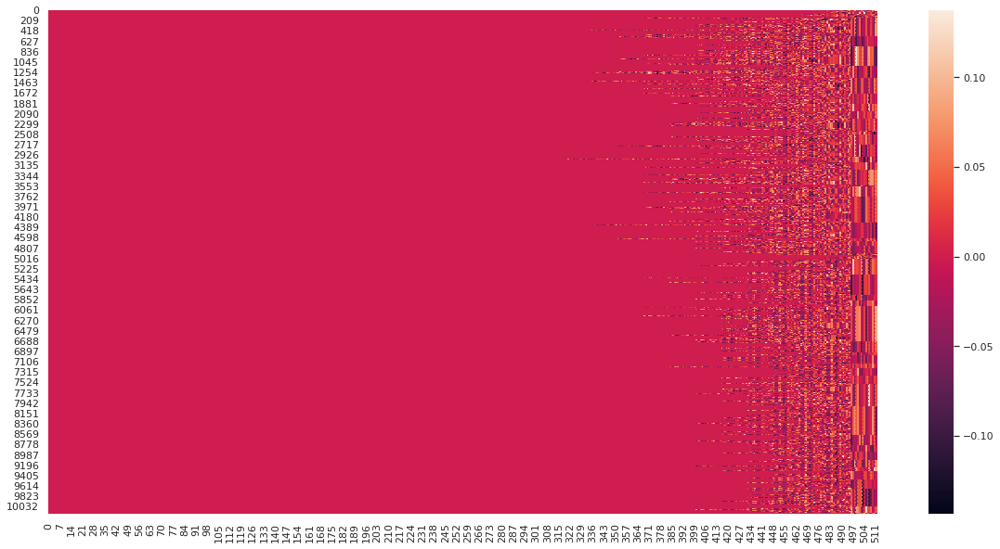

In [102]:
import numpy as np; np.random.seed(0)

import seaborn as sns; sns.set_theme()
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (20,10)

vocab_embeddings_numpy = vocab_embeddings.cpu().numpy()

ax = sns.heatmap(vocab_embeddings_numpy)

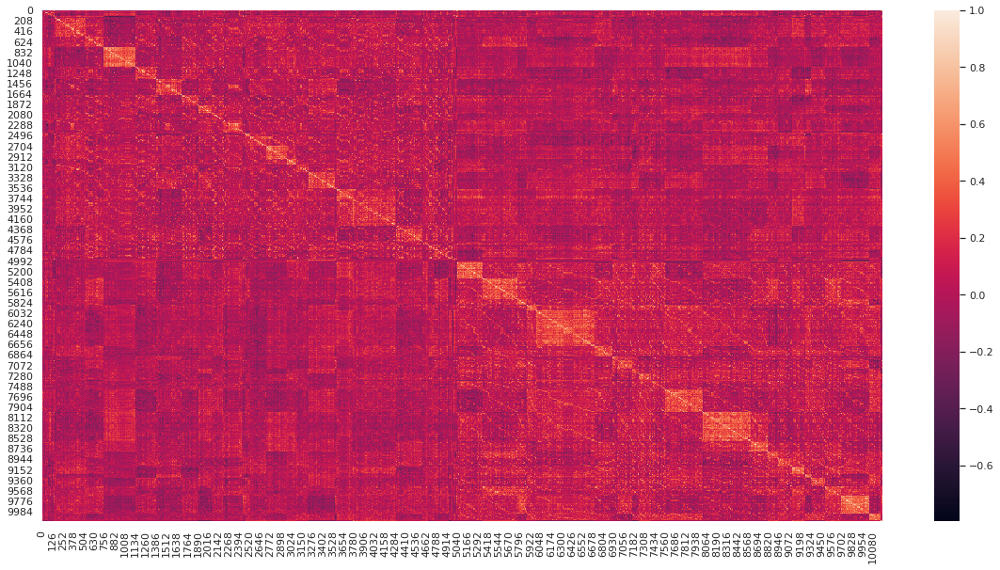

In [103]:
torch.set_printoptions(threshold=50000)
cos_sim_vocab = get_cosine_sim(vocab_embeddings[4:,:])
ax = sns.heatmap(cos_sim_vocab.numpy())

In [104]:
print_top_k_similar(vocab_embeddings[4:,:], sorted(curr_dic)[4:], k=5)


&#91; -  (&#91;,1.00)  (&#93;,0.82)  (&#@@,0.62)  (&amp;,0.46)  (&quot;,0.35) 

&#93; -  (&#93;,1.00)  (&#91;,0.82)  (&#@@,0.69)  (&amp;,0.55)  (&quot;,0.37) 

&#@@ -  (&#@@,1.00)  (&#93;,0.69)  (&#91;,0.62)  (ם-@@,0.55)  (ו-@@,0.50) 

&amp; -  (&amp;,1.00)  (same,0.59)  (ham,0.55)  (&#93;,0.55)  (game,0.55) 

&apos; -  (&apos;,1.00)  (&apos;t,0.95)  (&apos;@@,0.95)  (&apos;s,0.95)  (&apos;d,0.94) 

&apos;@@ -  (&apos;@@,1.00)  (&apos;,0.95)  (&apos;s,0.94)  (&apos;t,0.89)  (&apos;d,0.89) 

&apos;d -  (&apos;d,1.00)  (&apos;,0.94)  (&apos;t,0.91)  (&apos;@@,0.89)  (&apos;s,0.87) 

&apos;ll -  (&apos;ll,1.00)  (&apos;,0.88)  (&apos;t,0.84)  (&apos;s,0.83)  (&apos;@@,0.83) 

&apos;m -  (&apos;m,1.00)  (&apos;,0.90)  (&apos;s,0.87)  (&apos;@@,0.86)  (&apos;t,0.86) 

&apos;re -  (&apos;re,1.00)  (&apos;ve,0.91)  (&apos;s,0.88)  (&apos;,0.86)  (&apos;@@,0.84) 

&apos;s -  (&apos;s,1.00)  (&apos;,0.95)  (&apos;@@,0.94)  (&apos;ve,0.89)  (&apos;re,0.88) 

&apos;t -  (&apos;t,1.00)  (&apos;,0

acher -  (acher,1.00)  (aches,0.91)  (ached,0.83)  (ach,0.80)  (ach@@,0.74) 

aches -  (aches,1.00)  (acher,0.91)  (ach,0.84)  (ached,0.83)  (ach@@,0.78) 

achi@@ -  (achi@@,1.00)  (ach,0.87)  (ach@@,0.85)  (actu@@,0.80)  (acci@@,0.78) 

achiev@@ -  (achiev@@,1.00)  (achieve,0.88)  (achi@@,0.77)  (ach,0.77)  (ach@@,0.75) 

achieve -  (achieve,1.00)  (achiev@@,0.88)  (achi@@,0.76)  (ach,0.76)  (ach@@,0.74) 

ack -  (ack,1.00)  (ick,0.81)  (uck,0.81)  (ach,0.79)  (aca@@,0.74) 

acqui@@ -  (acqui@@,1.00)  (actu@@,0.76)  (ace,0.74)  (activ@@,0.73)  (act,0.71) 

across -  (across,1.00)  (accor@@,0.68)  (ac@@,0.66)  (scri@@,0.66)  (access,0.65) 

act -  (act,1.00)  (acts,0.92)  (actu@@,0.87)  (ach,0.84)  (ace,0.84) 

acting -  (acting,1.00)  (ecting,0.84)  (act,0.73)  (active,0.73)  (activi@@,0.73) 

action -  (action,1.00)  (actions,0.95)  (ection,0.83)  (act,0.75)  (activi@@,0.74) 

actions -  (actions,1.00)  (action,0.95)  (ection,0.79)  (activi@@,0.75)  (act,0.71) 

activ@@ -  (activ@@,1

app@@ -  (app@@,1.00)  (appe@@,0.76)  (asp@@,0.74)  (apple,0.72)  (appro@@,0.71) 

appar@@ -  (appar@@,1.00)  (separ@@,0.80)  (appli@@,0.77)  (appro@@,0.76)  (app@@,0.70) 

appe@@ -  (appe@@,1.00)  (appear,0.78)  (app@@,0.76)  (appli@@,0.73)  (apple,0.72) 

appear -  (appear,1.00)  (appe@@,0.78)  (app@@,0.65)  (appli@@,0.62)  (apple,0.59) 

apple -  (apple,1.00)  (apply,0.86)  (appli@@,0.78)  (app@@,0.72)  (appe@@,0.72) 

appli@@ -  (appli@@,1.00)  (apple,0.78)  (appar@@,0.77)  (appe@@,0.73)  (apply,0.73) 

apply -  (apply,1.00)  (apple,0.86)  (appli@@,0.73)  (appe@@,0.70)  (app@@,0.70) 

appreci@@ -  (appreci@@,1.00)  (apple,0.62)  (app@@,0.58)  (americ@@,0.57)  (physici@@,0.53) 

appro@@ -  (appro@@,1.00)  (appar@@,0.76)  (approach,0.75)  (app@@,0.71)  (appropri@@,0.70) 

approach -  (approach,1.00)  (appro@@,0.75)  (appropri@@,0.62)  (app@@,0.58)  (appropriate,0.56) 

appropri@@ -  (appropri@@,1.00)  (appropriate,0.86)  (appro@@,0.70)  (approach,0.62)  (app@@,0.58) 

appropriate -  

bene@@ -  (bene@@,1.00)  (benef@@,0.83)  (benefit,0.79)  (ben@@,0.77)  (rene@@,0.76) 

benef@@ -  (benef@@,1.00)  (benefit,0.88)  (benefits,0.83)  (bene@@,0.83)  (ben@@,0.73) 

benefit -  (benefit,1.00)  (benefits,0.94)  (benef@@,0.88)  (bene@@,0.79)  (ben@@,0.70) 

benefits -  (benefits,1.00)  (benefit,0.94)  (benef@@,0.83)  (bene@@,0.75)  (ben@@,0.66) 

ber -  (ber,1.00)  (bert,0.91)  (ber@@,0.91)  (berg,0.86)  (wer,0.84) 

ber@@ -  (ber@@,1.00)  (ber,0.91)  (wer@@,0.87)  (ser@@,0.84)  (ter@@,0.83) 

berg -  (berg,1.00)  (ber,0.86)  (ber@@,0.78)  (wer,0.72)  (bes,0.70) 

bert -  (bert,1.00)  (ber,0.91)  (best,0.85)  (ber@@,0.80)  (wer,0.76) 

bes -  (bes,1.00)  (best,0.90)  (be@@,0.85)  (be,0.84)  (ber,0.82) 

best -  (best,1.00)  (bes,0.90)  (bert,0.85)  (west,0.84)  (beat,0.82) 

bet -  (bet,1.00)  (be,0.87)  (betw@@,0.81)  (bed,0.75)  (set,0.75) 

better -  (better,1.00)  (letter,0.77)  (bet,0.68)  (western,0.62)  (matter,0.60) 

betw@@ -  (betw@@,1.00)  (bet,0.81)  (be,0.70)  (se

ce -  (ce,1.00)  (ce@@,0.91)  (ces,0.90)  (ced,0.88)  (cei@@,0.85) 

ce@@ -  (ce@@,1.00)  (ce,0.91)  (ces,0.90)  (cl@@,0.83)  (cess,0.82) 

ced -  (ced,1.00)  (ce,0.88)  (ce@@,0.80)  (cer,0.76)  (ces,0.76) 

cei@@ -  (cei@@,1.00)  (cel@@,0.86)  (cli@@,0.85)  (ce,0.85)  (cer@@,0.84) 

cel@@ -  (cel@@,1.00)  (cei@@,0.86)  (cell,0.82)  (ce,0.82)  (cul@@,0.82) 

cele@@ -  (cele@@,1.00)  (cell,0.82)  (cells,0.82)  (cel@@,0.79)  (celebr@@,0.79) 

celebr@@ -  (celebr@@,1.00)  (cele@@,0.79)  (centur@@,0.69)  (cell,0.69)  (cells,0.68) 

cell -  (cell,1.00)  (cells,0.93)  (cel@@,0.82)  (cele@@,0.82)  (ce,0.80) 

cells -  (cells,1.00)  (cell,0.93)  (cele@@,0.82)  (calls,0.80)  (cel@@,0.77) 

cen@@ -  (cen@@,1.00)  (cent,0.86)  (cin@@,0.84)  (cei@@,0.83)  (cent@@,0.81) 

cent -  (cent,1.00)  (cent@@,0.95)  (cen@@,0.86)  (centr@@,0.86)  (center,0.85) 

cent@@ -  (cent@@,1.00)  (cent,0.95)  (centr@@,0.84)  (cont@@,0.83)  (cen@@,0.81) 

center -  (center,1.00)  (centers,0.95)  (centur@@,0.85)  (cent,

concer@@ -  (concer@@,1.00)  (cancer,0.90)  (concep@@,0.87)  (conclu@@,0.85)  (conver@@,0.84) 

concerned -  (concerned,1.00)  (concer@@,0.80)  (cancer,0.79)  (concept,0.72)  (concep@@,0.69) 

conclu@@ -  (conclu@@,1.00)  (concer@@,0.85)  (concep@@,0.84)  (concept,0.75)  (cancer,0.74) 

condi@@ -  (condi@@,1.00)  (confi@@,0.94)  (consi@@,0.86)  (conf@@,0.82)  (consu@@,0.80) 

condition -  (condition,1.00)  (conditions,0.96)  (condi@@,0.74)  (conf@@,0.69)  (confi@@,0.68) 

conditions -  (conditions,1.00)  (condition,0.96)  (condi@@,0.71)  (conf@@,0.66)  (confi@@,0.66) 

conduc@@ -  (conduc@@,1.00)  (connec@@,0.81)  (contact,0.75)  (connect,0.73)  (contin@@,0.71) 

conf@@ -  (conf@@,1.00)  (cont@@,0.93)  (conv@@,0.90)  (confi@@,0.88)  (con@@,0.84) 

conference -  (conference,1.00)  (conver@@,0.66)  (difference,0.65)  (differences,0.63)  (center,0.61) 

confi@@ -  (confi@@,1.00)  (condi@@,0.94)  (conf@@,0.88)  (consi@@,0.88)  (consu@@,0.82) 

conflic@@ -  (conflic@@,1.00)  (conflict,0.92)

ders -  (ders,1.00)  (der,0.90)  (der@@,0.90)  (ters,0.83)  (kers,0.79) 

des -  (des,1.00)  (dest,0.90)  (des@@,0.89)  (de@@,0.84)  (de,0.84) 

des@@ -  (des@@,1.00)  (des,0.89)  (dev@@,0.88)  (der@@,0.85)  (de-@@,0.83) 

descri@@ -  (descri@@,1.00)  (describe,0.88)  (described,0.84)  (disco@@,0.68)  (destro@@,0.68) 

describe -  (describe,1.00)  (described,0.95)  (descri@@,0.88)  (disco@@,0.63)  (disci@@,0.60) 

described -  (described,1.00)  (describe,0.95)  (descri@@,0.84)  (disco@@,0.60)  (disci@@,0.57) 

deser@@ -  (deser@@,1.00)  (desert,0.86)  (deter@@,0.82)  (diver@@,0.76)  (sever@@,0.75) 

desert -  (desert,1.00)  (deser@@,0.86)  (desire,0.72)  (fewer,0.72)  (destro@@,0.71) 

desi@@ -  (desi@@,1.00)  (des,0.82)  (dest@@,0.81)  (des@@,0.79)  (deli@@,0.79) 

desig@@ -  (desig@@,1.00)  (design,0.74)  (desi@@,0.72)  (des,0.72)  (des@@,0.69) 

design -  (design,1.00)  (designed,0.88)  (designer,0.86)  (designers,0.82)  (designing,0.80) 

designed -  (designed,1.00)  (design,0.88) 

ed -  (ed,1.00)  (ed@@,0.85)  (eds,0.84)  (edu@@,0.76)  (ef,0.75) 

ed@@ -  (ed@@,1.00)  (ed,0.85)  (eds,0.84)  (et@@,0.72)  (e-@@,0.71) 

edge -  (edge,1.00)  (enge,0.75)  (ed,0.68)  (page,0.62)  (toge@@,0.60) 

eding -  (eding,1.00)  (eting,0.87)  (ering,0.81)  (ening,0.81)  (eping,0.79) 

eds -  (eds,1.00)  (ed@@,0.84)  (ed,0.84)  (efs,0.83)  (edu@@,0.74) 

edu@@ -  (edu@@,1.00)  (ed,0.76)  (eds,0.74)  (ed@@,0.69)  (eff@@,0.67) 

educa@@ -  (educa@@,1.00)  (education,0.72)  (touch,0.63)  (eric@@,0.60)  (exac@@,0.56) 

education -  (education,1.00)  (educa@@,0.72)  (alization,0.56)  (formation,0.54)  (situation,0.52) 

ee -  (ee,1.00)  (ees,0.84)  (een,0.71)  (e,0.71)  (pe,0.67) 

een -  (een,1.00)  (ten,0.81)  (ven,0.77)  (gen,0.77)  (pen@@,0.76) 

ees -  (ees,1.00)  (ee,0.84)  (pes,0.76)  (les,0.75)  (els,0.75) 

ef -  (ef,1.00)  (efs,0.82)  (e,0.77)  (ed,0.75)  (eff@@,0.74) 

eff@@ -  (eff@@,1.00)  (ext@@,0.75)  (ef,0.74)  (eth@@,0.68)  (edu@@,0.67) 

effec@@ -  (effec@@,1.00)  (e

evolved -  (evolved,1.00)  (evol@@,0.72)  (evil,0.56)  (earlier,0.56)  (early,0.52) 

ex@@ -  (ex@@,1.00)  (et@@,0.82)  (exi@@,0.76)  (e-@@,0.72)  (ef,0.71) 

exac@@ -  (exac@@,1.00)  (exactly,0.75)  (stac@@,0.74)  (exam@@,0.70)  (plac@@,0.69) 

exactly -  (exactly,1.00)  (exac@@,0.75)  (quickly,0.57)  (example,0.54)  (tract,0.54) 

exam@@ -  (exam@@,1.00)  (example,0.70)  (exhi@@,0.70)  (exac@@,0.70)  (examples,0.67) 

example -  (example,1.00)  (examples,0.95)  (exam@@,0.70)  (exactly,0.54)  (ex@@,0.51) 

examples -  (examples,1.00)  (example,0.95)  (exam@@,0.67)  (exactly,0.52)  (ex@@,0.48) 

exc@@ -  (exc@@,1.00)  (etc,0.83)  (excited,0.75)  (except,0.74)  (ext@@,0.69) 

except -  (except,1.00)  (exc@@,0.74)  (etc,0.70)  (accept,0.58)  (ence,0.58) 

exchange -  (exchange,1.00)  (exc@@,0.63)  (etc,0.60)  (explan@@,0.56)  (mechan@@,0.56) 

excited -  (excited,1.00)  (exc@@,0.75)  (exciting,0.70)  (etc,0.69)  (except,0.57) 

exciting -  (exciting,1.00)  (excited,0.70)  (exc@@,0.68)  (

fore -  (fore,1.00)  (fore@@,0.92)  (for,0.86)  (forest,0.85)  (forests,0.79) 

fore@@ -  (fore@@,1.00)  (fore,0.92)  (forest,0.85)  (for,0.79)  (forests,0.79) 

foreign -  (foreign,1.00)  (fore,0.71)  (fore@@,0.69)  (forever,0.63)  (for,0.62) 

forest -  (forest,1.00)  (forests,0.93)  (fore,0.85)  (fore@@,0.85)  (for,0.74) 

forests -  (forests,1.00)  (forest,0.93)  (fore,0.79)  (fore@@,0.79)  (forever,0.74) 

forever -  (forever,1.00)  (fore,0.76)  (forests,0.74)  (fore@@,0.72)  (however,0.72) 

forget -  (forget,1.00)  (target,0.81)  (for,0.71)  (fore,0.65)  (for@@,0.64) 

form -  (form,1.00)  (forms,0.92)  (farm,0.85)  (forma@@,0.84)  (formed,0.84) 

forma@@ -  (forma@@,1.00)  (form,0.84)  (forms,0.83)  (farm,0.72)  (formation,0.70) 

formation -  (formation,1.00)  (forma@@,0.70)  (form,0.68)  (forms,0.67)  (servation,0.67) 

formed -  (formed,1.00)  (form,0.84)  (former,0.83)  (forced,0.73)  (forms,0.73) 

former -  (former,1.00)  (farmers,0.86)  (formed,0.83)  (form,0.81)  (forms

gress -  (gress,1.00)  (press,0.84)  (gre@@,0.83)  (guess,0.82)  (goes,0.79) 

grew -  (grew,1.00)  (gre@@,0.88)  (gress,0.77)  (great,0.75)  (grow,0.73) 

gri@@ -  (gri@@,1.00)  (gro@@,0.80)  (pri@@,0.79)  (gra@@,0.78)  (gr@@,0.78) 

gro@@ -  (gro@@,1.00)  (grow,0.88)  (goo@@,0.85)  (gra@@,0.84)  (grow@@,0.81) 

grou@@ -  (grou@@,1.00)  (prou@@,0.83)  (grow@@,0.82)  (gro@@,0.79)  (group,0.77) 

ground -  (ground,1.00)  (around,0.81)  (grown,0.79)  (group,0.69)  (grou@@,0.67) 

group -  (group,1.00)  (groups,0.93)  (grou@@,0.77)  (gro@@,0.75)  (grow,0.69) 

groups -  (groups,1.00)  (group,0.93)  (grou@@,0.71)  (gro@@,0.70)  (grow,0.65) 

grow -  (grow,1.00)  (grow@@,0.92)  (gro@@,0.88)  (growth,0.88)  (grown,0.83) 

grow@@ -  (grow@@,1.00)  (grow,0.92)  (grou@@,0.82)  (gro@@,0.81)  (growth,0.78) 

growing -  (growing,1.00)  (drawing,0.76)  (grow,0.72)  (grow@@,0.70)  (showing,0.70) 

grown -  (grown,1.00)  (grow,0.83)  (ground,0.79)  (brown,0.76)  (growth,0.75) 

growth -  (growth,1.00

ily -  (ily,1.00)  (gly,0.82)  (bly,0.81)  (tly,0.74)  (il,0.73) 

im -  (im,1.00)  (im@@,0.87)  (ims,0.85)  (um,0.80)  (ima@@,0.74) 

im@@ -  (im@@,1.00)  (im,0.87)  (ims,0.86)  (um@@,0.85)  (sm@@,0.79) 

ima@@ -  (ima@@,1.00)  (ama@@,0.79)  (ema@@,0.78)  (im,0.74)  (imag@@,0.72) 

imag@@ -  (imag@@,1.00)  (image,0.85)  (images,0.79)  (imagine,0.73)  (ima@@,0.72) 

image -  (image,1.00)  (images,0.93)  (imag@@,0.85)  (ima@@,0.71)  (imagine,0.67) 

images -  (images,1.00)  (image,0.93)  (imag@@,0.79)  (ima@@,0.66)  (imagine,0.65) 

imagination -  (imagination,1.00)  (imagine,0.69)  (international,0.61)  (imag@@,0.60)  (image,0.54) 

imagine -  (imagine,1.00)  (imag@@,0.73)  (imagination,0.69)  (image,0.67)  (images,0.65) 

immedi@@ -  (immedi@@,1.00)  (immediately,0.73)  (named,0.64)  (immun@@,0.59)  (game,0.57) 

immediately -  (immediately,1.00)  (immedi@@,0.73)  (named,0.50)  (immun@@,0.47)  (importantly,0.46) 

immun@@ -  (immun@@,1.00)  (amoun@@,0.66)  (human@@,0.64)  (dimen@@,0.6

jap@@ -  (jap@@,1.00)  (lap@@,0.79)  (japan,0.71)  (jan@@,0.68)  (haps,0.66) 

japan -  (japan,1.00)  (japanese,0.84)  (jap@@,0.71)  (organ@@,0.58)  (organs,0.58) 

japanese -  (japanese,1.00)  (japan,0.84)  (jap@@,0.60)  (organized,0.50)  (advant@@,0.50) 

je@@ -  (je@@,1.00)  (ve@@,0.75)  (re@@,0.70)  (le@@,0.68)  (ju@@,0.68) 

jec@@ -  (jec@@,1.00)  (ject,0.85)  (rec@@,0.83)  (lec@@,0.83)  (sec@@,0.83) 

ject -  (ject,1.00)  (jects,0.93)  (jec@@,0.85)  (sector,0.68)  (rec@@,0.68) 

jects -  (jects,1.00)  (ject,0.93)  (jec@@,0.79)  (reco@@,0.68)  (sector,0.66) 

jer@@ -  (jer@@,1.00)  (ver@@,0.83)  (ler@@,0.79)  (fer@@,0.78)  (ser@@,0.78) 

jo@@ -  (jo@@,1.00)  (job,0.81)  (ja@@,0.77)  (vo@@,0.73)  (ju@@,0.73) 

job -  (job,1.00)  (jobs,0.89)  (jo@@,0.81)  (joh@@,0.68)  (j,0.63) 

jobs -  (jobs,1.00)  (job,0.89)  (jo@@,0.72)  (joh@@,0.70)  (jour@@,0.66) 

joh@@ -  (joh@@,1.00)  (jobs,0.70)  (job,0.68)  (jo@@,0.67)  (joy,0.66) 

john -  (john,1.00)  (join,0.87)  (down,0.67)  (town,0.6

lion -  (lion,1.00)  (lions,0.92)  (tion,0.80)  (sion,0.79)  (tion@@,0.73) 

lions -  (lions,1.00)  (lion,0.92)  (tions,0.83)  (sions,0.82)  (tion@@,0.74) 

liquid -  (liquid,1.00)  (lies,0.59)  (lie,0.59)  (lit@@,0.50)  (outside,0.50) 

lish -  (lish,1.00)  (list,0.78)  (li@@,0.73)  (tish,0.70)  (list@@,0.70) 

list -  (list,1.00)  (list@@,0.90)  (lish,0.78)  (lost,0.74)  (li@@,0.72) 

list@@ -  (list@@,1.00)  (list,0.90)  (dist@@,0.71)  (lish,0.70)  (lost,0.67) 

listen -  (listen,1.00)  (listening,0.78)  (list,0.72)  (list@@,0.65)  (sister,0.63) 

listening -  (listening,1.00)  (listen,0.78)  (designing,0.63)  (happening,0.60)  (suffering,0.59) 

lit@@ -  (lit@@,1.00)  (lif@@,0.85)  (liz@@,0.84)  (kit@@,0.74)  (lat@@,0.71) 

liter@@ -  (liter@@,1.00)  (liber@@,0.88)  (ester@@,0.76)  (later,0.75)  (alter@@,0.75) 

literally -  (literally,1.00)  (liter@@,0.70)  (generally,0.68)  (naturally,0.67)  (liber@@,0.61) 

lities -  (lities,1.00)  (ladies,0.68)  (lit@@,0.66)  (cities,0.65)  (ei

meters -  (meters,1.00)  (meter,0.93)  (deter@@,0.72)  (met,0.71)  (alter@@,0.67) 

meth@@ -  (meth@@,1.00)  (meta@@,0.88)  (met,0.85)  (method,0.76)  (me,0.75) 

method -  (method,1.00)  (meth@@,0.76)  (met,0.76)  (metal,0.69)  (me,0.68) 

mexic@@ -  (mexic@@,1.00)  (mexico,0.90)  (medic@@,0.88)  (vehic@@,0.76)  (medical,0.74) 

mexico -  (mexico,1.00)  (mexic@@,0.90)  (medic@@,0.78)  (medical,0.75)  (matic,0.70) 

mi@@ -  (mi@@,1.00)  (mu@@,0.85)  (mb@@,0.81)  (mis@@,0.77)  (miss,0.76) 

mic -  (mic,1.00)  (mic@@,0.93)  (much,0.85)  (muc@@,0.84)  (micha@@,0.81) 

mic@@ -  (mic@@,1.00)  (mic,0.93)  (muc@@,0.92)  (mac@@,0.84)  (sic@@,0.79) 

micha@@ -  (micha@@,1.00)  (michael,0.83)  (mic,0.81)  (much,0.79)  (micro@@,0.78) 

michael -  (michael,1.00)  (micha@@,0.83)  (mic,0.75)  (much,0.73)  (mic@@,0.70) 

micro@@ -  (micro@@,1.00)  (mic,0.78)  (micha@@,0.78)  (mic@@,0.76)  (muc@@,0.69) 

mid@@ -  (mid@@,1.00)  (mit@@,0.81)  (mod@@,0.79)  (med@@,0.77)  (min@@,0.74) 

midd@@ -  (midd@@,

nothing -  (nothing,1.00)  (notion,0.72)  (not,0.66)  (sitting,0.63)  (nation,0.63) 

notice -  (notice,1.00)  (noticed,0.94)  (nific@@,0.71)  (office,0.69)  (police,0.68) 

noticed -  (noticed,1.00)  (notice,0.94)  (nific@@,0.67)  (office,0.65)  (police,0.64) 

notion -  (notion,1.00)  (nation,0.90)  (nations,0.85)  (national,0.79)  (motion,0.79) 

now -  (now,1.00)  (no,0.90)  (no@@,0.85)  (not,0.84)  (not@@,0.76) 

ns -  (ns,1.00)  (n@@,0.84)  (n,0.83)  (na,0.77)  (no,0.75) 

nu@@ -  (nu@@,1.00)  (ni@@,0.86)  (no@@,0.78)  (n,0.76)  (ns,0.74) 

nuc@@ -  (nuc@@,1.00)  (nic@@,0.92)  (nec@@,0.85)  (suc@@,0.79)  (duc@@,0.78) 

nuclear -  (nuclear,1.00)  (nuc@@,0.67)  (nice,0.64)  (nic@@,0.61)  (increas@@,0.57) 

number -  (number,1.00)  (numbers,0.95)  (summer,0.68)  (members,0.66)  (nam@@,0.59) 

numbers -  (numbers,1.00)  (number,0.95)  (members,0.73)  (summer,0.65)  (nam@@,0.56) 

nur@@ -  (nur@@,1.00)  (nor@@,0.84)  (ner@@,0.81)  (nar@@,0.80)  (nor,0.75) 

nutri@@ -  (nutri@@,1.00)  

path -  (path,1.00)  (pathy,0.85)  (pat@@,0.82)  (pa,0.81)  (pati@@,0.77) 

pathy -  (pathy,1.00)  (path,0.85)  (pat@@,0.70)  (pa,0.69)  (pati@@,0.67) 

pati@@ -  (pati@@,1.00)  (pat@@,0.80)  (path,0.77)  (pa,0.74)  (esti@@,0.67) 

patient -  (patient,1.00)  (patients,0.95)  (present,0.69)  (prevent,0.69)  (gation,0.66) 

patients -  (patients,1.00)  (patient,0.95)  (presents,0.72)  (present,0.65)  (prevent,0.65) 

patter@@ -  (patter@@,1.00)  (pattern,0.79)  (gather@@,0.78)  (patterns,0.76)  (matters,0.71) 

pattern -  (pattern,1.00)  (patterns,0.95)  (patter@@,0.79)  (eastern,0.78)  (protein,0.68) 

patterns -  (patterns,1.00)  (pattern,0.95)  (patter@@,0.76)  (eastern,0.75)  (protein,0.64) 

paul -  (paul,1.00)  (pa,0.77)  (pa@@,0.71)  (past,0.68)  (pass,0.67) 

pay -  (pay,1.00)  (pa,0.80)  (phy@@,0.75)  (way,0.74)  (psy@@,0.74) 

paying -  (paying,1.00)  (saying,0.85)  (having,0.78)  (saving,0.77)  (eating,0.75) 

pe -  (pe,1.00)  (pe@@,0.87)  (pes,0.86)  (ped,0.84)  (per,0.78) 



pri@@ -  (pri@@,1.00)  (eri@@,0.82)  (priv@@,0.81)  (pro@@,0.80)  (gri@@,0.79) 

price -  (price,1.00)  (proce@@,0.84)  (voice,0.79)  (process,0.79)  (prize,0.77) 

prime -  (prime,1.00)  (prize,0.77)  (prom@@,0.71)  (crime,0.71)  (price,0.70) 

prin@@ -  (prin@@,1.00)  (poin@@,0.90)  (print,0.86)  (pain@@,0.82)  (poun@@,0.82) 

princi@@ -  (princi@@,1.00)  (principle,0.79)  (principles,0.77)  (print,0.72)  (french,0.64) 

principle -  (principle,1.00)  (principles,0.97)  (princi@@,0.79)  (print,0.64)  (french,0.56) 

principles -  (principles,1.00)  (principle,0.97)  (princi@@,0.77)  (print,0.62)  (french,0.54) 

print -  (print,1.00)  (point,0.89)  (prin@@,0.86)  (points,0.83)  (paint,0.82) 

prison -  (prison,1.00)  (pri@@,0.69)  (present,0.68)  (presen@@,0.68)  (presents,0.65) 

priv@@ -  (priv@@,1.00)  (pri@@,0.81)  (prev@@,0.81)  (prin@@,0.80)  (pros@@,0.74) 

private -  (private,1.00)  (priv@@,0.74)  (pri@@,0.67)  (provide,0.63)  (pr@@,0.61) 

prize -  (prize,1.00)  (price,0.77)

represents -  (represents,1.00)  (represent,0.96)  (represen@@,0.89)  (regre@@,0.63)  (depression,0.54) 

requi@@ -  (requi@@,1.00)  (requires,0.76)  (sequ@@,0.74)  (repli@@,0.68)  (ree,0.67) 

requires -  (requires,1.00)  (requi@@,0.76)  (sequ@@,0.62)  (ree,0.56)  (refu@@,0.55) 

res -  (res,1.00)  (rest,0.91)  (res@@,0.90)  (re@@,0.86)  (re,0.86) 

res@@ -  (res@@,1.00)  (res,0.90)  (rev@@,0.89)  (re-@@,0.85)  (resi@@,0.81) 

resear@@ -  (resear@@,1.00)  (restau@@,0.77)  (resour@@,0.71)  (research,0.70)  (release,0.69) 

research -  (research,1.00)  (research@@,0.97)  (researchers,0.87)  (resear@@,0.70)  (resource,0.68) 

research@@ -  (research@@,1.00)  (research,0.97)  (researchers,0.84)  (resear@@,0.68)  (resources,0.66) 

researchers -  (researchers,1.00)  (research,0.87)  (research@@,0.84)  (resear@@,0.61)  (resource,0.59) 

resi@@ -  (resi@@,1.00)  (res,0.84)  (rest@@,0.83)  (res@@,0.81)  (reli@@,0.81) 

resour@@ -  (resour@@,1.00)  (resear@@,0.71)  (res,0.68)  (resource,0.66) 

sett@@ -  (sett@@,1.00)  (set,0.80)  (sent@@,0.75)  (betw@@,0.70)  (se,0.68) 

setting -  (setting,1.00)  (sitting,0.86)  (getting,0.83)  (selling,0.76)  (meeting,0.76) 

seven -  (seven,1.00)  (weren,0.73)  (sever@@,0.71)  (vement,0.69)  (depen@@,0.66) 

sever@@ -  (sever@@,1.00)  (rever@@,0.90)  (several,0.81)  (deser@@,0.75)  (never,0.74) 

several -  (several,1.00)  (sever@@,0.81)  (rever@@,0.73)  (general,0.71)  (never,0.66) 

sex -  (sex,1.00)  (sex@@,0.90)  (set,0.83)  (se,0.76)  (sexual,0.73) 

sex@@ -  (sex@@,1.00)  (sex,0.90)  (nex@@,0.75)  (set,0.75)  (ref@@,0.74) 

sexual -  (sexual,1.00)  (sex,0.73)  (sex@@,0.68)  (set,0.60)  (sets,0.59) 

sh -  (sh,1.00)  (sh@@,0.81)  (s,0.77)  (she,0.77)  (sha,0.74) 

sh@@ -  (sh@@,1.00)  (sh,0.81)  (sw@@,0.78)  (s-@@,0.76)  (sa@@,0.76) 

sha -  (sha,1.00)  (sha@@,0.88)  (sia,0.77)  (sh,0.74)  (shar@@,0.74) 

sha@@ -  (sha@@,1.00)  (sha,0.88)  (sta@@,0.80)  (sho@@,0.78)  (sla@@,0.76) 

shape -  (shape,1.00)  (shapes,0.92)  (scape,0.75)  

sphere -  (sphere,1.00)  (sever@@,0.65)  (rever@@,0.58)  (several,0.55)  (river,0.55) 

spi@@ -  (spi@@,1.00)  (spl@@,0.80)  (spo@@,0.76)  (spe@@,0.74)  (sp@@,0.74) 

spir@@ -  (spir@@,1.00)  (spirit,0.85)  (spar@@,0.82)  (spi@@,0.71)  (weir@@,0.69) 

spirit -  (spirit,1.00)  (spir@@,0.85)  (spar@@,0.68)  (spi@@,0.67)  (sp@@,0.59) 

spl@@ -  (spl@@,1.00)  (spo@@,0.84)  (spe@@,0.81)  (sel@@,0.81)  (spi@@,0.80) 

spo@@ -  (spo@@,1.00)  (spl@@,0.84)  (spot,0.77)  (spi@@,0.76)  (sho@@,0.72) 

spoke -  (spoke,1.00)  (spot,0.62)  (space,0.60)  (looked,0.57)  (silk,0.57) 

spon@@ -  (spon@@,1.00)  (upon,0.85)  (sion@@,0.81)  (sions,0.73)  (sion,0.73) 

spot -  (spot,1.00)  (spo@@,0.77)  (shot,0.72)  (spon@@,0.68)  (sp@@,0.67) 

spread -  (spread,1.00)  (already,0.65)  (sure,0.63)  (stream,0.62)  (serva@@,0.61) 

spring -  (spring,1.00)  (vering,0.84)  (dering,0.76)  (saving,0.71)  (during,0.71) 

squ@@ -  (squ@@,1.00)  (stu@@,0.78)  (shu@@,0.74)  (equ@@,0.68)  (st-@@,0.64) 

square -  (square


taken -  (taken,1.00)  (take,0.84)  (takes,0.81)  (taking,0.77)  (wake,0.73) 

takes -  (takes,1.00)  (take,0.92)  (taken,0.81)  (wake,0.80)  (makes,0.80) 

taking -  (taking,1.00)  (making,0.85)  (taken,0.77)  (asking,0.75)  (earing,0.74) 

tal -  (tal,1.00)  (tal@@,0.89)  (ta,0.81)  (talk,0.80)  (ual,0.76) 

tal@@ -  (tal@@,1.00)  (tal,0.89)  (fal@@,0.87)  (wal@@,0.84)  (bal@@,0.82) 

tality -  (tality,1.00)  (tal,0.71)  (bility,0.70)  (tal@@,0.69)  (valley,0.64) 

talk -  (talk,1.00)  (talks,0.92)  (walk,0.87)  (talked,0.83)  (tal,0.80) 

talked -  (talked,1.00)  (walked,0.91)  (talk,0.83)  (walk,0.72)  (talks,0.72) 

talking -  (talking,1.00)  (walking,0.93)  (talk,0.73)  (looking,0.73)  (calling,0.73) 

talks -  (talks,1.00)  (talk,0.92)  (walk,0.80)  (folks,0.77)  (tal,0.73) 

tan -  (tan,1.00)  (tan@@,0.91)  (ban,0.83)  (tane@@,0.83)  (van,0.82) 

tan@@ -  (tan@@,1.00)  (tan,0.91)  (wan@@,0.87)  (ban@@,0.86)  (dan@@,0.85) 

tane@@ -  (tane@@,1.00)  (tan,0.83)  (fant@@,0.78)  (t

tory -  (tory,1.00)  (tor,0.83)  (tor@@,0.75)  (tery,0.74)  (fore,0.70) 

tot@@ -  (tot@@,1.00)  (tox@@,0.85)  (to-@@,0.80)  (bot@@,0.79)  (tou@@,0.77) 

total -  (total,1.00)  (totally,0.80)  (trial,0.70)  (tot@@,0.68)  (trials,0.65) 

totally -  (totally,1.00)  (total,0.80)  (entally,0.74)  (usually,0.70)  (tically,0.69) 

tou@@ -  (tou@@,1.00)  (to-@@,0.85)  (toi@@,0.84)  (tru@@,0.82)  (tot@@,0.77) 

touch -  (touch,1.00)  (which,0.67)  (watch,0.65)  (educa@@,0.63)  (teach,0.62) 

tough -  (tough,1.00)  (bought,0.79)  (taught,0.78)  (tou@@,0.64)  (daugh@@,0.63) 

toward -  (toward,1.00)  (towards,0.93)  (total,0.55)  (solar,0.53)  (to,0.52) 

towards -  (towards,1.00)  (toward,0.93)  (total,0.51)  (solar,0.50)  (to,0.48) 

town -  (town,1.00)  (down,0.83)  (down@@,0.77)  (tain,0.66)  (john,0.66) 

tox@@ -  (tox@@,1.00)  (tot@@,0.85)  (to-@@,0.76)  (box,0.70)  (tex@@,0.69) 

tr@@ -  (tr@@,1.00)  (fr@@,0.84)  (wr@@,0.80)  (br@@,0.78)  (to@@,0.77) 

tra@@ -  (tra@@,1.00)  (fra@@,0.88) 

vid -  (vid,1.00)  (vide@@,0.75)  (video,0.73)  (pid,0.73)  (aid,0.72) 

vide@@ -  (vide@@,1.00)  (video,0.81)  (sides,0.79)  (side,0.79)  (wide,0.75) 

video -  (video,1.00)  (videos,0.91)  (vide@@,0.81)  (side,0.78)  (wide,0.74) 

videos -  (videos,1.00)  (video,0.91)  (vide@@,0.74)  (side,0.71)  (wide,0.67) 

vie@@ -  (vie@@,1.00)  (view,0.82)  (vil@@,0.75)  (vit@@,0.74)  (views,0.72) 

view -  (view,1.00)  (views,0.88)  (vie@@,0.82)  (vil@@,0.57)  (ries,0.56) 

views -  (views,1.00)  (view,0.88)  (vie@@,0.72)  (press,0.51)  (vil@@,0.51) 

vil@@ -  (vil@@,1.00)  (sil@@,0.86)  (vul@@,0.84)  (wil@@,0.82)  (pil@@,0.79) 

villa@@ -  (villa@@,1.00)  (village,0.75)  (will,0.66)  (bill,0.63)  (fill,0.63) 

village -  (village,1.00)  (villa@@,0.75)  (biology,0.58)  (will,0.58)  (bill,0.55) 

ving -  (ving,1.00)  (sing,0.91)  (ying,0.88)  (wing,0.88)  (ping,0.85) 

viol@@ -  (viol@@,1.00)  (vide@@,0.64)  (evol@@,0.63)  (villa@@,0.62)  (violent,0.61) 

violence -  (violence,1.00)  (violent,0.

xi@@ -  (xi@@,1.00)  (x-@@,0.88)  (fi@@,0.83)  (ti@@,0.79)  (hi@@,0.75) 

xim@@ -  (xim@@,1.00)  (tim@@,0.88)  (him@@,0.85)  (him,0.74)  (fam@@,0.68) 

y -  (y,1.00)  (y@@,0.81)  (ys,0.79)  (ya,0.74)  (y-@@,0.73) 

y-@@ -  (y-@@,1.00)  (ה-@@,0.82)  (yo@@,0.75)  (y@@,0.73)  (y,0.73) 

y@@ -  (y@@,1.00)  (y,0.81)  (ys,0.80)  (ה@@,0.77)  (y-@@,0.73) 

ya -  (ya,1.00)  (va,0.74)  (y,0.74)  (ys,0.72)  (pa,0.71) 

yea@@ -  (yea@@,1.00)  (yeah,0.84)  (yel@@,0.83)  (year,0.81)  (hea@@,0.80) 

yeah -  (yeah,1.00)  (yea@@,0.84)  (year,0.79)  (yes,0.74)  (year@@,0.73) 

year -  (year,1.00)  (year@@,0.93)  (years,0.93)  (year-@@,0.89)  (hear,0.83) 

year-@@ -  (year-@@,1.00)  (year,0.89)  (year@@,0.89)  (years,0.84)  (year-old,0.77) 

year-old -  (year-old,1.00)  (year,0.77)  (year@@,0.77)  (year-@@,0.77)  (years,0.73) 

year@@ -  (year@@,1.00)  (year,0.93)  (years,0.92)  (year-@@,0.89)  (hear@@,0.85) 

years -  (years,1.00)  (year,0.93)  (year@@,0.92)  (year-@@,0.84)  (hear@@,0.77) 

yed -  (yed,

אחדים -  (אחדים,1.00)  (אחרים,0.83)  (אחד,0.77)  (אקלים,0.76)  (אליים,0.70) 

אחו@@ -  (אחו@@,1.00)  (אחוז,0.88)  (אדו@@,0.84)  (אבו@@,0.82)  (ארו@@,0.82) 

אחוז -  (אחוז,1.00)  (אחו@@,0.88)  (אחוזים,0.80)  (אח@@,0.75)  (אדו@@,0.73) 

אחוזים -  (אחוזים,1.00)  (אזורים,0.81)  (אחוז,0.80)  (אמורים,0.73)  (אחו@@,0.71) 

אחורה -  (אחורה,1.00)  (אזור,0.79)  (ארוכה,0.75)  (אחו@@,0.71)  (אמונה,0.70) 

אחר -  (אחר,1.00)  (אחרי,0.89)  (אחר-@@,0.84)  (אחרת,0.79)  (אשר,0.77) 

אחר-@@ -  (אחר-@@,1.00)  (אחר,0.84)  (אחרי,0.77)  (אדרי@@,0.74)  (אחרים,0.73) 

אחרות -  (אחרות,1.00)  (תחרות,0.78)  (איכות,0.73)  (אמנות,0.73)  (אחר,0.71) 

אחרי -  (אחרי,1.00)  (אחר,0.89)  (אחרים,0.86)  (אחרת,0.81)  (אחר-@@,0.77) 

אחריות -  (אחריות,1.00)  (אחרי,0.75)  (החברות,0.68)  (אחר,0.67)  (כוניות,0.65) 

אחרים -  (אחרים,1.00)  (אחרי,0.86)  (אחדים,0.83)  (אורים,0.82)  (אחר,0.77) 

אחרת -  (אחרת,1.00)  (אחרי,0.81)  (אחר,0.79)  (אמרתי,0.77)  (אכפת,0.73) 

אחת -  (אחת,1.00)  (אמת,0.79)  (אית,0.77)  (אות,0.77)  (אחד,0.75

אתכם -  (אתכם,1.00)  (את,0.81)  (את@@,0.78)  (אתן,0.77)  (אתי,0.76) 

אתם -  (אתם,1.00)  (את,0.84)  (את@@,0.83)  (אים,0.80)  (אדם,0.79) 

אתמול -  (אתמול,1.00)  (את,0.69)  (אתי,0.66)  (אתה,0.62)  (אתן,0.61) 

אתן -  (אתן,1.00)  (את,0.88)  (את@@,0.83)  (אכן,0.83)  (אתר,0.82) 

אתר -  (אתר,1.00)  (את,0.89)  (אתי,0.83)  (את@@,0.83)  (אתן,0.82) 

ב -  (ב,1.00)  (ב-,0.83)  (ב@@,0.78)  (בח,0.78)  (בע,0.78) 

ב- -  (ב-,1.00)  (ב@@,0.83)  (ב-@@,0.83)  (ב,0.83)  (בר,0.71) 

ב-@@ -  (ב-@@,1.00)  (ר-@@,0.87)  (בג@@,0.86)  (בכ@@,0.84)  (ב-,0.83) 

ב@@ -  (ב@@,1.00)  (ר@@,0.84)  (ב-,0.83)  (b@@,0.79)  (ב,0.78) 

בא -  (בא,1.00)  (בא@@,0.88)  (באי,0.87)  (באו,0.84)  (סא,0.81) 

בא@@ -  (בא@@,1.00)  (רא@@,0.91)  (בא,0.88)  (באו,0.84)  (בכ@@,0.83) 

באה -  (באה,1.00)  (ראה,0.92)  (בא,0.81)  (בזה,0.79)  (רכה,0.77) 

באו -  (באו,1.00)  (ראו,0.92)  (באו@@,0.91)  (בא,0.84)  (בא@@,0.84) 

באו@@ -  (באו@@,1.00)  (ראו@@,0.93)  (באו,0.91)  (בכו@@,0.87)  (באי@@,0.84) 

באוניברסיטת -  (באוניברסיטת,1.00)  (באו,0

בך -  (בך,1.00)  (רך,0.87)  (בה,0.74)  (ב,0.69)  (כך,0.67) 

בכ@@ -  (בכ@@,1.00)  (רכ@@,0.87)  (ב-@@,0.84)  (בס@@,0.83)  (בי@@,0.83) 

בכדי -  (בכדי,1.00)  (בידי,0.88)  (וכדי,0.76)  (ביד,0.74)  (בכל,0.70) 

בכו@@ -  (בכו@@,1.00)  (ביו@@,0.88)  (בסו@@,0.88)  (באו@@,0.87)  (בתו@@,0.85) 

בכי@@ -  (בכי@@,1.00)  (רכי@@,0.90)  (ביי@@,0.87)  (בסי@@,0.87)  (באי@@,0.86) 

בכיוון -  (בכיוון,1.00)  (לכיוון,0.77)  (מכיוון,0.72)  (בדיוק,0.67)  (בכי@@,0.65) 

בכיתה -  (בכיתה,1.00)  (באותה,0.81)  (בבית,0.74)  (בעית,0.73)  (בלית,0.72) 

בכך -  (בכך,1.00)  (ריך,0.75)  (וכך,0.71)  (רוך,0.68)  (באה,0.66) 

בכל -  (בכל,1.00)  (ביל,0.86)  (בכלל,0.83)  (בול,0.80)  (בעל,0.77) 

בכלל -  (בכלל,1.00)  (בגלל,0.84)  (בכל,0.83)  (בחלל,0.82)  (ביל,0.71) 

בכם -  (בכם,1.00)  (רכם,0.90)  (בים,0.86)  (בהם,0.77)  (רים,0.75) 

בכמה -  (בכמה,1.00)  (ברמה,0.86)  (וכמה,0.81)  (לכמה,0.70)  (באמצ@@,0.67) 

בל -  (בל,1.00)  (בל@@,0.88)  (בלי,0.87)  (בלו,0.84)  (סל,0.80) 

בל@@ -  (בל@@,1.00)  (בל,0.88)  (סל@@,0.85)  (בלו,0.8

בשני -  (בשני,1.00)  (בשנת,0.85)  (בשנה,0.80)  (בש,0.79)  (לשני,0.75) 

בשנת -  (בשנת,1.00)  (בשני,0.85)  (בשנה,0.79)  (בש,0.71)  (בשנות,0.69) 

בשר -  (בשר,1.00)  (בש,0.88)  (בש@@,0.81)  (רש,0.80)  (בשבי@@,0.79) 

בשת -  (בשת,1.00)  (רשת,0.94)  (בשל,0.81)  (ברת,0.80)  (בש,0.79) 

בת -  (בת,1.00)  (רת,0.90)  (בת@@,0.90)  (בתי,0.89)  (סת,0.84) 

בת@@ -  (בת@@,1.00)  (בת,0.90)  (בתא,0.81)  (רת,0.81)  (כת@@,0.80) 

בתא -  (בתא,1.00)  (בת,0.82)  (בת@@,0.81)  (ביא,0.79)  (רת,0.74) 

בתהליך -  (בתהליך,1.00)  (התהליך,0.82)  (בקהל,0.73)  (בת,0.63)  (ביה,0.60) 

בתו@@ -  (בתו@@,1.00)  (בתור,0.85)  (בתי@@,0.85)  (בכו@@,0.85)  (פתו@@,0.82) 

בתוך -  (בתוך,1.00)  (בתור,0.80)  (לתוך,0.77)  (בתו@@,0.77)  (בת,0.75) 

בתור -  (בתור,1.00)  (בתו@@,0.85)  (בתוך,0.80)  (כתוב,0.79)  (בת,0.78) 

בתח@@ -  (בתח@@,1.00)  (בת,0.82)  (בתי@@,0.80)  (בתו@@,0.79)  (בתחום,0.78) 

בתחום -  (בתחום,1.00)  (בתח@@,0.78)  (בתקו@@,0.74)  (בדרום,0.72)  (ביקום,0.71) 

בתחילת -  (בתחילת,1.00)  (נתחיל,0.71)  (התחיל,0.66)  (התח

דם -  (דם,1.00)  (לם,0.78)  (ים,0.77)  (כם,0.75)  (חם,0.71) 

דמה -  (דמה,1.00)  (למה,0.85)  (כמה,0.84)  (דיה,0.77)  (ומה,0.75) 

דמו@@ -  (דמו@@,1.00)  (למו@@,0.87)  (כמו@@,0.86)  (המו@@,0.80)  (תמו@@,0.80) 

דמוקר@@ -  (דמוקר@@,1.00)  (המודר@@,0.74)  (דמוקרטיה,0.71)  (דמות,0.70)  (דיוק,0.67) 

דמוקרטיה -  (דמוקרטיה,1.00)  (דמוקר@@,0.71)  (דמות,0.59)  (דיוק,0.57)  (דמו@@,0.55) 

דמות -  (דמות,1.00)  (למות,0.90)  (כמות,0.89)  (דיות,0.84)  (רמות,0.82) 

דמיי@@ -  (דמיי@@,1.00)  (המיי@@,0.82)  (למדי@@,0.78)  (המדי@@,0.72)  (דמיינו,0.72) 

דמיינו -  (דמיינו,1.00)  (דמיי@@,0.72)  (המדינות,0.69)  (שהיינו,0.64)  (המדינה,0.64) 

דמים -  (דמים,1.00)  (למים,0.88)  (ימים,0.88)  (כמים,0.87)  (המים,0.82) 

דמת -  (דמת,1.00)  (למת,0.87)  (למתי,0.80)  (דית,0.80)  (רמת,0.77) 

דן -  (דן,1.00)  (לן,0.74)  (ד,0.72)  (ין,0.72)  (כן,0.70) 

דנ@@ -  (דנ@@,1.00)  (לנ@@,0.82)  (דנו,0.81)  (כנ@@,0.80)  (קנ@@,0.75) 

דנו -  (דנו,1.00)  (לנו,0.83)  (כנו,0.82)  (דנ@@,0.81)  (חנו,0.78) 

דנט -  (דנט,1.00)  (דנטי

ההצ@@ -  (ההצ@@,1.00)  (ההו@@,0.81)  (הוצ@@,0.80)  (והצ@@,0.80)  (להצ@@,0.80) 

ההר@@ -  (ההר@@,1.00)  (ההב@@,0.94)  (ההג@@,0.88)  (ההי@@,0.84)  (ההו@@,0.83) 

ההרצאה -  (ההרצאה,1.00)  (בהרצאה,0.82)  (התוצאה,0.76)  (ההר@@,0.66)  (הרפואה,0.66) 

ההשפעה -  (ההשפעה,1.00)  (המשפחה,0.76)  (המשפט,0.66)  (המשפ@@,0.65)  (התשובה,0.64) 

ההת@@ -  (ההת@@,1.00)  (ההי@@,0.83)  (ההד@@,0.82)  (והת@@,0.81)  (להת@@,0.81) 

ההתחלה -  (ההתחלה,1.00)  (בהתחלה,0.82)  (ההת@@,0.70)  (והתחלתי,0.70)  (הכלכלה,0.65) 

ההתנהגות -  (ההתנהגות,1.00)  (השתנה,0.66)  (ההת@@,0.59)  (משתנה,0.54)  (הקטנה,0.53) 

הו -  (הו,1.00)  (הו@@,0.87)  (הון,0.85)  (הוג,0.83)  (הוכ@@,0.83) 

הו@@ -  (הו@@,1.00)  (הו,0.87)  (הוג,0.82)  (הוב,0.79)  (הון,0.79) 

הוא -  (הוא,1.00)  (היא,0.81)  (הבא,0.80)  (הו,0.79)  (הון,0.79) 

הוב -  (הוב,1.00)  (הור@@,0.83)  (הו,0.82)  (הוביל,0.79)  (הו@@,0.79) 

הוביל -  (הוביל,1.00)  (הוב,0.79)  (ההבדל,0.75)  (הורים,0.72)  (התחיל,0.68) 

הוג -  (הוג,1.00)  (הו,0.83)  (הו@@,0.82)  (הור@@,0.77)  (הון,0

המחיר -  (המחיר,1.00)  (המחקר,0.88)  (המחשב,0.77)  (המדי@@,0.73)  (המחו@@,0.72) 

המחלה -  (המחלה,1.00)  (המילה,0.85)  (המזל,0.81)  (המדיה,0.76)  (המידה,0.75) 

המחקר -  (המחקר,1.00)  (המחיר,0.88)  (המחו@@,0.72)  (המחשב,0.71)  (במחקר,0.70) 

המחשב -  (המחשב,1.00)  (המחשבה,0.91)  (המחשבים,0.87)  (המחיר,0.77)  (המחקר,0.71) 

המחשבה -  (המחשבה,1.00)  (המחשב,0.91)  (המחשבים,0.79)  (הממשלה,0.73)  (המחיר,0.70) 

המחשבים -  (המחשבים,1.00)  (המחשב,0.87)  (המחשבה,0.79)  (המשאבים,0.74)  (המספרים,0.67) 

המט@@ -  (המט@@,1.00)  (המק@@,0.85)  (המז@@,0.85)  (המא@@,0.83)  (הממ@@,0.83) 

המטו@@ -  (המטו@@,1.00)  (המכו@@,0.88)  (המקו@@,0.88)  (המאו@@,0.86)  (המחו@@,0.85) 

המטרה -  (המטרה,1.00)  (המדיה,0.75)  (המט@@,0.72)  (המבנה,0.70)  (המטו@@,0.68) 

המי@@ -  (המי@@,1.00)  (המד@@,0.88)  (המק@@,0.85)  (המין,0.84)  (המו@@,0.84) 

המידה -  (המידה,1.00)  (המילה,0.91)  (למידה,0.83)  (המדיה,0.82)  (המידע,0.77) 

המידע -  (המידע,1.00)  (המין,0.77)  (המידה,0.77)  (המיי@@,0.72)  (המי@@,0.69) 

המיו@@ -  (המיו

הראש -  (הראש,1.00)  (הראשו@@,0.87)  (הראשון,0.86)  (מראש,0.81)  (הראשונה,0.78) 

הראשו@@ -  (הראשו@@,1.00)  (הראשון,0.91)  (הראש,0.87)  (הראשונה,0.80)  (הראשונים,0.77) 

הראשון -  (הראשון,1.00)  (הראשו@@,0.91)  (הראש,0.86)  (הראשונה,0.79)  (הראשונים,0.76) 

הראשונה -  (הראשונה,1.00)  (לראשונה,0.89)  (הראשונים,0.82)  (הראשונות,0.81)  (הראשו@@,0.80) 

הראשונות -  (הראשונות,1.00)  (הראשונה,0.81)  (הרעיונות,0.76)  (הראשו@@,0.74)  (הראשונים,0.73) 

הראשונים -  (הראשונים,1.00)  (הראשונה,0.82)  (הראשו@@,0.77)  (הראשון,0.76)  (הראש,0.75) 

הרבה -  (הרבה,1.00)  (הכרה,0.80)  (הפכה,0.73)  (הבנה,0.72)  (הבאה,0.70) 

הרג@@ -  (הרג@@,1.00)  (הרגו,0.86)  (הרכ@@,0.81)  (הרגע,0.78)  (הרשו,0.75) 

הרגו -  (הרגו,1.00)  (הרשו,0.88)  (הרג@@,0.86)  (הרגל,0.81)  (הרגע,0.79) 

הרגי@@ -  (הרגי@@,1.00)  (הברי@@,0.84)  (הבחי@@,0.81)  (מרגי@@,0.78)  (הרגו,0.77) 

הרגל -  (הרגל,1.00)  (הרגו,0.81)  (הרגליים,0.78)  (הרגי@@,0.77)  (הרגע,0.75) 

הרגליים -  (הרגליים,1.00)  (הרגל,0.78)  (חברתיים,0.65)  (הרגו,0.64)  (מר

וז@@ -  (וז@@,1.00)  (וח@@,0.85)  (וכ@@,0.78)  (וזו,0.77)  (וב@@,0.76) 

וזאת -  (וזאת,1.00)  (כזאת,0.86)  (הזאת,0.81)  (לצאת,0.70)  (קראת,0.70) 

וזה -  (וזה,1.00)  (וזהו,0.86)  (כזה,0.76)  (בזה,0.74)  (לזה,0.73) 

וזהו -  (וזהו,1.00)  (וזה,0.86)  (לזהות,0.67)  (כזה,0.65)  (שזהו,0.64) 

וזו -  (וזו,1.00)  (וכו,0.81)  (וחו@@,0.77)  (וז@@,0.77)  (כזו,0.72) 

וח -  (וח,1.00)  (וח@@,0.84)  (ו,0.76)  (וחי@@,0.73)  (וחו@@,0.71) 

וח@@ -  (וח@@,1.00)  (וז@@,0.85)  (וח,0.84)  (וד@@,0.76)  (וש@@,0.74) 

וחו@@ -  (וחו@@,1.00)  (ובו@@,0.80)  (ושו@@,0.80)  (וחי@@,0.80)  (ורו@@,0.80) 

וחי@@ -  (וחי@@,1.00)  (וחו@@,0.80)  (ובי@@,0.79)  (ושי@@,0.79)  (יחי@@,0.78) 

וחצי -  (וחצי,1.00)  (וח,0.66)  (וח@@,0.64)  (והצ@@,0.58)  (להצי@@,0.57) 

וחשבתי -  (וחשבתי,1.00)  (חושבת,0.67)  (לחשב,0.67)  (רגשות,0.64)  (תחשבו,0.63) 

וט@@ -  (וט@@,1.00)  (וכ@@,0.76)  (וק@@,0.76)  (וז@@,0.75)  (וא@@,0.75) 

וי -  (וי,1.00)  (וי@@,0.84)  (ויח,0.84)  (ויר,0.83)  (וין,0.81) 

וי@@ -  (וי@@,1.00)  (וי,0.84)  (וכ@@,0.82

זרה -  (זרה,1.00)  (ברה,0.79)  (טרה,0.79)  (ארה,0.77)  (זכה,0.77) 

זרות -  (זרות,1.00)  (ברות,0.86)  (זכות,0.85)  (ערות,0.85)  (זיות,0.84) 

זרח -  (זרח,1.00)  (זר,0.81)  (זרחים,0.71)  (קרח,0.67)  (זר@@,0.65) 

זרחים -  (זרחים,1.00)  (חרקים,0.74)  (זרח,0.71)  (חברים,0.70)  (זירים,0.67) 

זרי@@ -  (זרי@@,1.00)  (חרי@@,0.88)  (כרי@@,0.83)  (טרי@@,0.80)  (ברי@@,0.80) 

זרים -  (זרים,1.00)  (כרים,0.86)  (טרים,0.83)  (ברים,0.83)  (גרים,0.83) 

זרם -  (זרם,1.00)  (גרם,0.78)  (זים,0.75)  (זר,0.72)  (זר@@,0.71) 

זרת -  (זרת,1.00)  (כרת,0.85)  (ברת,0.82)  (גרת,0.81)  (צרת,0.79) 

זת -  (זת,1.00)  (חת,0.86)  (כת,0.79)  (בת,0.76)  (טת,0.76) 

ח -  (ח,1.00)  (ח@@,0.71)  (חק,0.70)  (חי,0.69)  (חר,0.68) 

ח@@ -  (ח@@,1.00)  (ׁ@@,0.80)  (ø@@,0.78)  (ז@@,0.75)  (חס,0.71) 

חב -  (חב,1.00)  (חבי,0.84)  (חר,0.84)  (חבר,0.83)  (חס,0.75) 

חבי -  (חבי,1.00)  (חב,0.84)  (גבי,0.78)  (חרי@@,0.78)  (שבי,0.75) 

חבר -  (חבר,1.00)  (חרר,0.89)  (חבר@@,0.89)  (חברי,0.88)  (חב,0.83) 

חבר@@ -  (חבר@@,1.00)  (חבר

טיב -  (טיב,1.00)  (טיבי,0.88)  (טיס,0.83)  (טי,0.76)  (טוב,0.76) 

טיבי -  (טיבי,1.00)  (טיב,0.88)  (טיבית,0.81)  (סיבי,0.75)  (טיס,0.73) 

טיבית -  (טיבית,1.00)  (טיבי,0.81)  (טובות,0.76)  (סיבות,0.72)  (קיבלתי,0.71) 

טיה -  (טיה,1.00)  (קיה,0.79)  (זיה,0.79)  (איה,0.77)  (טרה,0.77) 

טיו@@ -  (טיו@@,1.00)  (קיו@@,0.82)  (איו@@,0.80)  (טרו@@,0.80)  (מיו@@,0.80) 

טיות -  (טיות,1.00)  (קיות,0.86)  (זיות,0.86)  (איות,0.85)  (מיות,0.84) 

טיי@@ -  (טיי@@,1.00)  (קיי@@,0.80)  (טיים,0.79)  (טיין,0.79)  (טיו@@,0.79) 

טיים -  (טיים,1.00)  (קיים,0.83)  (איים,0.82)  (טרים,0.82)  (מיים,0.81) 

טיימס -  (טיימס,1.00)  (איידס,0.62)  (קיימא,0.62)  (קיימת,0.62)  (טיין,0.61) 

טיין -  (טיין,1.00)  (מיין,0.79)  (טיי@@,0.79)  (ניין,0.73)  (טי,0.69) 

טיל -  (טיל,1.00)  (כיל,0.79)  (דיל,0.76)  (טי,0.74)  (חיל,0.73) 

טים -  (טים,1.00)  (כים,0.79)  (קים,0.79)  (זים,0.78)  (טום,0.77) 

טין -  (טין,1.00)  (טי,0.79)  (זין,0.75)  (אין,0.74)  (טון,0.74) 

טיס -  (טיס,1.00)  (טיב,0.83)  (טי@@,0.81)  (טי,0.7

כאב -  (כאב,1.00)  (כא@@,0.75)  (האב@@,0.71)  (כאן,0.66)  (מאב@@,0.65) 

כאון -  (כאון,1.00)  (דאו,0.73)  (כגון,0.73)  (תאו@@,0.70)  (ראו,0.70) 

כאילו -  (כאילו,1.00)  (אפילו,0.65)  (ואולי,0.61)  (באותו,0.61)  (דאי,0.60) 

כאל -  (כאל,1.00)  (כאלו,0.86)  (כאלה,0.83)  (ראל,0.82)  (ככל,0.81) 

כאלה -  (כאלה,1.00)  (ואלה,0.86)  (האלה,0.84)  (כאל,0.83)  (מאלה,0.80) 

כאלו -  (כאלו,1.00)  (כאל,0.86)  (ואלו,0.85)  (האלו,0.83)  (כאלה,0.78) 

כאן -  (כאן,1.00)  (ראן,0.80)  (לאן,0.76)  (כא@@,0.74)  (כאב,0.66) 

כאשר -  (כאשר,1.00)  (מאשר,0.81)  (ראש,0.76)  (ראשי,0.73)  (ראשו@@,0.68) 

כב -  (כב,1.00)  (כבר,0.80)  (כר,0.80)  (כבד,0.77)  (אב,0.77) 

כבד -  (כבד,1.00)  (אבד,0.84)  (כב,0.77)  (עבד,0.75)  (לבד,0.75) 

כבוד -  (כבוד,1.00)  (עבוד,0.82)  (עבוד@@,0.75)  (עבודה,0.71)  (סבוק,0.70) 

כבי@@ -  (כבי@@,1.00)  (כרי@@,0.90)  (סבי@@,0.87)  (אבי@@,0.86)  (תבי@@,0.84) 

כביש -  (כביש,1.00)  (כשיש,0.71)  (לבקש,0.70)  (כבי@@,0.70)  (רגיש,0.67) 

כבר -  (כבר,1.00)  (דבר,0.81)  (כב,0.80)  (גבר,0.75) 

לבו@@ -  (לבו@@,1.00)  (לרו@@,0.93)  (לסו@@,0.89)  (לבוא,0.83)  (לבי@@,0.83) 

לבוא -  (לבוא,1.00)  (לבו@@,0.83)  (לרו@@,0.76)  (לסו@@,0.73)  (לב,0.70) 

לבחון -  (לבחון,1.00)  (לבחור,0.86)  (לבדוק,0.70)  (לב,0.69)  (הבחור,0.66) 

לבחור -  (לבחור,1.00)  (לבחון,0.86)  (הבחור,0.81)  (לחזור,0.77)  (לאחור,0.77) 

לבי@@ -  (לבי@@,1.00)  (לסי@@,0.88)  (לבין,0.83)  (לבו@@,0.83)  (לכי@@,0.82) 

לבין -  (לבין,1.00)  (לבי@@,0.83)  (ובין,0.80)  (הבין,0.76)  (לב,0.76) 

לבית -  (לבית,1.00)  (הבית,0.81)  (רבית,0.76)  (לרשת,0.76)  (בבית,0.75) 

לבן -  (לבן,1.00)  (לב,0.85)  (לבד,0.79)  (לב@@,0.79)  (לכן,0.78) 

לבנות -  (לבנות,1.00)  (לענות,0.84)  (קרנות,0.83)  (לקנות,0.82)  (לשנות,0.80) 

לבני -  (לבני,1.00)  (לבנים,0.87)  (לפני,0.80)  (לב,0.75)  (לשני,0.71) 

לבנים -  (לבנים,1.00)  (לבני,0.87)  (מבנים,0.76)  (דברים,0.75)  (לסיים,0.73) 

לבסוף -  (לבסוף,1.00)  (לאסוף,0.79)  (לב@@,0.67)  (לב,0.65)  (לנסוע,0.65) 

לבצע -  (לבצע,1.00)  (לב,0.72)  (מבצע,0.71)  (לב@@,0.70)  (לבן,0.68) 

לבקש -  (לבקש,1.

להתמודד -  (להתמודד,1.00)  (להתמקד,0.85)  (להתי@@,0.69)  (להתח@@,0.67)  (להתחיל,0.67) 

להתמקד -  (להתמקד,1.00)  (להתמודד,0.85)  (להתחיל,0.72)  (להת@@,0.67)  (להתי@@,0.67) 

להתק@@ -  (להתק@@,1.00)  (להתי@@,0.90)  (להתח@@,0.87)  (להת@@,0.77)  (להתחבר,0.72) 

לו -  (לו,1.00)  (לו@@,0.87)  (לוח,0.87)  (לוי,0.86)  (לוט,0.86) 

לו@@ -  (לו@@,1.00)  (לו,0.87)  (דו@@,0.81)  (לוב,0.79)  (לום,0.79) 

לוב -  (לוב,1.00)  (לו,0.82)  (לו@@,0.79)  (לוח,0.78)  (קוב,0.77) 

לוהים -  (לוהים,1.00)  (לולים,0.83)  (לומים,0.82)  (דולים,0.73)  (דומים,0.71) 

לוו@@ -  (לוו@@,1.00)  (דוו@@,0.86)  (לסו@@,0.83)  (לכו@@,0.83)  (לוי@@,0.83) 

לווי@@ -  (לווי@@,1.00)  (יווי@@,0.84)  (לוונ@@,0.80)  (לוויזיה,0.75)  (לוסו@@,0.72) 

לוויזיה -  (לוויזיה,1.00)  (לווי@@,0.75)  (יווי@@,0.61)  (לוו@@,0.60)  (לוונ@@,0.58) 

לוונ@@ -  (לוונ@@,1.00)  (לווי@@,0.80)  (לוו@@,0.71)  (לוסו@@,0.70)  (ציונ@@,0.68) 

לוח -  (לוח,1.00)  (לוח@@,0.90)  (לו,0.87)  (לוב,0.78)  (ליח,0.77) 

לוח@@ -  (לוח@@,1.00)  (לוח,0.90)  (לוק@@,0.80) 

לעצ@@ -  (לעצ@@,1.00)  (לעצב,0.85)  (לעצור,0.80)  (לעו@@,0.78)  (העצ@@,0.77) 

לעצב -  (לעצב,1.00)  (לעצ@@,0.85)  (לעצור,0.77)  (למצב,0.72)  (לע@@,0.64) 

לעצור -  (לעצור,1.00)  (ליצור,0.86)  (לעזור,0.84)  (לעצ@@,0.80)  (לעצב,0.77) 

לעצמי -  (לעצמי,1.00)  (העצמי,0.82)  (לעצמכם,0.82)  (לעצמנו,0.76)  (לעצמם,0.75) 

לעצמכם -  (לעצמכם,1.00)  (לעצמי,0.82)  (לעצמם,0.74)  (לעצמנו,0.70)  (העצמי,0.66) 

לעצמם -  (לעצמם,1.00)  (בעצמם,0.80)  (לעצמי,0.75)  (לעצמכם,0.74)  (לעצמנו,0.71) 

לעצמנו -  (לעצמנו,1.00)  (לעצמי,0.76)  (לעצמם,0.71)  (לעצמכם,0.70)  (לעצ@@,0.60) 

לעקוב -  (לעקוב,1.00)  (לעזור,0.79)  (לחקור,0.75)  (לכתוב,0.72)  (לעבור,0.72) 

לעשות -  (לעשות,1.00)  (לקרות,0.75)  (לפחות,0.75)  (יעשו,0.72)  (תעשו,0.71) 

לעתיד -  (לעתיד,1.00)  (העתיד,0.83)  (דעתי,0.80)  (בעתיד,0.78)  (ליתי,0.75) 

לעתים -  (לעתים,1.00)  (דעתי,0.78)  (ליתי,0.73)  (לעתיד,0.73)  (לסיים,0.72) 

לף -  (לף,1.00)  (דף,0.77)  (ל,0.72)  (תף,0.68)  (קף,0.68) 

לפ@@ -  (לפ@@,1.00)  (לר@@,0.83)  (יפ@@,0.77)  (קפ@@,0.77)  (

מדינה -  (מדינה,1.00)  (מכונה,0.77)  (מדי,0.74)  (מדינות,0.70)  (משתנה,0.68) 

מדינות -  (מדינות,1.00)  (מכונות,0.82)  (מהירות,0.77)  (חדשנות,0.73)  (מכונית,0.71) 

מדיניות -  (מדיניות,1.00)  (מכוניות,0.84)  (מדינה,0.63)  (מדינות,0.63)  (מדי,0.62) 

מדנו -  (מדנו,1.00)  (מינו,0.88)  (ממנו,0.75)  (מד,0.72)  (מיני,0.70) 

מדע -  (מדע,1.00)  (מדע@@,0.89)  (מדעי,0.89)  (מדען,0.87)  (מד,0.86) 

מדע@@ -  (מדע@@,1.00)  (מדע,0.89)  (מדען,0.82)  (מדי@@,0.79)  (מהע@@,0.79) 

מדעי -  (מדעי,1.00)  (מדע,0.89)  (מד,0.77)  (מדען,0.75)  (מדע@@,0.75) 

מדען -  (מדען,1.00)  (מדע,0.87)  (מדע@@,0.82)  (מדעי,0.75)  (מד,0.75) 

מדענים -  (מדענים,1.00)  (מוכנים,0.74)  (מדברים,0.71)  (מדע,0.69)  (מבינים,0.68) 

מדת -  (מדת,1.00)  (מדתי,0.91)  (מית,0.87)  (מות,0.78)  (מרת,0.77) 

מדתי -  (מדתי,1.00)  (מדת,0.91)  (מית,0.79)  (מדעי,0.75)  (מות,0.72) 

מה -  (מה,1.00)  (מה@@,0.88)  (מהי,0.87)  (מהר,0.87)  (מהן,0.85) 

מה@@ -  (מה@@,1.00)  (מה,0.88)  (מהו,0.84)  (מהם,0.80)  (מהן,0.80) 

מהא@@ -  (מהא@@,1.00)  (מלא

מכשיר -  (מכשיר,1.00)  (ממשי@@,0.69)  (מאשר,0.69)  (מוש,0.68)  (ממשיך,0.66) 

מל -  (מל,1.00)  (מל@@,0.88)  (מלי,0.87)  (מלה,0.80)  (מלא,0.80) 

מל@@ -  (מל@@,1.00)  (מל,0.88)  (מד@@,0.82)  (מלא,0.79)  (טל@@,0.76) 

מלא -  (מלא,1.00)  (מלא@@,0.92)  (מלאה,0.86)  (מלאכו@@,0.80)  (מל,0.80) 

מלא@@ -  (מלא@@,1.00)  (מלא,0.92)  (מתא@@,0.82)  (מלאה,0.81)  (מהא@@,0.79) 

מלאה -  (מלאה,1.00)  (מלא,0.86)  (מלא@@,0.81)  (הלאה,0.80)  (מראה,0.77) 

מלאכו@@ -  (מלאכו@@,1.00)  (מלא,0.80)  (מלא@@,0.78)  (מלאה,0.70)  (מתכוו@@,0.66) 

מלבד -  (מלבד,1.00)  (מל,0.73)  (מקבל,0.72)  (מלריה,0.71)  (מל@@,0.70) 

מלה -  (מלה,1.00)  (מדה,0.85)  (מל,0.80)  (מיה,0.80)  (מתה,0.78) 

מלו@@ -  (מלו@@,1.00)  (מדו@@,0.87)  (מיו@@,0.82)  (מקו@@,0.82)  (מתו@@,0.80) 

מלח@@ -  (מלח@@,1.00)  (מל,0.79)  (מתח@@,0.79)  (מוח@@,0.78)  (מלמ@@,0.78) 

מלחמה -  (מלחמה,1.00)  (מלחמת,0.80)  (מלריה,0.73)  (מל,0.65)  (מלח@@,0.61) 

מלחמת -  (מלחמת,1.00)  (מלחמה,0.80)  (מל,0.63)  (מדברת,0.60)  (מלח@@,0.59) 

מלי -  (מלי,1.00)  (מל,0.

משיך -  (משיך,1.00)  (מש,0.78)  (משימה,0.76)  (משי@@,0.76)  (משלה,0.75) 

משימה -  (משימה,1.00)  (משיך,0.76)  (משתנה,0.75)  (משתמש,0.72)  (מש,0.69) 

משך -  (משך,1.00)  (מש,0.85)  (משל,0.77)  (משהו,0.77)  (משי@@,0.76) 

משל -  (משל,1.00)  (משל@@,0.92)  (משלה,0.87)  (מש,0.84)  (משת,0.81) 

משל@@ -  (משל@@,1.00)  (משל,0.92)  (משי@@,0.85)  (משק@@,0.85)  (משו@@,0.83) 

משלה -  (משלה,1.00)  (משל,0.87)  (מחלה,0.84)  (משל@@,0.82)  (מילה,0.80) 

משם -  (משם,1.00)  (מש,0.84)  (מש@@,0.83)  (השם,0.77)  (מים,0.73) 

משמאל -  (משמאל,1.00)  (משמעו,0.68)  (מש,0.66)  (משך,0.65)  (השמא@@,0.64) 

משמע@@ -  (משמע@@,1.00)  (משמעו,0.90)  (משמעו@@,0.85)  (משמעות,0.79)  (נשמע,0.77) 

משמעו -  (משמעו,1.00)  (משמעו@@,0.94)  (משמע@@,0.90)  (משמעות,0.87)  (משמעותי,0.83) 

משמעו@@ -  (משמעו@@,1.00)  (משמעו,0.94)  (משמע@@,0.85)  (משמעות,0.81)  (משמעותי,0.77) 

משמעות -  (משמעות,1.00)  (משמעותי,0.95)  (משמעו,0.87)  (משמעותית,0.87)  (משמעו@@,0.81) 

משמעותי -  (משמעותי,1.00)  (משמעות,0.95)  (משמעותית,0.91)  (משמעו,0

נכ@@ -  (נכ@@,1.00)  (נס@@,0.82)  (ני@@,0.82)  (נא@@,0.82)  (נד@@,0.80) 

נכון -  (נכון,1.00)  (נדון,0.86)  (נסו,0.72)  (ניו,0.72)  (ניו@@,0.68) 

נכונה -  (נכונה,1.00)  (מכונה,0.82)  (כוונה,0.69)  (נמוכה,0.64)  (נתונים,0.62) 

נכנ@@ -  (נכנ@@,1.00)  (נכנס,0.86)  (נינו,0.73)  (נתנו,0.72)  (נכנסים,0.68) 

נכנס -  (נכנס,1.00)  (נכנ@@,0.86)  (נכנסים,0.79)  (נינו,0.70)  (נתנו,0.69) 

נכנסים -  (נכנסים,1.00)  (נכנס,0.79)  (נכנ@@,0.68)  (עיניים,0.62)  (נתונים,0.60) 

נל -  (נל,1.00)  (נד,0.75)  (נ,0.67)  (נת,0.66)  (ני,0.66) 

נם -  (נם,1.00)  (נ,0.67)  (נ@@,0.66)  (רם,0.65)  (זם,0.65) 

נמו@@ -  (נמו@@,1.00)  (נטו@@,0.81)  (ניו@@,0.80)  (נמצ@@,0.79)  (ומו@@,0.79) 

נמוך -  (נמוך,1.00)  (נמו@@,0.72)  (נמוכה,0.67)  (ניו,0.64)  (ננו,0.62) 

נמוכה -  (נמוכה,1.00)  (נמו@@,0.78)  (עמוקה,0.69)  (נקודה,0.69)  (נמוך,0.67) 

נמצ@@ -  (נמצ@@,1.00)  (נמצא,0.84)  (ניצ@@,0.82)  (נמו@@,0.79)  (במצ@@,0.77) 

נמצא -  (נמצא,1.00)  (נמצאת,0.86)  (נמצ@@,0.84)  (נמצאים,0.84)  (המצאה,0.69) 

נמצאים -  (נמצאים,1.

עבודות -  (עבודות,1.00)  (עובדות,0.77)  (גבולות,0.76)  (עבוד,0.76)  (עבוד@@,0.75) 

עבודת -  (עבודת,1.00)  (עבוד,0.82)  (עבודה,0.78)  (עבוד@@,0.73)  (עובדת,0.73) 

עבור -  (עבור,1.00)  (עבורי,0.91)  (עבורם,0.86)  (עבו@@,0.81)  (סבור,0.81) 

עבורי -  (עבורי,1.00)  (עבור,0.91)  (עבו@@,0.74)  (סבור,0.73)  (עבורנו,0.71) 

עבורם -  (עבורם,1.00)  (עבור,0.86)  (עבורי,0.70)  (עבו@@,0.70)  (סבור,0.70) 

עבורנו -  (עבורנו,1.00)  (עבור,0.80)  (עבורי,0.71)  (עבורם,0.66)  (עבו@@,0.65) 

עבר -  (עבר,1.00)  (עברו,0.85)  (ערב,0.79)  (עזר,0.74)  (כבר,0.73) 

עברו -  (עברו,1.00)  (עבר,0.85)  (עזרו,0.82)  (עבדו,0.77)  (עברתי,0.68) 

עברתי -  (עברתי,1.00)  (עבדתי,0.84)  (חברתי,0.83)  (חברת,0.74)  (חברתית,0.72) 

עד -  (עד,1.00)  (עד@@,0.84)  (עדה,0.75)  (עדי@@,0.73)  (על,0.72) 

עד@@ -  (עד@@,1.00)  (עד,0.84)  (על@@,0.79)  (עי@@,0.78)  (קד@@,0.73) 

עדה -  (עדה,1.00)  (עלה,0.83)  (עד,0.75)  (עתה,0.75)  (חדה,0.71) 

עדות -  (עדות,1.00)  (עלות,0.89)  (ערות,0.80)  (בדות,0.79)  (קיות,0.74) 

עדי@@ -  (עדי@@,1

פותח -  (פותח,1.00)  (פות,0.92)  (רות,0.80)  (פית,0.77)  (פרת,0.76) 

פח -  (פח,1.00)  (פח@@,0.86)  (פחד,0.82)  (פ,0.81)  (רח,0.71) 

פח@@ -  (פח@@,1.00)  (פח,0.86)  (רח@@,0.79)  (פג@@,0.79)  (פש@@,0.76) 

פחד -  (פחד,1.00)  (פח,0.82)  (פקד,0.75)  (פ,0.66)  (פח@@,0.65) 

פחות -  (פחות,1.00)  (פיות,0.82)  (רגות,0.76)  (רבות,0.74)  (רכות,0.71) 

פחמן -  (פחמן,1.00)  (פח,0.71)  (בזמן,0.69)  (הזמן,0.61)  (פחד,0.59) 

פט -  (פט,1.00)  (פט@@,0.86)  (פ,0.79)  (פן,0.79)  (רט,0.72) 

פט@@ -  (פט@@,1.00)  (פט,0.86)  (פק@@,0.79)  (פא@@,0.77)  (פו@@,0.74) 

פי -  (פי,1.00)  (פי@@,0.86)  (פיע,0.86)  (פיק,0.86)  (פין,0.84) 

פי@@ -  (פי@@,1.00)  (פי,0.86)  (רי@@,0.80)  (פק@@,0.79)  (פים,0.78) 

פיה -  (פיה,1.00)  (ריה,0.83)  (פסה,0.80)  (פי,0.78)  (ויה,0.77) 

פיות -  (פיות,1.00)  (ריות,0.89)  (פיסת,0.86)  (ויות,0.84)  (ביות,0.82) 

פיזי@@ -  (פיזי@@,1.00)  (פי,0.71)  (פיעים,0.70)  (פירו@@,0.68)  (פי@@,0.67) 

פיי@@ -  (פיי@@,1.00)  (ריי@@,0.84)  (פקי@@,0.84)  (פיים,0.82)  (פלי@@,0.82) 

פייה -  (פי

קד@@ -  (קד@@,1.00)  (קד,0.84)  (קל@@,0.79)  (קי@@,0.78)  (יד@@,0.76) 

קדי@@ -  (קדי@@,1.00)  (קלי@@,0.84)  (קיי@@,0.84)  (ידי@@,0.82)  (לדי@@,0.80) 

קדימה -  (קדימה,1.00)  (קיימת,0.67)  (קיימא,0.65)  (מדינה,0.62)  (משימה,0.60) 

קה -  (קה,1.00)  (קהל,0.79)  (קהי@@,0.76)  (יה,0.72)  (טה,0.71) 

קהי@@ -  (קהי@@,1.00)  (והי@@,0.82)  (להי@@,0.82)  (קדי@@,0.76)  (קה,0.76) 

קהילה -  (קהילה,1.00)  (תחילה,0.70)  (שהיתה,0.65)  (הלילה,0.64)  (בלילה,0.63) 

קהל -  (קהל,1.00)  (קה,0.79)  (קול,0.70)  (קהי@@,0.69)  (תהליך,0.67) 

קו -  (קו,1.00)  (קו@@,0.84)  (קוח,0.84)  (קוי,0.83)  (קור,0.82) 

קו@@ -  (קו@@,1.00)  (קו,0.84)  (קוס,0.83)  (יו@@,0.76)  (טו@@,0.76) 

קוב -  (קוב,1.00)  (קור,0.90)  (קוס,0.84)  (קור@@,0.79)  (טוב,0.79) 

קוד -  (קוד,1.00)  (קודם,0.82)  (קודה,0.82)  (קול,0.82)  (קוי,0.81) 

קודה -  (קודה,1.00)  (קולה,0.87)  (תודה,0.83)  (קוד,0.82)  (קורה,0.78) 

קודות -  (קודות,1.00)  (קורות,0.84)  (קומות,0.81)  (אודות,0.80)  (כולות,0.80) 

קודם -  (קודם,1.00)  (קוד,0.82)  (כולם,0.72

רואים -  (רואים,1.00)  (רוא,0.78)  (רותים,0.76)  (בורים,0.74)  (סוגים,0.72) 

רוב -  (רוב,1.00)  (בוב,0.91)  (רור,0.90)  (רוס,0.84)  (בור,0.81) 

רובו@@ -  (רובו@@,1.00)  (רובוט,0.80)  (רוב,0.79)  (בפרו@@,0.73)  (בוב,0.72) 

רובוט -  (רובוט,1.00)  (רובוטים,0.83)  (רובו@@,0.80)  (רוב,0.79)  (גובות,0.72) 

רובוטים -  (רובוטים,1.00)  (רובוט,0.83)  (רובו@@,0.67)  (רוב,0.66)  (שירותים,0.63) 

רוד -  (רוד,1.00)  (בוד,0.91)  (סוד,0.83)  (גוד,0.83)  (בוד@@,0.82) 

רוו@@ -  (רוו@@,1.00)  (כוו@@,0.83)  (יוו@@,0.81)  (רפו@@,0.80)  (רופ@@,0.80) 

רווח -  (רווח,1.00)  (רוו@@,0.79)  (טווח,0.78)  (רו,0.72)  (רו@@,0.71) 

רוח -  (רוח,1.00)  (רוח@@,0.88)  (רו,0.85)  (בוח@@,0.80)  (רוד,0.77) 

רוח@@ -  (רוח@@,1.00)  (בוח@@,0.92)  (רוח,0.88)  (רו,0.75)  (בוד@@,0.75) 

רויות -  (רויות,1.00)  (בויות,0.95)  (כויות,0.89)  (נויות,0.86)  (שויות,0.86) 

רוך -  (רוך,1.00)  (סוך,0.84)  (פוך,0.84)  (רו,0.78)  (ריך,0.77) 

רוכה -  (רוכה,1.00)  (רואה,0.88)  (רוצה,0.83)  (בודה,0.81)  (רונה,0.79) 

רום -  (רום,1.00)  

שדה -  (שדה,1.00)  (שלה,0.88)  (שלהן,0.80)  (שזה,0.79)  (שרה,0.78) 

שה -  (שה,1.00)  (שה@@,0.90)  (שהן,0.88)  (שהו,0.87)  (שהכ@@,0.86) 

שה@@ -  (שה@@,1.00)  (שה,0.90)  (שהו,0.86)  (שהן,0.83)  (שהכ@@,0.83) 

שהא@@ -  (שהא@@,1.00)  (שהכ@@,0.90)  (שהג@@,0.81)  (שהח@@,0.79)  (שהר@@,0.79) 

שהאנשים -  (שהאנשים,1.00)  (מהאנשים,0.83)  (שהא@@,0.63)  (שה,0.58)  (שהן,0.58) 

שהב@@ -  (שהב@@,1.00)  (שהר@@,0.94)  (שהס@@,0.91)  (שהכ@@,0.86)  (שהח@@,0.85) 

שהג@@ -  (שהג@@,1.00)  (שהר@@,0.90)  (שהש@@,0.90)  (שהח@@,0.87)  (שהכ@@,0.85) 

שהד@@ -  (שהד@@,1.00)  (שהי@@,0.89)  (שהכ@@,0.89)  (שהח@@,0.87)  (שהק@@,0.86) 

שהו -  (שהו,1.00)  (שהו@@,0.92)  (שה,0.87)  (שהוא,0.87)  (שה@@,0.86) 

שהו@@ -  (שהו@@,1.00)  (שהו,0.92)  (שהכ@@,0.86)  (שהס@@,0.86)  (שהי@@,0.86) 

שהוא -  (שהוא,1.00)  (שהיא,0.88)  (שהו,0.87)  (שהו@@,0.86)  (ההוא,0.77) 

שהול@@ -  (שהול@@,1.00)  (שהו,0.82)  (גדול@@,0.76)  (שכולם,0.75)  (שה,0.72) 

שהח@@ -  (שהח@@,1.00)  (שהג@@,0.87)  (שהד@@,0.87)  (שהב@@,0.85)  (שהר@@,0.85) 

שהי@@ -  

שנים -  (שנים,1.00)  (גנים,0.88)  (שני,0.86)  (שני@@,0.85)  (שרים,0.84) 

שנית -  (שנית,1.00)  (שניתן,0.93)  (שנות,0.88)  (שני,0.82)  (שניה,0.77) 

שניתן -  (שניתן,1.00)  (שנית,0.93)  (שנות,0.81)  (שני,0.76)  (וניתן,0.74) 

שנם -  (שנם,1.00)  (שנ@@,0.82)  (שום,0.80)  (שגם,0.77)  (שים,0.76) 

שנמצא -  (שנמצא,1.00)  (שנקרא,0.65)  (שניה,0.63)  (שני,0.61)  (שני@@,0.61) 

שנעשה -  (שנעשה,1.00)  (שעושה,0.74)  (שמישהו,0.71)  (שנראה,0.67)  (שלושה,0.67) 

שנקרא -  (שנקרא,1.00)  (שנקראת,0.87)  (שני,0.66)  (שנמצא,0.65)  (שנו,0.65) 

שנקראת -  (שנקראת,1.00)  (שנקרא,0.87)  (שני,0.58)  (שנמצא,0.57)  (שנו,0.56) 

שנראה -  (שנראה,1.00)  (הנראה,0.80)  (כנראה,0.80)  (ונראה,0.74)  (שנעשה,0.67) 

שנת -  (שנת,1.00)  (שרת,0.83)  (שות,0.83)  (שני,0.81)  (שנתיים,0.79) 

שנתיים -  (שנתיים,1.00)  (שנת,0.79)  (שותפים,0.76)  (שמתי,0.72)  (שבתי,0.69) 

שס@@ -  (שס@@,1.00)  (שב@@,0.88)  (שכ@@,0.87)  (שר@@,0.86)  (ש-@@,0.85) 

שע -  (שע,1.00)  (שע@@,0.88)  (ש,0.85)  (שעל,0.82)  (שעה,0.81) 

שע@@ -  (שע@@,1.00)  (שע,

‎ -  (‎,1.00)  (1,0.71)  (13,0.64)  (1@@,0.59)  (10,0.58) 

– -  (–,1.00)  (/,0.55)  (s,0.51)  (,0.49)  (ף,0.46) 

— -  (—,1.00)  (ן,0.80)  (ן@@,0.60)  (ן-@@,0.52)  (y,0.47) 

… -  (…,1.00)  (׳,0.61)  (€,0.52)  (9,0.48)  (-,0.43) 

€ -  (€,1.00)  (-,0.53)  (/,0.53)  (…,0.52)  (ã@@,0.45) 

你@@ -  (你@@,1.00)  (נ@@,0.76)  (`@@,0.74)  (w@@,0.72)  (ך@@,0.67) 

葱 -  (葱,1.00)  (ך,0.50)  (+,0.42)  (ך@@,0.40)  (^,0.36) 

送@@ -  (送@@,1.00)  (ă@@,0.81)  (8@@,0.80)  (w@@,0.70)  (פ@@,0.69) 


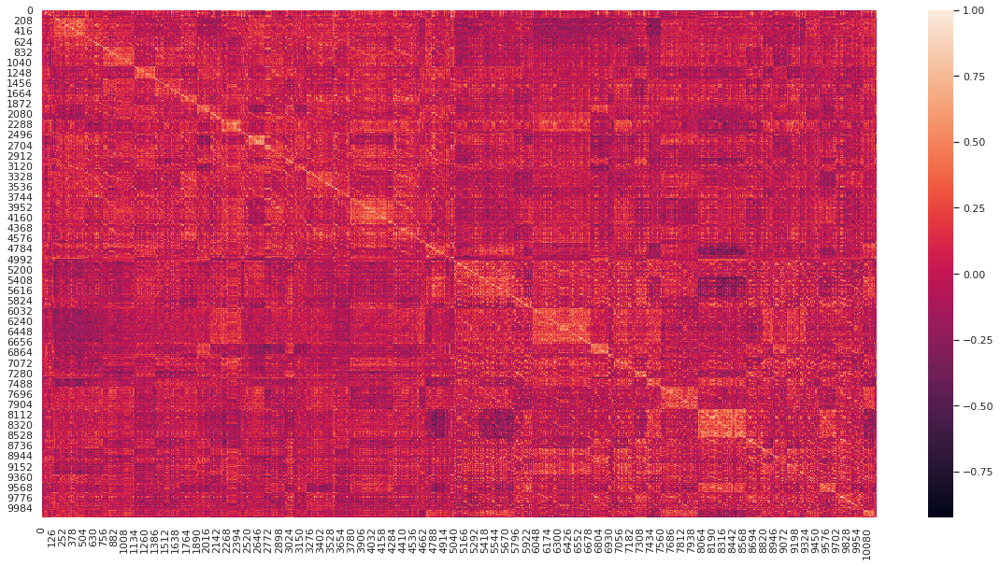

In [12]:
# previous heatmap

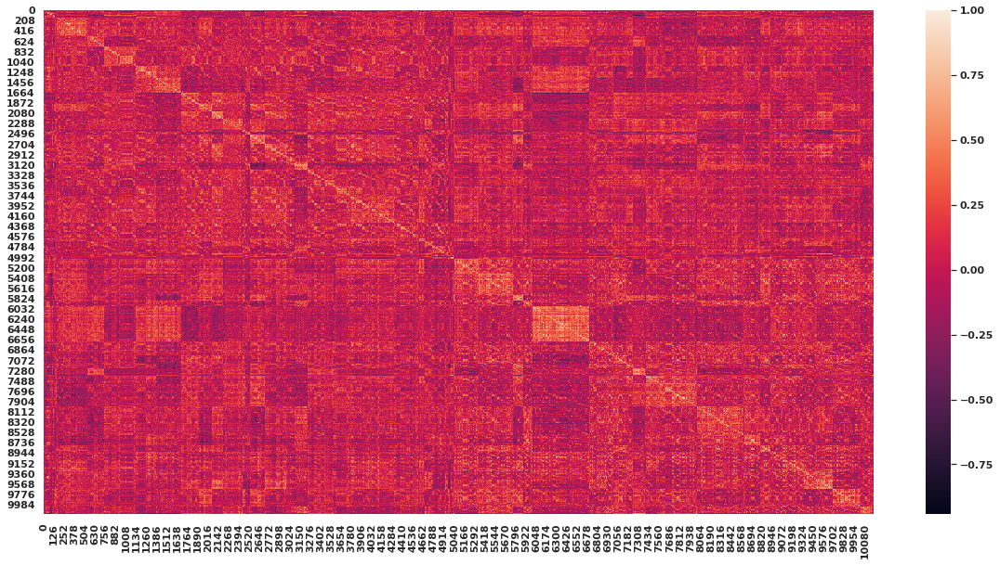